**Importing Libraries**



In [ ]:
from ast import increment_lineno
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import datetime
import sklearn.metrics as Metrics
%matplotlib inline
import os
import warnings
warnings.filterwarnings("ignore")



In [ ]:
df= pd.read_csv("/content/drive/MyDrive/archive/application_data.csv")

In [ ]:
df=pd.DataFrame(df);

**Learning about the data first**

In [ ]:
df.shape

(307511, 122)

In [ ]:
df.info(verbose = True,show_counts = True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 122 columns):
 #    Column                        Non-Null Count   Dtype  
---   ------                        --------------   -----  
 0    SK_ID_CURR                    307511 non-null  int64  
 1    TARGET                        307511 non-null  int64  
 2    NAME_CONTRACT_TYPE            307511 non-null  object 
 3    CODE_GENDER                   307511 non-null  object 
 4    FLAG_OWN_CAR                  307511 non-null  object 
 5    FLAG_OWN_REALTY               307511 non-null  object 
 6    CNT_CHILDREN                  307511 non-null  int64  
 7    AMT_INCOME_TOTAL              307511 non-null  float64
 8    AMT_CREDIT                    307511 non-null  float64
 9    AMT_ANNUITY                   307499 non-null  float64
 10   AMT_GOODS_PRICE               307233 non-null  float64
 11   NAME_TYPE_SUITE               306219 non-null  object 
 12   NAME_INCOME_TYPE            

In [ ]:
df.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.000000,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307499.000000,3.072330e+05,307511.000000,307511.000000,307511.000000,...,307511.000000,307511.000000,307511.000000,307511.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
mean,278180.518577,0.080729,0.417052,1.687979e+05,5.990260e+05,27108.573909,5.383962e+05,0.020868,-16036.995067,63815.045904,...,0.008130,0.000595,0.000507,0.000335,0.006402,0.007000,0.034362,0.267395,0.265474,1.899974
std,102790.175348,0.272419,0.722121,2.371231e+05,4.024908e+05,14493.737315,3.694465e+05,0.013831,4363.988632,141275.766519,...,0.089798,0.024387,0.022518,0.018299,0.083849,0.110757,0.204685,0.916002,0.794056,1.869295
min,100002.000000,0.000000,0.000000,2.565000e+04,4.500000e+04,1615.500000,4.050000e+04,0.000290,-25229.000000,-17912.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,189145.500000,0.000000,0.000000,1.125000e+05,2.700000e+05,16524.000000,2.385000e+05,0.010006,-19682.000000,-2760.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,278202.000000,0.000000,0.000000,1.471500e+05,5.135310e+05,24903.000000,4.500000e+05,0.018850,-15750.000000,-1213.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,367142.500000,0.000000,1.000000,2.025000e+05,8.086500e+05,34596.000000,6.795000e+05,0.028663,-12413.000000,-289.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
max,456255.000000,1.000000,19.000000,1.170000e+08,4.050000e+06,258025.500000,4.050000e+06,0.072508,-7489.000000,365243.000000,...,1.000000,1.000000,1.000000,1.000000,4.000000,9.000000,8.000000,27.000000,261.000000,25.000000


In [ ]:
df.dtypes.unique()

array([dtype('int64'), dtype('O'), dtype('float64')], dtype=object)

In [ ]:
pd.options.display.max_columns = 124
df.head(10)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

**CLEANING DATA AND HANDLING MISSING AND/OR NULL VALUES**

In [ ]:
df.isnull().values.any()

True

This shows that we do have null values in our data.
Let's check the percentage of missing values in each column.

In [ ]:


null_percent =round((df.isnull().sum()/df.shape[0])*100, 2 )

null_percent

SK_ID_CURR                     0.0
TARGET                         0.0
NAME_CONTRACT_TYPE             0.0
CODE_GENDER                    0.0
FLAG_OWN_CAR                   0.0
                              ... 
AMT_REQ_CREDIT_BUREAU_DAY     13.5
AMT_REQ_CREDIT_BUREAU_WEEK    13.5
AMT_REQ_CREDIT_BUREAU_MON     13.5
AMT_REQ_CREDIT_BUREAU_QRT     13.5
AMT_REQ_CREDIT_BUREAU_YEAR    13.5
Length: 122, dtype: float64

In [ ]:

# Creating a dataframe to store columns name and their respective null percentage
null_df = pd.DataFrame({'column_name' : df.columns,'null_percent': null_percent})
null_df.reset_index(drop = True, inplace = True)
null_df

,column_name,null_percent
0,SK_ID_CURR,0.0
1,TARGET,0.0
2,NAME_CONTRACT_TYPE,0.0
3,CODE_GENDER,0.0
4,FLAG_OWN_CAR,0.0
...,...,...
117,AMT_REQ_CREDIT_BUREAU_DAY,13.5
118,AMT_REQ_CREDIT_BUREAU_WEEK,13.5
119,AMT_REQ_CREDIT_BUREAU_MON,13.5
120,AMT_REQ_CREDIT_BUREAU_QRT,13.5


In [ ]:
# Sorting columns with null percentage more than 45
greaterThn45= null_df[null_df["null_percent"]>45]
greaterThn45.sort_values(by="null_percent", ascending=False)

,column_name,null_percent
48,COMMONAREA_AVG,69.87
76,COMMONAREA_MEDI,69.87
62,COMMONAREA_MODE,69.87
84,NONLIVINGAPARTMENTS_MEDI,69.43
70,NONLIVINGAPARTMENTS_MODE,69.43
56,NONLIVINGAPARTMENTS_AVG,69.43
86,FONDKAPREMONT_MODE,68.39
82,LIVINGAPARTMENTS_MEDI,68.35
54,LIVINGAPARTMENTS_AVG,68.35
68,LIVINGAPARTMENTS_MODE,68.35


In [ ]:
# Deleting columns with null percentage greater than 45%
columnsToDelete=greaterThn45["column_name"]
columnsToDelete



21                     OWN_CAR_AGE
41                    EXT_SOURCE_1
44                  APARTMENTS_AVG
45                BASEMENTAREA_AVG
46     YEARS_BEGINEXPLUATATION_AVG
47                 YEARS_BUILD_AVG
48                  COMMONAREA_AVG
49                   ELEVATORS_AVG
50                   ENTRANCES_AVG
51                   FLOORSMAX_AVG
52                   FLOORSMIN_AVG
53                    LANDAREA_AVG
54            LIVINGAPARTMENTS_AVG
55                  LIVINGAREA_AVG
56         NONLIVINGAPARTMENTS_AVG
57               NONLIVINGAREA_AVG
58                 APARTMENTS_MODE
59               BASEMENTAREA_MODE
60    YEARS_BEGINEXPLUATATION_MODE
61                YEARS_BUILD_MODE
62                 COMMONAREA_MODE
63                  ELEVATORS_MODE
64                  ENTRANCES_MODE
65                  FLOORSMAX_MODE
66                  FLOORSMIN_MODE
67                   LANDAREA_MODE
68           LIVINGAPARTMENTS_MODE
69                 LIVINGAREA_MODE
70        NONLIVINGA

Columns with a substantial number of missing values may not contribute much to the analysis, and including them could introduce noise into the results. So we'll drop such columns.

In [ ]:
df.drop(columns=columnsToDelete, inplace=True);
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 73 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   SK_ID_CURR                   307511 non-null  int64  
 1   TARGET                       307511 non-null  int64  
 2   NAME_CONTRACT_TYPE           307511 non-null  object 
 3   CODE_GENDER                  307511 non-null  object 
 4   FLAG_OWN_CAR                 307511 non-null  object 
 5   FLAG_OWN_REALTY              307511 non-null  object 
 6   CNT_CHILDREN                 307511 non-null  int64  
 7   AMT_INCOME_TOTAL             307511 non-null  float64
 8   AMT_CREDIT                   307511 non-null  float64
 9   AMT_ANNUITY                  307499 non-null  float64
 10  AMT_GOODS_PRICE              307233 non-null  float64
 11  NAME_TYPE_SUITE              306219 non-null  object 
 12  NAME_INCOME_TYPE             307511 non-null  object 
 13 

We cleaned data that had missing values percentage greater than 45%, but we still need to clean other columns which have missing avlues less then 45%


In [ ]:
lessThan45= null_df[null_df["null_percent"] <45]
lessThan45.sort_values(by="null_percent", ascending=False)

,column_name,null_percent
28,OCCUPATION_TYPE,31.35
43,EXT_SOURCE_3,19.83
121,AMT_REQ_CREDIT_BUREAU_YEAR,13.50
120,AMT_REQ_CREDIT_BUREAU_QRT,13.50
119,AMT_REQ_CREDIT_BUREAU_MON,13.50
...,...,...
33,HOUR_APPR_PROCESS_START,0.00
34,REG_REGION_NOT_LIVE_REGION,0.00
35,REG_REGION_NOT_WORK_REGION,0.00
36,LIVE_REGION_NOT_WORK_REGION,0.00


Learning about Occupation Type

In [ ]:
df['OCCUPATION_TYPE'].describe()

count       211120
unique          18
top       Laborers
freq         55186
Name: OCCUPATION_TYPE, dtype: object

In [ ]:
df['OCCUPATION_TYPE'].value_counts()

Laborers                 55186
Sales staff              32102
Core staff               27570
Managers                 21371
Drivers                  18603
High skill tech staff    11380
Accountants               9813
Medicine staff            8537
Security staff            6721
Cooking staff             5946
Cleaning staff            4653
Private service staff     2652
Low-skill Laborers        2093
Waiters/barmen staff      1348
Secretaries               1305
Realty agents              751
HR staff                   563
IT staff                   526
Name: OCCUPATION_TYPE, dtype: int64

In [ ]:
df['OCCUPATION_TYPE'].isnull().sum()

96391

In [ ]:
df['OCCUPATION_TYPE'].fillna(value = 'Unidentified', inplace = True)

Filling missing/null values with Unidentified

Learning about EXT_SOURCE_3

In [ ]:
df['EXT_SOURCE_3'].value_counts()

0.746300    1460
0.713631    1315
0.694093    1276
0.670652    1191
0.652897    1154
            ... 
0.021492       1
0.019468       1
0.023062       1
0.014556       1
0.043227       1
Name: EXT_SOURCE_3, Length: 814, dtype: int64

In [ ]:
df['EXT_SOURCE_3'].describe()

count    246546.000000
mean          0.510853
std           0.194844
min           0.000527
25%           0.370650
50%           0.535276
75%           0.669057
max           0.896010
Name: EXT_SOURCE_3, dtype: float64

In [ ]:
df['EXT_SOURCE_3'].median()

0.5352762504724826

<Axes: xlabel='EXT_SOURCE_3'>

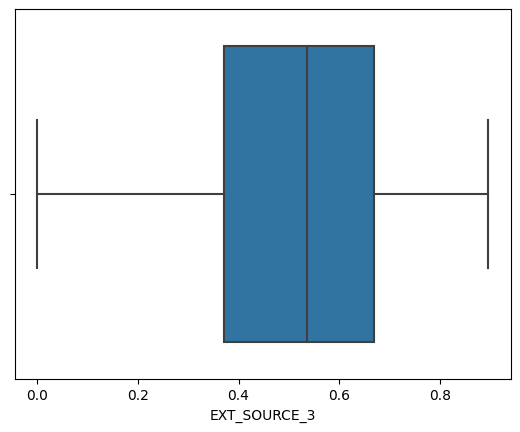

In [ ]:
sns.boxplot(x='EXT_SOURCE_3', data=df)

(array([ 4451., 11560., 17478., 24201., 30475., 35867., 41263., 42931.,
        30574.,  7746.]),
 array([5.27265239e-04, 9.00754937e-02, 1.79623722e-01, 2.69171951e-01,
        3.58720179e-01, 4.48268407e-01, 5.37816636e-01, 6.27364864e-01,
        7.16913093e-01, 8.06461321e-01, 8.96009549e-01]),
 <BarContainer object of 10 artists>)

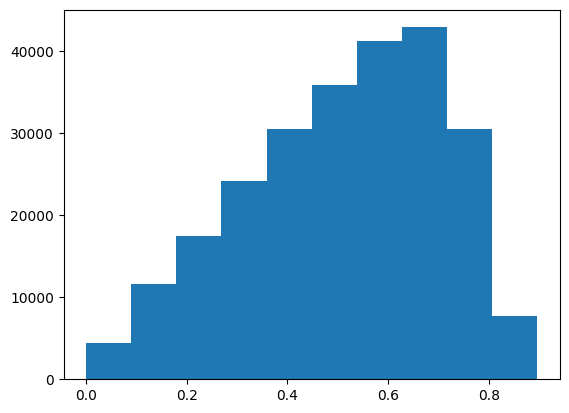

In [ ]:
plt.hist(x='EXT_SOURCE_3', data=df)

As we can see there are no outliers, lets replace the values with median as we can observe negative or left skewness.

In [ ]:
df['EXT_SOURCE_3']=df['EXT_SOURCE_3'].fillna(df['EXT_SOURCE_3'].median())


Learning about EXT_SOURCE_2



In [ ]:
df['EXT_SOURCE_2'].isnull().sum()

660

In [ ]:
df['EXT_SOURCE_2'].describe()

count    3.068510e+05
mean     5.143927e-01
std      1.910602e-01
min      8.173617e-08
25%      3.924574e-01
50%      5.659614e-01
75%      6.636171e-01
max      8.549997e-01
Name: EXT_SOURCE_2, dtype: float64

<Axes: xlabel='EXT_SOURCE_2'>

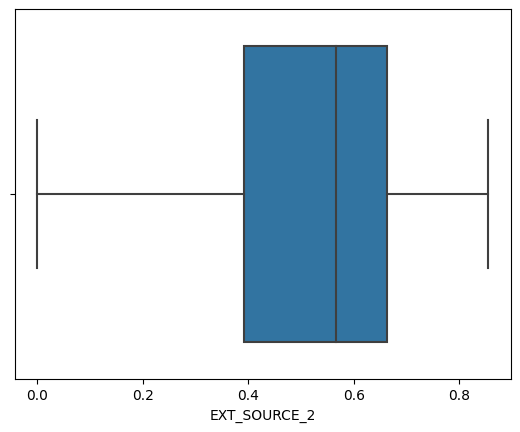

In [ ]:
sns.boxplot(x='EXT_SOURCE_2', data=df)

(array([ 9475., 12979., 16656., 22918., 25715., 35420., 53488., 70443.,
        53309.,  6448.]),
 array([8.17361652e-08, 8.55000402e-02, 1.70999999e-01, 2.56499957e-01,
        3.41999916e-01, 4.27499874e-01, 5.12999833e-01, 5.98499791e-01,
        6.83999749e-01, 7.69499708e-01, 8.54999666e-01]),
 <BarContainer object of 10 artists>)

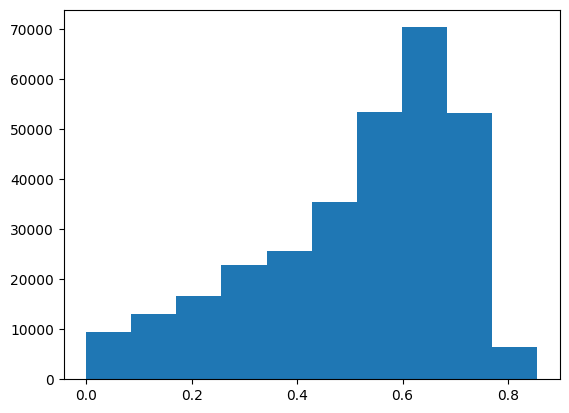

In [ ]:
plt.hist(x='EXT_SOURCE_2', data=df)

We observe a similar pattern like one observed in EXT_SOURCE_3, so lets replace null values with median

In [ ]:
df['EXT_SOURCE_2']=df['EXT_SOURCE_2'].fillna(df['EXT_SOURCE_2'].median())

Looking at remaining columns

In [ ]:
lessThan45[lessThan45['null_percent']>0].sort_values(by="null_percent", ascending=False)

,column_name,null_percent
28,OCCUPATION_TYPE,31.35
43,EXT_SOURCE_3,19.83
116,AMT_REQ_CREDIT_BUREAU_HOUR,13.50
117,AMT_REQ_CREDIT_BUREAU_DAY,13.50
118,AMT_REQ_CREDIT_BUREAU_WEEK,13.50
119,AMT_REQ_CREDIT_BUREAU_MON,13.50
120,AMT_REQ_CREDIT_BUREAU_QRT,13.50
121,AMT_REQ_CREDIT_BUREAU_YEAR,13.50
11,NAME_TYPE_SUITE,0.42
91,OBS_30_CNT_SOCIAL_CIRCLE,0.33


In [ ]:

amtlist=["AMT_REQ_CREDIT_BUREAU_YEAR",	"AMT_REQ_CREDIT_BUREAU_HOUR", "AMT_REQ_CREDIT_BUREAU_DAY", "AMT_REQ_CREDIT_BUREAU_WEEK", "AMT_REQ_CREDIT_BUREAU_MON", "AMT_REQ_CREDIT_BUREAU_QRT", "AMT_REQ_CREDIT_BUREAU_YEAR"]


The list above doesnot makes much sense to be different columns, if we perform or operation on these columns it will be easier to do analysis and make our data concise





In [ ]:
df['AMT_REQ_CREDIT_BUREAU_TOTAL']= df.loc[:,["AMT_REQ_CREDIT_BUREAU_HOUR", "AMT_REQ_CREDIT_BUREAU_DAY", "AMT_REQ_CREDIT_BUREAU_WEEK" ,"AMT_REQ_CREDIT_BUREAU_MON", "AMT_REQ_CREDIT_BUREAU_QRT", "AMT_REQ_CREDIT_BUREAU_YEAR"]].any(axis=1).astype(int)


In [ ]:
df['AMT_REQ_CREDIT_BUREAU_TOTAL'].unique()

array([1, 0])

So here we created a new variable which is 1 if client failed to provide any document between 2 and 21 or 0 if he submitted all documents.

In [ ]:
# also lets drop other columns as we have created the total column
df.drop(columns=amtlist, inplace=True)

In [ ]:
df.head(10)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_TOTAL
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.262949,0.139376,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.622246,0.535276,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,0.555912,0.729567,0.0,0.0,0.0,0.0,-815.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,-19005,-3039,-9833.0,-2437,1,1,0,1,0,0,Laborers,2.0,2,2,WEDNESDAY,17,0,0,0,0,0,0,Business Entity Type 3,0.650442,0.535276,2.0,0.0,2.0,0.0,-617.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,-19932,-3038,-4311.0,-3458,1,1,0,1,0,0,Core staff,1.0,2,2,THURSDAY,11,0,0,0,0,1,1,Religion,0.322738,0.535276,0.0,0.0,0.0,0.0,-1106.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,100008,0,Cash loans,M,N,Y,0,99000.0,490495.5,27517.5,454500.0,"Spouse, partner",State servant,Secondary / secondary special,Married,House / apartment,0.035792,-16941,-1588,-4970.0,-477,1,1,1,1,1,0,Laborers,2.0,2,2,WEDNESDAY,16,0,0,0,0,0,0,Other,0.354225,0.621226,0.0,0.0,0.0,0.0,-2536.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
6,100009,0,Cash loans,F,Y,Y,1,171000.0,1560726.0,41301.0,1395000.0,Unaccompanied,Commercial associate,Higher education,Married,House / apartment,0.035792,-13778,-3130,-1213.0,-619,1,1,0,1,1,0,Accountants,3.0,2,2,SUNDAY,16,0,0,0,0,0,0,Business Entity Type 3,0.724000,0.492060,1.0,0.0,1.0,0.0,-1562.0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1
7,100010,0,Cash loans,M,Y,Y,0,360000.0,1530000.0,42075.0,1530000.0,Unaccompanied,State servant,Higher education,Married,House / apartment,0.003122,-18850,-449,-4597.0,-2379,1,1,1,1,0,0,Managers,2.0,3,3,MONDAY,16,0,0,0,0,1,1,Other,0.714279,0.540654,2.0,0.0,2.0,0.0,-1070.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8,100011,0,Cash loans,F,N,Y,0,112500.0,1019610.0,33826.5,913500.0,Children,Pensioner,Secondary / secondary special

Observations:

 It is quite evident that DAYS_BIRTH,	DAYS_EMPLOYED,	DAYS_REGISTRATION and	DAYS_ID_PUBLISH	have negative values. Lets see DAYS_BIRTH for instance

In [ ]:
df['DAYS_BIRTH'].head(10)

0    -9461
1   -16765
2   -19046
3   -19005
4   -19932
5   -16941
6   -13778
7   -18850
8   -20099
9   -14469
Name: DAYS_BIRTH, dtype: int64

We can see it has negative values also the birth date is given in days so we'll make it positive and convert it into years


In [ ]:
# Create AGE_YEARS variable
df['AGE_YEARS'] = (df['DAYS_BIRTH'] // 365).abs()

Similarly lets take absolute value of DAYS_EMPLOYED, DAYS_REGISTRATION and DAYS_ID_PUBLISH and conver them into years for conistency.



In [ ]:
df['DAYS_EMPLOYED']=(df['DAYS_EMPLOYED']// 365).abs()



In [ ]:
df['DAYS_REGISTRATION']=(df['DAYS_REGISTRATION'] // 365).abs()
df['DAYS_REGISTRATION']

0         10.0
1          4.0
2         12.0
3         27.0
4         12.0
          ... 
307506    24.0
307507    13.0
307508    19.0
307509     8.0
307510    15.0
Name: DAYS_REGISTRATION, Length: 307511, dtype: float64

In [ ]:
df['DAYS_ID_PUBLISH']=(df['DAYS_ID_PUBLISH'] // 365).abs()
df['DAYS_ID_PUBLISH']

0          6
1          1
2          7
3          7
4         10
          ..
307506     6
307507    12
307508    15
307509     3
307510     2
Name: DAYS_ID_PUBLISH, Length: 307511, dtype: int64

Since we changed all these days column to positive values and also transformed them into years it makes more sense to change the respective column names

In [ ]:

# Renaming columns
df.rename(columns={'DAYS_ID_PUBLISH': 'YEARS_ID_PUBLISH', 'DAYS_REGISTRATION': 'YEARS_REGISTRATION', 'DAYS_EMPLOYED': 'YEARS_EMPLOYED'}, inplace=True)

df.head()


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,YEARS_EMPLOYED,YEARS_REGISTRATION,YEARS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_TOTAL,AGE_YEARS
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,2,10.0,6,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.262949,0.139376,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,26
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,4,4.0,1,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.622246,0.535276,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,46
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,1,12.0,7,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,0.555912,0.729567,0.0,0.0,0.0,0.0,-815.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,53
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,-19005,9,27.0,7,1,1,0,1,0,0,Laborers,2.0,2,2,WEDNESDAY,17,0,0,0,0,0,0,Business Entity Type 3,0.650442,0.535276,2.0,0.0,2.0,0.0,-617.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,53
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,-19932,9,12.0,10,1,1,0,1,0,0,Core staff,1.0,2,2,THURSDAY,11,0,0,0,0,1,1,Religion,0.322738,0.535276,0.0,0.0,0.0,0.0,-1106.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,55


In [ ]:
# getting unique values for gender
df['CODE_GENDER'].unique()

array(['M', 'F', 'XNA'], dtype=object)

In [ ]:
df['CODE_GENDER'].value_counts()

F      202448
M      105059
XNA         4
Name: CODE_GENDER, dtype: int64

In [ ]:
df['CODE_GENDER'].describe()

count     307511
unique         3
top            F
freq      202448
Name: CODE_GENDER, dtype: object

In [ ]:
df['CODE_GENDER'].mode()

0    F
Name: CODE_GENDER, dtype: object

Here we can see XNA as a gender which is obviously not correct.
Since XNA values are insignificant and will not impact the analysis, let's include them in the mode.

In [ ]:
df["CODE_GENDER"].replace("XNA", "F", inplace = True)

In [ ]:
df['CODE_GENDER'].value_counts()

F    202452
M    105059
Name: CODE_GENDER, dtype: int64

<Axes: xlabel='CODE_GENDER', ylabel='count'>

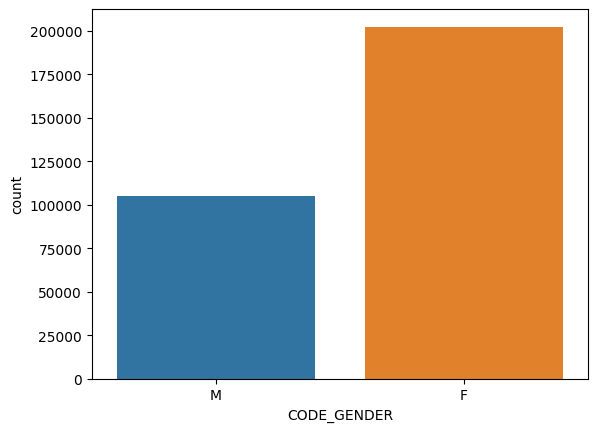

In [ ]:
sns.countplot(x='CODE_GENDER', data=df)

Lets get rid of all these remaining null values and start with analysing more deeply.


In [ ]:
df["AMT_ANNUITY"].value_counts()

9000.0      6385
13500.0     5514
6750.0      2279
10125.0     2035
37800.0     1602
            ... 
79902.0        1
106969.5       1
60885.0        1
59661.0        1
77809.5        1
Name: AMT_ANNUITY, Length: 13672, dtype: int64

In [ ]:
df["AMT_ANNUITY"].describe()

count    307499.000000
mean      27108.573909
std       14493.737315
min        1615.500000
25%       16524.000000
50%       24903.000000
75%       34596.000000
max      258025.500000
Name: AMT_ANNUITY, dtype: float64

In [ ]:
df["AMT_ANNUITY"].isnull().sum()

12

Let's replace the missing values with 0 as there are not many null values


In [ ]:
df["AMT_ANNUITY"]=df["AMT_ANNUITY"].fillna(0)

Let's plot a distribution and box plot to better understand the  AMT_ANNUITY variable.

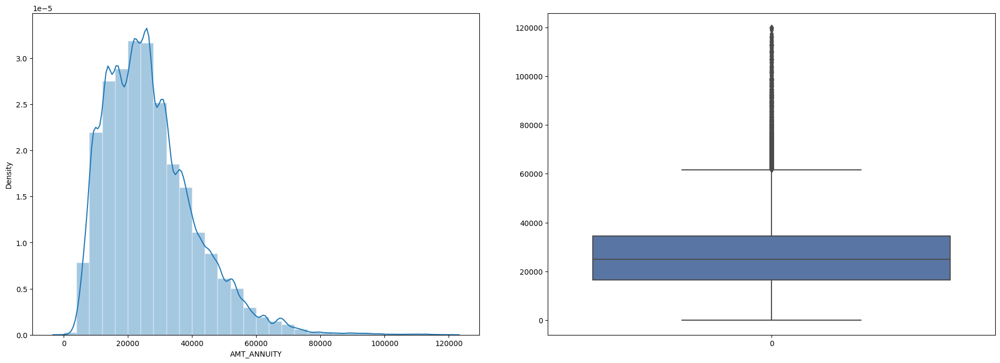

In [ ]:
plt.subplots(1,2,figsize=(20,8))
sns.set(style="whitegrid")

# Create a distribution plot
plt.subplot(121)
sns.distplot(df[df['AMT_ANNUITY']<120000].AMT_ANNUITY, kde=True, bins=30)


# Create a Box plot

plt.subplot(122)
sns.boxplot(df[df['AMT_ANNUITY']<120000].AMT_ANNUITY)

plt.tight_layout(pad = 4)
plt.show()

In [ ]:
df["AMT_GOODS_PRICE"].isnull().sum()

278

In [ ]:
df["AMT_GOODS_PRICE"].describe()

count    3.072330e+05
mean     5.383962e+05
std      3.694465e+05
min      4.050000e+04
25%      2.385000e+05
50%      4.500000e+05
75%      6.795000e+05
max      4.050000e+06
Name: AMT_GOODS_PRICE, dtype: float64

Let's plot a histogram to better understand the column.

(array([1.31712e+05, 1.15261e+05, 4.36580e+04, 1.24290e+04, 3.17500e+03,
        9.33000e+02, 3.00000e+01, 1.70000e+01, 8.00000e+00, 1.00000e+01]),
 array([  40500.,  441450.,  842400., 1243350., 1644300., 2045250.,
        2446200., 2847150., 3248100., 3649050., 4050000.]),
 <BarContainer object of 10 artists>)

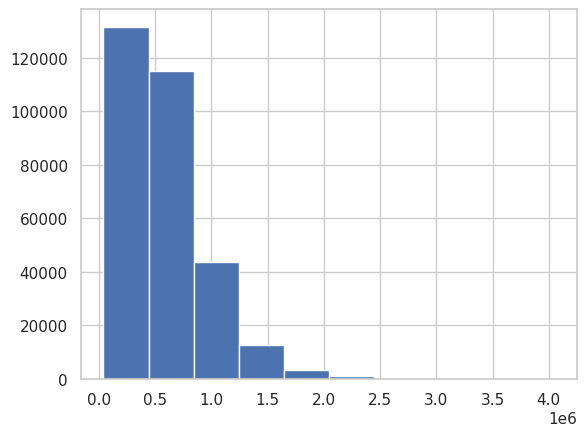

In [ ]:
plt.hist(df['AMT_GOODS_PRICE'])

As you can see the max and min varies extensively , we can impute missing values using median as the mean will skew the data

In [ ]:
df["AMT_GOODS_PRICE"]=df["AMT_GOODS_PRICE"].fillna(df["AMT_GOODS_PRICE"].median())

<Axes: xlabel='AMT_GOODS_PRICE', ylabel='Density'>

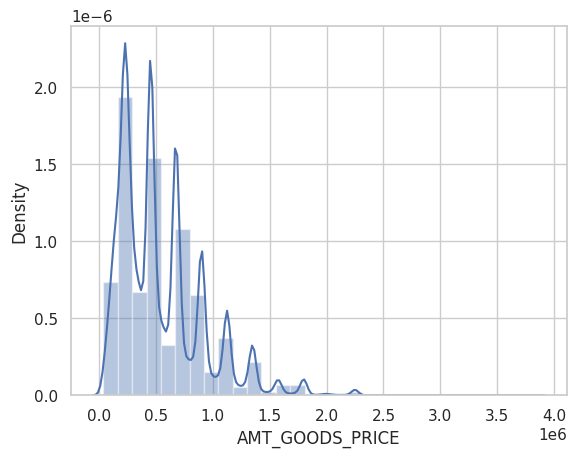

In [ ]:


# Create a distribution plot
sns.distplot(df[df['AMT_GOODS_PRICE']<df['AMT_GOODS_PRICE'].max()].AMT_GOODS_PRICE, kde=True, bins=30)




In [ ]:
df["NAME_TYPE_SUITE"].isnull().sum()

1292

In [ ]:
df["NAME_TYPE_SUITE"].value_counts()

Unaccompanied      248526
Family              40149
Spouse, partner     11370
Children             3267
Other_B              1770
Other_A               866
Group of people       271
Name: NAME_TYPE_SUITE, dtype: int64

In [ ]:
df["NAME_TYPE_SUITE"].describe()

count            306219
unique                7
top       Unaccompanied
freq             248526
Name: NAME_TYPE_SUITE, dtype: object

Here we can see the maximum values belong to Unaccompanied section/category,
we have 1292 null values.
To deal with such values we will replace null values with Unaccompanied so that it doesn't impact our analysis.

In [ ]:
df["NAME_TYPE_SUITE"]=df["NAME_TYPE_SUITE"].fillna("Unaccompanied")

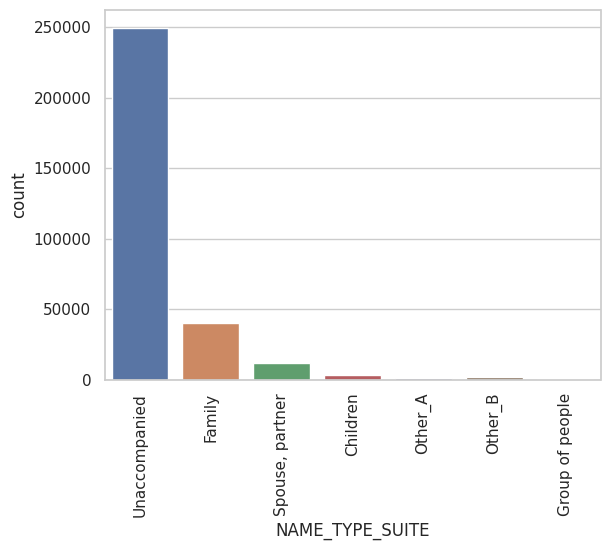

In [ ]:
sns.countplot(x='NAME_TYPE_SUITE', data=df)
plt.xticks(rotation=90)
plt.show()

In [ ]:
df["OBS_30_CNT_SOCIAL_CIRCLE"].describe()

count    306490.000000
mean          1.422245
std           2.400989
min           0.000000
25%           0.000000
50%           0.000000
75%           2.000000
max         348.000000
Name: OBS_30_CNT_SOCIAL_CIRCLE, dtype: float64

In [ ]:
df["OBS_30_CNT_SOCIAL_CIRCLE"].median()

0.0

<Axes: xlabel='OBS_30_CNT_SOCIAL_CIRCLE'>

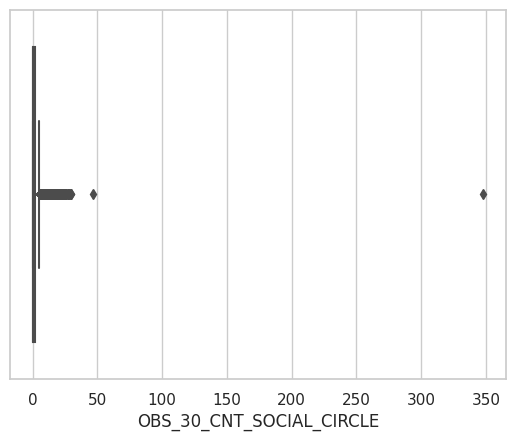

In [ ]:
sns.boxplot(x='OBS_30_CNT_SOCIAL_CIRCLE', data=df)

By examining the data it seems we should impute the null values with median

In [ ]:
df["OBS_30_CNT_SOCIAL_CIRCLE"]=df["OBS_30_CNT_SOCIAL_CIRCLE"].fillna(df["OBS_30_CNT_SOCIAL_CIRCLE"].median())

In [ ]:
df["DEF_30_CNT_SOCIAL_CIRCLE"].describe()

count    306490.000000
mean          0.143421
std           0.446698
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max          34.000000
Name: DEF_30_CNT_SOCIAL_CIRCLE, dtype: float64

<Axes: xlabel='DEF_30_CNT_SOCIAL_CIRCLE'>

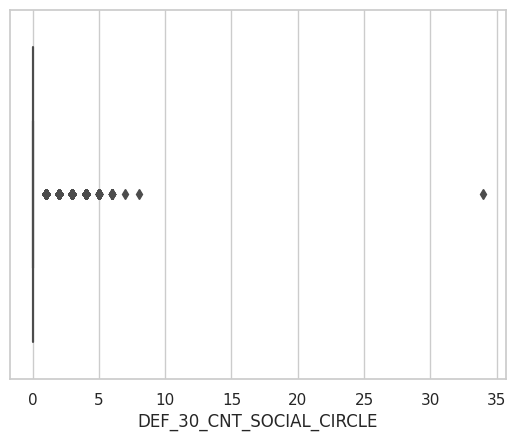

In [ ]:
sns.boxplot(x='DEF_30_CNT_SOCIAL_CIRCLE', data=df)

In [ ]:
#filling missing values with mean as the data is continuous
df["DEF_30_CNT_SOCIAL_CIRCLE"] = df["DEF_30_CNT_SOCIAL_CIRCLE"].fillna(df["DEF_30_CNT_SOCIAL_CIRCLE"].mean())

In [ ]:
df['OBS_60_CNT_SOCIAL_CIRCLE'].describe()

count    306490.000000
mean          1.405292
std           2.379803
min           0.000000
25%           0.000000
50%           0.000000
75%           2.000000
max         344.000000
Name: OBS_60_CNT_SOCIAL_CIRCLE, dtype: float64

<Axes: xlabel='OBS_60_CNT_SOCIAL_CIRCLE'>

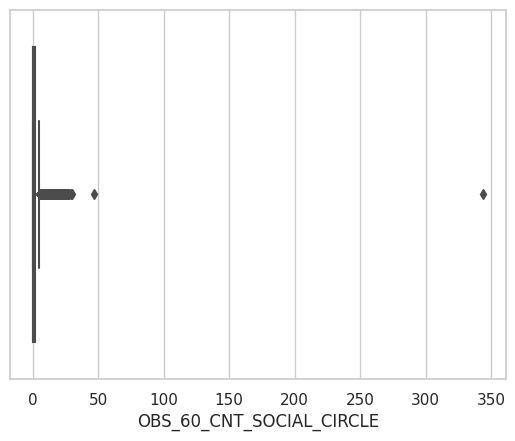

In [ ]:
sns.boxplot(x='OBS_60_CNT_SOCIAL_CIRCLE', data=df)

(array([3.06488e+05, 1.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00,
        0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00, 1.00000e+00]),
 array([  0. ,  34.4,  68.8, 103.2, 137.6, 172. , 206.4, 240.8, 275.2,
        309.6, 344. ]),
 <BarContainer object of 10 artists>)

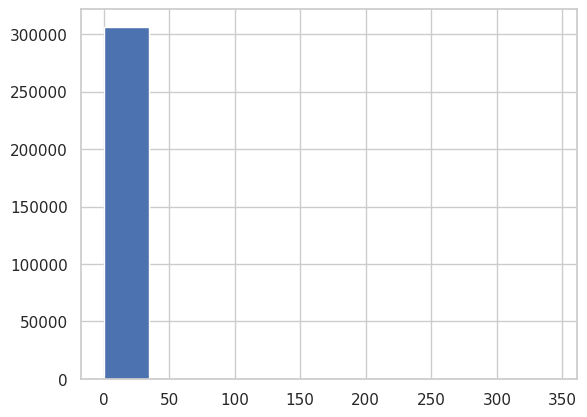

In [ ]:
plt.hist(x='OBS_60_CNT_SOCIAL_CIRCLE', data=df)

Lets replace the null values with median.

In [ ]:
df["OBS_60_CNT_SOCIAL_CIRCLE"]=df["OBS_60_CNT_SOCIAL_CIRCLE"].fillna(df["OBS_60_CNT_SOCIAL_CIRCLE"].median())

In [ ]:
df['DEF_60_CNT_SOCIAL_CIRCLE'].describe()

count    306490.000000
mean          0.100049
std           0.362291
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max          24.000000
Name: DEF_60_CNT_SOCIAL_CIRCLE, dtype: float64

<Axes: xlabel='DEF_60_CNT_SOCIAL_CIRCLE'>

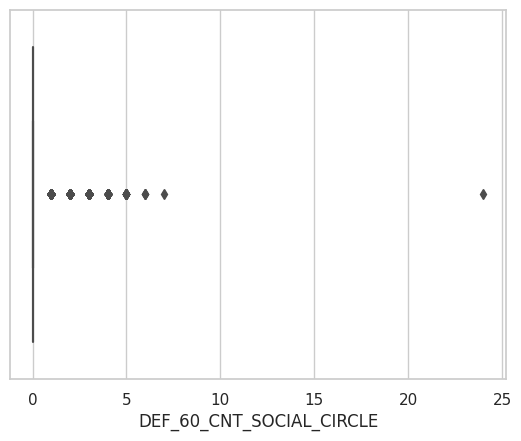

In [ ]:
sns.boxplot(x='DEF_60_CNT_SOCIAL_CIRCLE', data=df)

(array([3.05732e+05, 7.33000e+02, 2.40000e+01, 0.00000e+00, 0.00000e+00,
        0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00, 1.00000e+00]),
 array([ 0. ,  2.4,  4.8,  7.2,  9.6, 12. , 14.4, 16.8, 19.2, 21.6, 24. ]),
 <BarContainer object of 10 artists>)

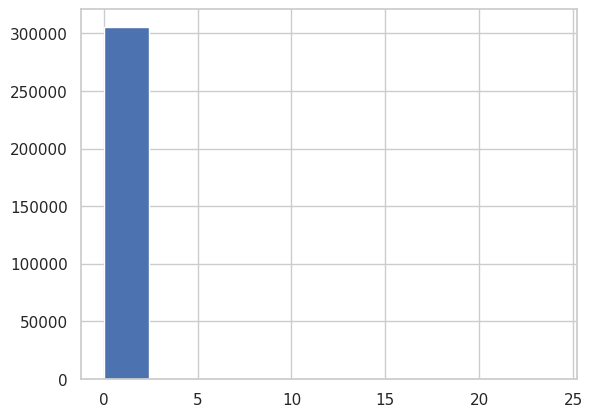

In [ ]:
plt.hist(x='DEF_60_CNT_SOCIAL_CIRCLE', data=df)

In [ ]:
# Lets replace the null values with median.
df["DEF_60_CNT_SOCIAL_CIRCLE"]=df["DEF_60_CNT_SOCIAL_CIRCLE"].fillna(df["DEF_60_CNT_SOCIAL_CIRCLE"].median())

In [ ]:
df['CNT_FAM_MEMBERS'].value_counts()

2.0     158357
1.0      67847
3.0      52601
4.0      24697
5.0       3478
6.0        408
7.0         81
8.0         20
9.0          6
10.0         3
14.0         2
12.0         2
20.0         2
16.0         2
13.0         1
15.0         1
11.0         1
Name: CNT_FAM_MEMBERS, dtype: int64

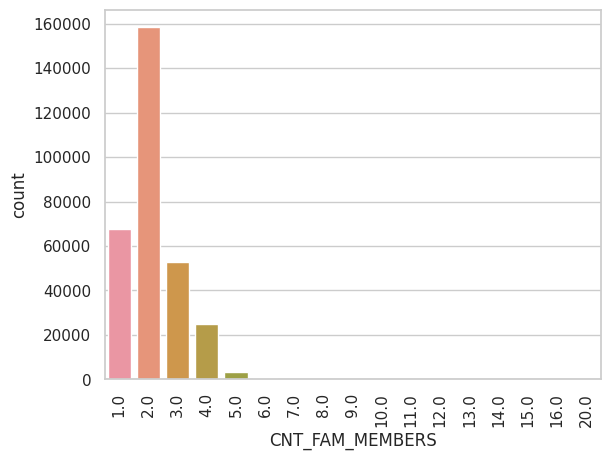

In [ ]:
sns.countplot(data=df, x='CNT_FAM_MEMBERS')
plt.xticks(rotation=90)
plt.show()

In [ ]:
df["DAYS_LAST_PHONE_CHANGE"].value_counts()

 0.0       37672
-1.0        2812
-2.0        2318
-3.0        1763
-4.0        1285
           ...  
-4051.0        1
-3593.0        1
-3622.0        1
-3570.0        1
-3538.0        1
Name: DAYS_LAST_PHONE_CHANGE, Length: 3773, dtype: int64

In [ ]:
# lets replace missing values with mean for both the columns
df["DAYS_LAST_PHONE_CHANGE"]=df["DAYS_LAST_PHONE_CHANGE"].fillna(df["DAYS_LAST_PHONE_CHANGE"].mean())
df['CNT_FAM_MEMBERS']=df['CNT_FAM_MEMBERS'].fillna(df['CNT_FAM_MEMBERS'].mean())

In [ ]:
# Lets create a FLAG_DOCUMENT_TOTAL column which holds 1 for client who failed to submit any document between 2 and 21 and 0 if submitted all documents and drop other columns
flag_columns = df.filter(like='FLAG_DOCUMENT_').columns

df["FLAG_DOCUMENT_TOTAL"]= df[flag_columns].any(axis=1).astype(int)
df["FLAG_DOCUMENT_TOTAL"].value_counts()

df.drop(columns=["FLAG_DOCUMENT_2" ,
"FLAG_DOCUMENT_3" ,
"FLAG_DOCUMENT_4" ,
"FLAG_DOCUMENT_5" ,
"FLAG_DOCUMENT_6" ,
"FLAG_DOCUMENT_7" ,
"FLAG_DOCUMENT_8" ,
"FLAG_DOCUMENT_9" ,
"FLAG_DOCUMENT_10",
"FLAG_DOCUMENT_11",
"FLAG_DOCUMENT_12",
"FLAG_DOCUMENT_13",
"FLAG_DOCUMENT_14",
"FLAG_DOCUMENT_15",
"FLAG_DOCUMENT_16",
"FLAG_DOCUMENT_17",
"FLAG_DOCUMENT_18",
"FLAG_DOCUMENT_19",
"FLAG_DOCUMENT_20",
"FLAG_DOCUMENT_21"], inplace=True)

In [ ]:

pd.set_option('display.max_rows', None)
print(df.isnull().sum())
pd.reset_option('display.max_rows')

SK_ID_CURR                     0
TARGET                         0
NAME_CONTRACT_TYPE             0
CODE_GENDER                    0
FLAG_OWN_CAR                   0
FLAG_OWN_REALTY                0
CNT_CHILDREN                   0
AMT_INCOME_TOTAL               0
AMT_CREDIT                     0
AMT_ANNUITY                    0
AMT_GOODS_PRICE                0
NAME_TYPE_SUITE                0
NAME_INCOME_TYPE               0
NAME_EDUCATION_TYPE            0
NAME_FAMILY_STATUS             0
NAME_HOUSING_TYPE              0
REGION_POPULATION_RELATIVE     0
DAYS_BIRTH                     0
YEARS_EMPLOYED                 0
YEARS_REGISTRATION             0
YEARS_ID_PUBLISH               0
FLAG_MOBIL                     0
FLAG_EMP_PHONE                 0
FLAG_WORK_PHONE                0
FLAG_CONT_MOBILE               0
FLAG_PHONE                     0
FLAG_EMAIL                     0
OCCUPATION_TYPE                0
CNT_FAM_MEMBERS                0
REGION_RATING_CLIENT           0
REGION_RAT

Let's create a new column for children if the client has a child (1) or not (0).

In [ ]:
df["CHILDREN_FLG"]=df['CNT_CHILDREN'].apply(lambda x:1 if x>=1 else 0);
df["CHILDREN_FLG"].value_counts()

0    215371
1     92140
Name: CHILDREN_FLG, dtype: int64

Let's create a new column if the client's permanent address is different than contact/work address.

In [ ]:

flag_columns = ['REG_REGION_NOT_LIVE_REGION','REG_REGION_NOT_WORK_REGION','LIVE_REGION_NOT_WORK_REGION','REG_CITY_NOT_LIVE_CITY','REG_CITY_NOT_WORK_CITY','LIVE_CITY_NOT_WORK_CITY']

df["FLAG_DIFF_ADDRESS"] = df[flag_columns].any(axis=1).astype(int)
df["FLAG_DIFF_ADDRESS"].value_counts()

0    228354
1     79157
Name: FLAG_DIFF_ADDRESS, dtype: int64

# **LEARNING ABOUT THE DATA AND UNIVARIATE ANALYSIS**

In [ ]:
df["SK_ID_CURR"].value_counts()

100002    1
337664    1
337661    1
337660    1
337659    1
         ..
218992    1
218991    1
218990    1
218989    1
456255    1
Name: SK_ID_CURR, Length: 307511, dtype: int64

In [ ]:
df['NAME_CONTRACT_TYPE'].value_counts()

Cash loans         278232
Revolving loans     29279
Name: NAME_CONTRACT_TYPE, dtype: int64

<Axes: xlabel='NAME_CONTRACT_TYPE', ylabel='count'>

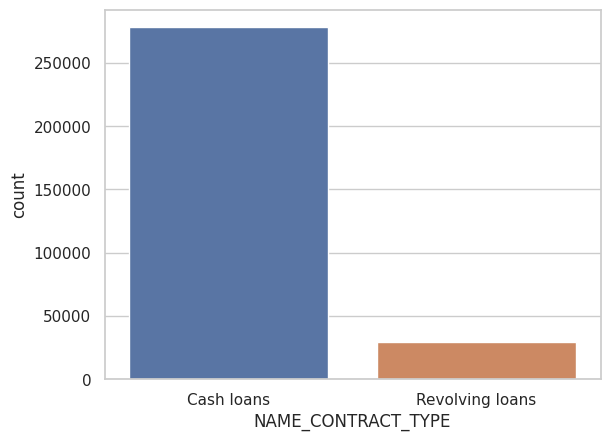

In [ ]:
sns.countplot(data=df, x='NAME_CONTRACT_TYPE')

In [ ]:
df["FLAG_OWN_CAR"].value_counts()

N    202924
Y    104587
Name: FLAG_OWN_CAR, dtype: int64

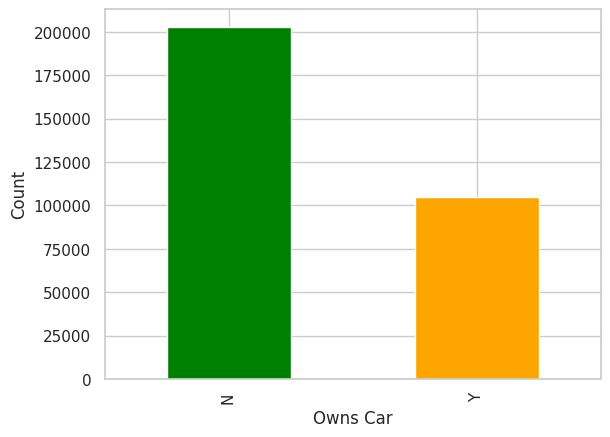

In [ ]:
vara = df["FLAG_OWN_CAR"].value_counts()
vara.plot(kind='bar', color=['green', 'orange'])

plt.xlabel('Owns Car')
plt.ylabel('Count')


# Display the plot
plt.show()


In [ ]:
df["FLAG_OWN_REALTY"].value_counts()

Y    213312
N     94199
Name: FLAG_OWN_REALTY, dtype: int64

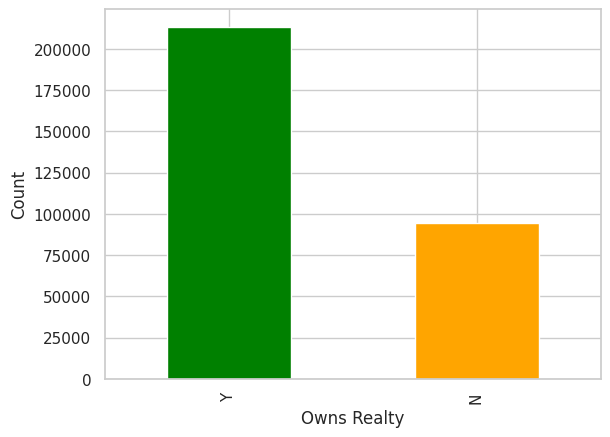

In [ ]:
vara = df["FLAG_OWN_REALTY"].value_counts()
vara.plot(kind='bar', color=['green', 'orange'])

plt.xlabel('Owns Realty')
plt.ylabel('Count')


# Display the plot
plt.show()


In [ ]:
df['CNT_CHILDREN'].value_counts()

0     215371
1      61119
2      26749
3       3717
4        429
5         84
6         21
7          7
14         3
8          2
9          2
12         2
10         2
19         2
11         1
Name: CNT_CHILDREN, dtype: int64

<Axes: xlabel='CNT_CHILDREN', ylabel='count'>

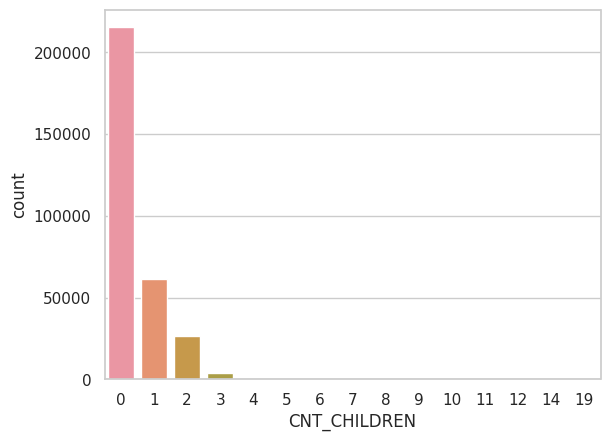

In [ ]:
sns.countplot(data=df, x='CNT_CHILDREN')


In [ ]:
df["AMT_INCOME_TOTAL"].value_counts()

135000.0    35750
112500.0    31019
157500.0    26556
180000.0    24719
90000.0     22483
            ...  
117324.0        1
64584.0         1
142897.5        1
109170.0        1
113062.5        1
Name: AMT_INCOME_TOTAL, Length: 2548, dtype: int64

<Axes: ylabel='Density'>

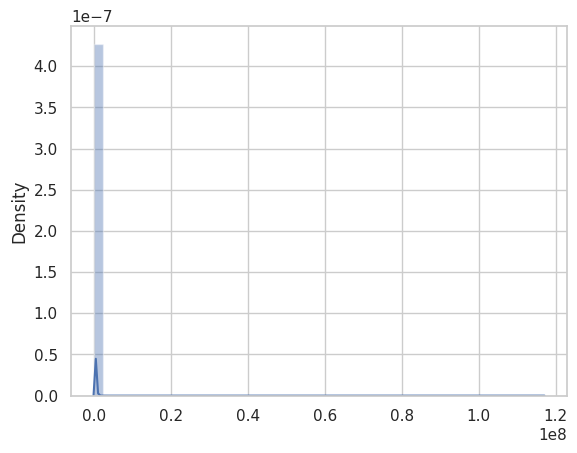

In [ ]:

sns.distplot(x=df["AMT_INCOME_TOTAL"])

(array([3.07508e+05, 2.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00,
        0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00, 1.00000e+00]),
 array([2.56500000e+04, 1.17230850e+07, 2.34205200e+07, 3.51179550e+07,
        4.68153900e+07, 5.85128250e+07, 7.02102600e+07, 8.19076950e+07,
        9.36051300e+07, 1.05302565e+08, 1.17000000e+08]),
 <BarContainer object of 10 artists>)

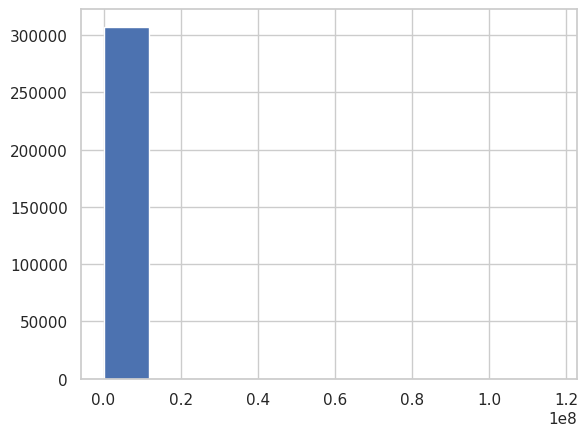

In [ ]:
plt.hist(data=df, x='AMT_INCOME_TOTAL')

In [ ]:
df['AMT_CREDIT'].value_counts()

450000.0     9709
675000.0     8877
225000.0     8162
180000.0     7342
270000.0     7241
             ... 
487318.5        1
630400.5        1
1875276.0       1
1395895.5       1
1391130.0       1
Name: AMT_CREDIT, Length: 5603, dtype: int64

(array([1.25018e+05, 1.12767e+05, 4.46440e+04, 1.87860e+04, 4.85000e+03,
        1.03000e+03, 3.73000e+02, 2.30000e+01, 8.00000e+00, 1.20000e+01]),
 array([  45000.,  445500.,  846000., 1246500., 1647000., 2047500.,
        2448000., 2848500., 3249000., 3649500., 4050000.]),
 <BarContainer object of 10 artists>)

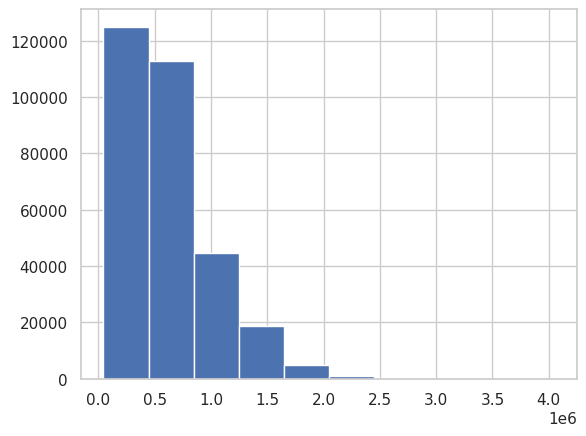

In [ ]:
plt.hist(data=df, x='AMT_CREDIT')

In [ ]:
df["NAME_INCOME_TYPE"].value_counts()

Working                 158774
Commercial associate     71617
Pensioner                55362
State servant            21703
Unemployed                  22
Student                     18
Businessman                 10
Maternity leave              5
Name: NAME_INCOME_TYPE, dtype: int64

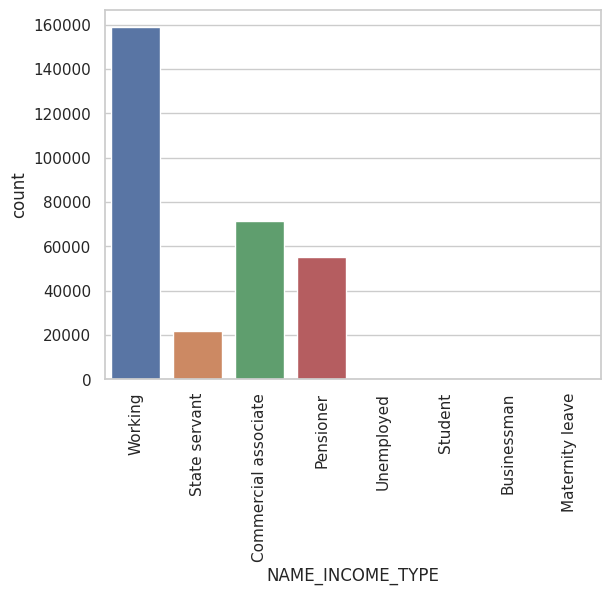

In [ ]:
sns.countplot(data=df, x='NAME_INCOME_TYPE')
plt.xticks(rotation=90)
plt.show()

In [ ]:
df["NAME_EDUCATION_TYPE"].value_counts()

Secondary / secondary special    218391
Higher education                  74863
Incomplete higher                 10277
Lower secondary                    3816
Academic degree                     164
Name: NAME_EDUCATION_TYPE, dtype: int64

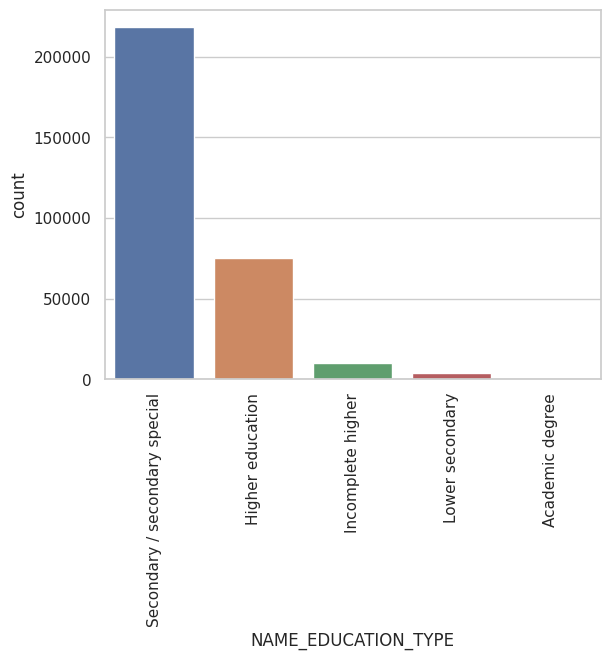

In [ ]:
sns.countplot(data=df, x='NAME_EDUCATION_TYPE')
plt.xticks(rotation=90)
plt.show()


In [ ]:
df["NAME_HOUSING_TYPE"].value_counts()

House / apartment      272868
With parents            14840
Municipal apartment     11183
Rented apartment         4881
Office apartment         2617
Co-op apartment          1122
Name: NAME_HOUSING_TYPE, dtype: int64

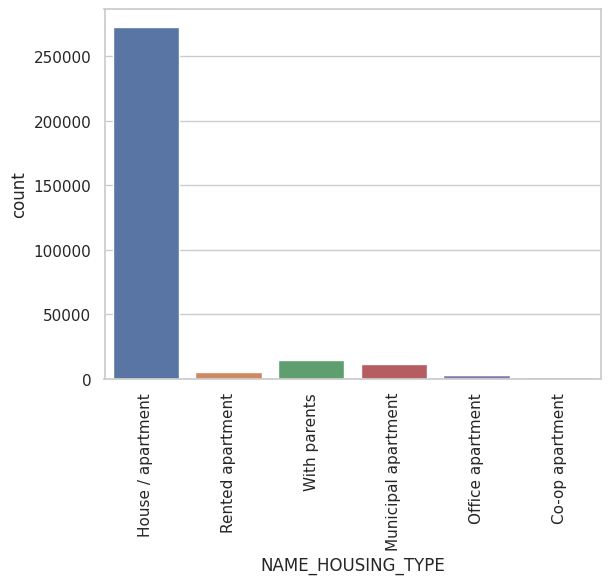

In [ ]:
sns.countplot(data=df, x='NAME_HOUSING_TYPE')
plt.xticks(rotation=90)
plt.show()

In [ ]:
df["NAME_FAMILY_STATUS"].value_counts()

Married                 196432
Single / not married     45444
Civil marriage           29775
Separated                19770
Widow                    16088
Unknown                      2
Name: NAME_FAMILY_STATUS, dtype: int64

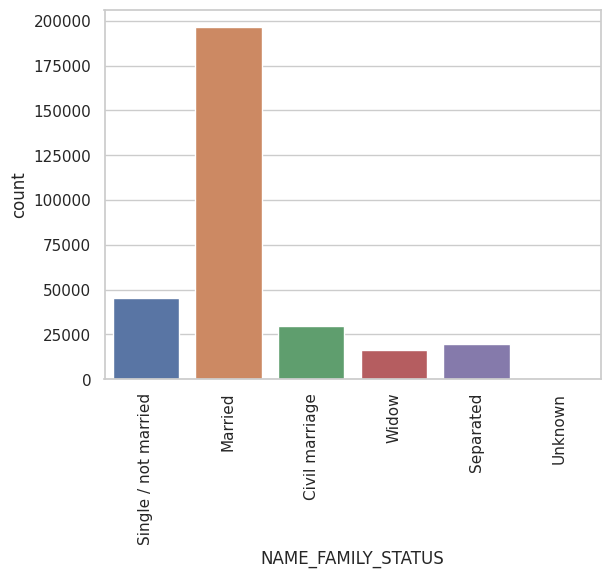

In [ ]:
sns.countplot(data=df, x='NAME_FAMILY_STATUS')
plt.xticks(rotation=90)
plt.show()


In [ ]:
df["OCCUPATION_TYPE"].value_counts()


Unidentified             96391
Laborers                 55186
Sales staff              32102
Core staff               27570
Managers                 21371
Drivers                  18603
High skill tech staff    11380
Accountants               9813
Medicine staff            8537
Security staff            6721
Cooking staff             5946
Cleaning staff            4653
Private service staff     2652
Low-skill Laborers        2093
Waiters/barmen staff      1348
Secretaries               1305
Realty agents              751
HR staff                   563
IT staff                   526
Name: OCCUPATION_TYPE, dtype: int64

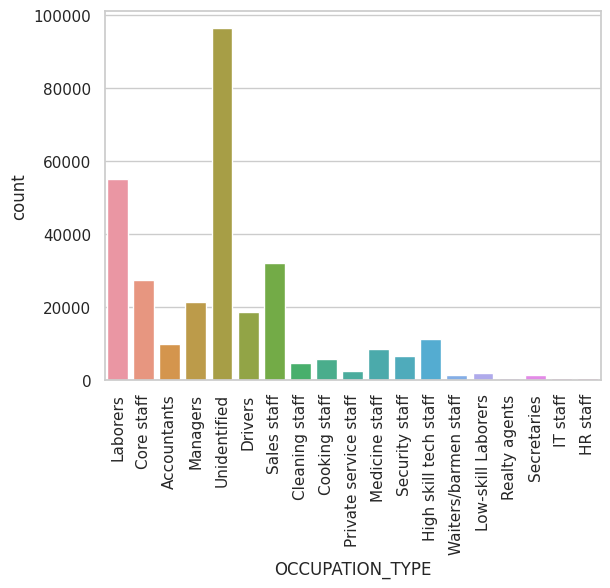

In [ ]:
sns.countplot(data=df, x='OCCUPATION_TYPE')
plt.xticks(rotation=90)
plt.show()

In [ ]:
df['ORGANIZATION_TYPE'].value_counts()

Business Entity Type 3    67992
XNA                       55374
Self-employed             38412
Other                     16683
Medicine                  11193
Business Entity Type 2    10553
Government                10404
School                     8893
Trade: type 7              7831
Kindergarten               6880
Construction               6721
Business Entity Type 1     5984
Transport: type 4          5398
Trade: type 3              3492
Industry: type 9           3368
Industry: type 3           3278
Security                   3247
Housing                    2958
Industry: type 11          2704
Military                   2634
Bank                       2507
Agriculture                2454
Police                     2341
Transport: type 2          2204
Postal                     2157
Security Ministries        1974
Trade: type 2              1900
Restaurant                 1811
Services                   1575
University                 1327
Industry: type 7           1307
Transpor

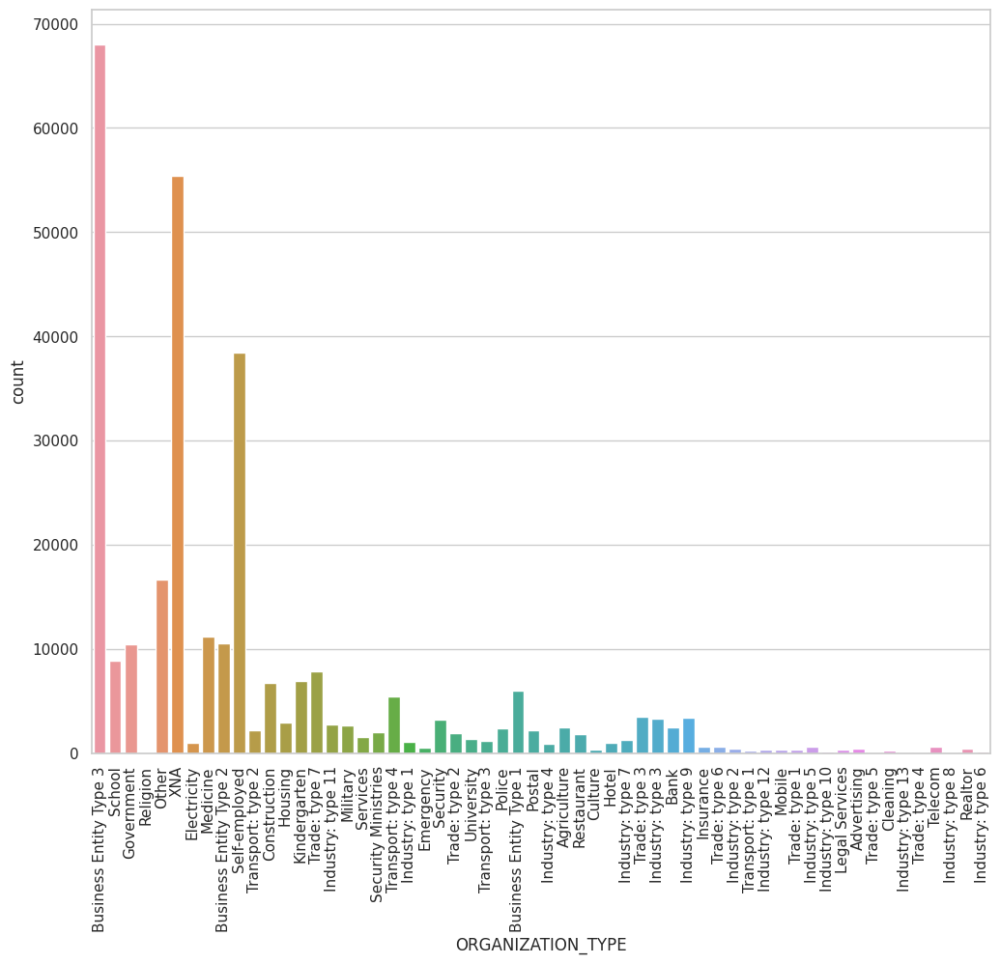

In [ ]:
plt.figure(figsize=(12,10))
sns.countplot(data=df, x='ORGANIZATION_TYPE')
plt.xticks(rotation=90)
plt.show()

In [ ]:
df['FLAG_MOBIL'].value_counts()

1    307510
0         1
Name: FLAG_MOBIL, dtype: int64

In [ ]:
df['FLAG_EMP_PHONE'].value_counts()

1    252125
0     55386
Name: FLAG_EMP_PHONE, dtype: int64

In [ ]:
df['FLAG_WORK_PHONE'].value_counts()

0    246203
1     61308
Name: FLAG_WORK_PHONE, dtype: int64

In [ ]:
df['FLAG_CONT_MOBILE'].value_counts()

1    306937
0       574
Name: FLAG_CONT_MOBILE, dtype: int64

In [ ]:
df['FLAG_PHONE'].value_counts()

0    221080
1     86431
Name: FLAG_PHONE, dtype: int64

In [ ]:
df['FLAG_EMAIL'].value_counts()

0    290069
1     17442
Name: FLAG_EMAIL, dtype: int64

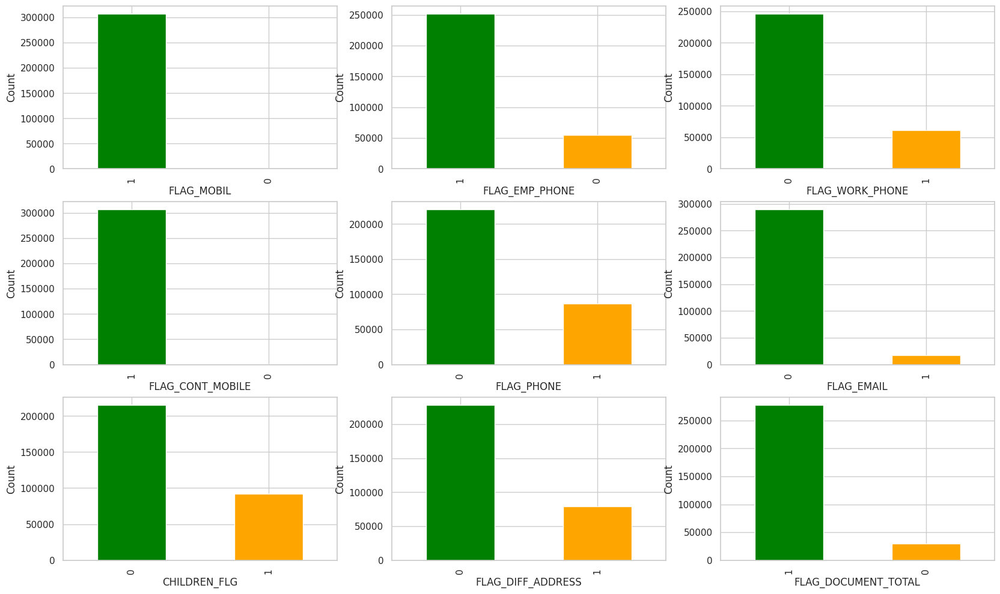

In [ ]:
plt.figure(figsize=(20,12))

list=["FLAG_MOBIL" ,"FLAG_EMP_PHONE", "FLAG_WORK_PHONE",  "FLAG_CONT_MOBILE" ,"FLAG_PHONE" , "FLAG_EMAIL", "CHILDREN_FLG" ,"FLAG_DIFF_ADDRESS" ,"FLAG_DOCUMENT_TOTAL"  ]
for i, var in enumerate (list):
  plt.subplot(3,3,i+1)
  vara = df[var].value_counts()
  vara.plot(kind='bar', color=['green', 'orange'])
  # Set plot labels and title
  plt.xlabel(var)
  plt.ylabel('Count')


# Display the plot
plt.show()


In [ ]:
hereeeeeeeeeeee

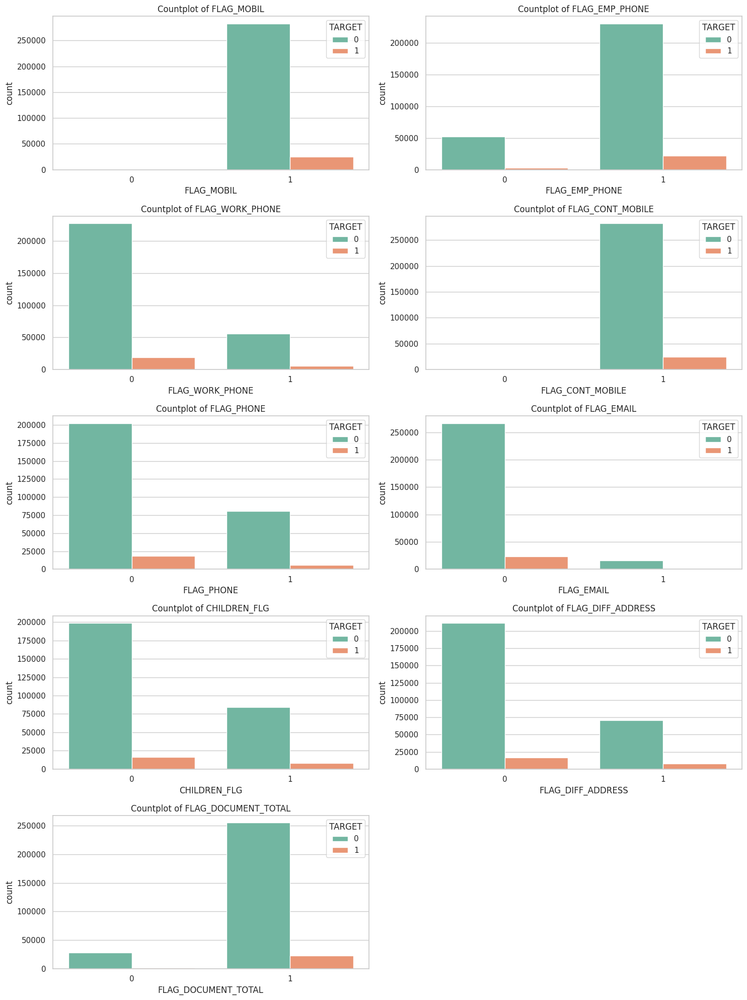

In [ ]:


# Set the aesthetic style of the plots
sns.set(style="whitegrid")

# Define the number of columns and rows for subplots
n_cols = 2
n_rows = int(len(list) / n_cols) + (len(list) % n_cols > 0)

# Create a figure with specified dimensions
plt.figure(figsize=(15, 4 * n_rows))

# Loop through each column in cols and create a countplot
for i, col in enumerate(list):
    plt.subplot(n_rows, n_cols, i+1)
    sns.countplot(x=col, data=df,hue="TARGET", palette="Set2")
    plt.title(f'Countplot of {col}')


    plt.tight_layout()

# Show the plots
plt.show()





*   Clients who didn't submit all documents tend to be defaulters.





# **CORRELATION ANALYSIS**

In [ ]:
corr_df = df.select_dtypes(include=["int64","float64"]).corr()

In [ ]:
corr_df

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,YEARS_EMPLOYED,YEARS_REGISTRATION,YEARS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_TOTAL,AGE_YEARS,FLAG_DOCUMENT_TOTAL,CHILDREN_FLG,FLAG_DIFF_ADDRESS
SK_ID_CURR,1.000000,-0.002108,-0.001129,-0.001820,-0.000343,-0.000407,-0.000258,0.000849,-0.001500,0.001366,0.001017,0.000402,2.804358e-03,-0.001337,-0.000415,0.002815,0.002753,0.000281,-0.002895,-0.001075,-0.001138,0.000350,-0.000283,0.001097,0.002903,-0.001885,-0.001582,0.000067,0.002319,0.000184,-0.001413,-0.000082,-0.001427,0.001182,-8.579928e-04,0.001208,0.001471,-0.002464,-0.000901,-0.000768
TARGET,-0.002108,1.000000,0.019187,-0.003982,-0.030369,-0.012794,-0.039623,-0.037227,0.078239,-0.047046,-0.041971,-0.051132,5.343956e-04,0.045982,0.028524,0.000370,-0.023806,-0.001758,0.009308,0.058899,0.060893,-0.024166,0.005576,0.006942,0.002819,0.044395,0.050994,0.032518,-0.160295,-0.155892,0.009447,0.032222,0.009337,0.031401,5.521848e-02,-0.015237,-0.078237,0.030518,0.020264,0.047965
CNT_CHILDREN,-0.001129,0.019187,1.000000,0.012882,0.002145,0.021414,-0.001856,-0.025573,0.330938,-0.241583,-0.183393,0.028102,1.041480e-03,0.240714,0.055630,-0.000794,-0.029906,0.022619,0.879160,0.025423,0.024781,-0.007292,-0.013319,0.008185,0.014835,0.020072,0.070650,0.069957,-0.017990,-0.039543,0.015662,-0.001260,0.015302,-0.001811,-5.865156e-03,0.003006,-0.330897,-0.023998,0.882978,0.069118
AMT_INCOME_TOTAL,-0.001820,-0.003982,0.012882,1.000000,0.156870,0.191639,0.159632,0.074796,0.027261,-0.063836,-0.027783,-0.008661,3.254766e-04,0.063994,-0.017193,-0.008290,0.000159,0.038378,0.016342,-0.085465,-0.091735,0.036459,0.031191,0.062340,0.058059,0.003574,0.006431,0.008285,0.060855,-0.030737,-0.013495,-0.013230,-0.013411,-0.013314,-1.858512e-02,0.024146,-0.027248,0.003643,0.016178,0.021036
AMT_CREDIT,-0.000343,-0.030369,0.002145,0.156870,1.000000,0.770080,0.986734,0.099738,-0.055436,-0.064317,-0.009535,0.006852,1.435573e-03,0.065519,-0.021085,0.023653,0.026213,0.016632,0.063160,-0.101776,-0.110915,0.052738,0.024010,0.051929,0.052609,-0.026886,-0.018856,0.000081,0.130930,0.036640,0.000895,-0.021197,0.000942,-0.023399,-7.370104e-02,0.011533,0.055391,0.188306,-0.000293,-0.003033
AMT_ANNUITY,-0.000407,-0.012794,0.021414,0.191639,0.770080,1.000000,0.774789,0.118345,0.009419,-0.102813,-0.038380,-0.011070,1.488634e-04,0.103491,-0.024825,0.022345,0.010765,0.071694,0.075566,-0.128457,-0.141615,0.052224,0.041251,0.079311,0.074426,-0.006260,0.000864,0.010038,0.125481,0.026774,-0.011319,-0.022747,-0.011065,-0.023635,-6.374886e-02,0.023978,-0.009463,0.214342,0.021071,0.020454
AMT_GOODS_PRICE,-0.000258,-0.039623,-0.001856,0.159632,0.986734,0.774789,1.000000,0.103519,-0.053510,-0.062189,-0.011471,0.009591,1.398140e-03,0.063412,0.000787,0.020696,0.041921,0.017031,0.061137,-0.103759,-0.112185,0.062269,0.026119,0.053146,0.052829,-0.027206,-0.020348,-0.001334,0.138997,0.040440,0.000788,-0.022194,0.000806,-0.024245,-7.629362e-02,0.010941,0.053465,0.154567,-0.004827,-0.006253
REGION_POPULATION_RELATIVE,0.000849,-0.037227,-0.025573,0.074796,0.099738,0.118345,0.103519,1.000000,-0.029582,-0.004090,0.053816,0.004120,1.333143e-03,0.004045,-0.015628,-0.012478,0.090939,0.040012,-0.024209,-0.532877,-0.531535,0.171285,0.002118,0.056944,0.081016,-0.050499,-0.044057,-0.015188,0.198725,-0.004507,-0.012021,0.006308,-0.011498,0.001974,-4.401317e-02,-0.003517,0.029647,-0.024387,-0.023269,-0.011566
DAYS_BIRTH,-0.001500,0.078239,0.330938,0.027261,-0.055436,0.009419,-0

Lets analyse separately for clients who are are defaulters and for clients who pay on time which can be extracted from target variable

In [ ]:
paymentDifficutlitiesClient = df[df['TARGET'] == 0]
noPayDiffClient = df[df['TARGET'] == 1]

In [ ]:
paymentDifficutlitiesClient

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,YEARS_EMPLOYED,YEARS_REGISTRATION,YEARS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_TOTAL,AGE_YEARS,FLAG_DOCUMENT_TOTAL,CHILDREN_FLG,FLAG_DIFF_ADDRESS
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,4,4.0,1,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.622246,0.535276,1.0,0.0,1.0,0.0,-828.0,0,46,1,0,0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,1,12.0,7,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,0.555912,0.729567,0.0,0.0,0.0,0.0,-815.0,0,53,0,0,0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,-19005,9,27.0,7,1,1,0,1,0,0,Laborers,2.0,2,2,WEDNESDAY,17,0,0,0,0,0,0,Business Entity Type 3,0.650442,0.535276,2.0,0.0,2.0,0.0,-617.0,0,53,1,0,0
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,-19932,9,12.0,10,1,1,0,1,0,0,Core staff,1.0,2,2,THURSDAY,11,0,0,0,0,1,1,Religion,0.322738,0.535276,0.0,0.0,0.0,0.0,-1106.0,0,55,1,0,1
5,100008,0,Cash loans,M,N,Y,0,99000.0,490495.5,27517.5,454500.0,"Spouse, partner",State servant,Secondary / secondary special,Married,House / apartment,0.035792,-16941,5,14.0,2,1,1,1,1,1,0,Laborers,2.0,2,2,WEDNESDAY,16,0,0,0,0,0,0,Other,0.354225,0.621226,0.0,0.0,0.0,0.0,-2536.0,1,47,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307505,456249,0,Cash loans,F,N,Y,0,112500.0,225000.0,22050.0,225000.0,Unaccompanied,Pensioner,Secondary / secondary special,Single / not married,House / apartment,0.022800,-24384,1000,21.0,7,1,0,0,1,1,0,Unidentified,1.0,2,2,MONDAY,15,0,0,0,0,0,0,XNA,0.346391,0.742182,0.0,0.0,0.0,0.0,0.0,1,67,1,0,0
307506,456251,0,Cash loans,M,N,N,0,157500.0,254700.0,27558.0,225000.0,Unaccompanied,Working,Secondary / secondary special,Separated,With parents,0.032561,-9327,1,24.0,6,1,1,0,1,0,0,Sales staff,1.0,1,1,THURSDAY,15,0,0,0,0,0,0,Services,0.681632,0.535276,0.0,0.0,0.0,0.0,-273.0,0,26,1,0,0
307507,456252,0,Cash loans,F,N,Y,0,72000.0,269550.0,12001.5,225000.0,Unaccompanied,Pensioner,Secondary / secondary special,Widow,House / apartment,0.025164,-20775,1000,13.0,12,1,0,0,1,1,0,Unidentified,1.0,2,2,MONDAY,8,0,0,0,0,0,0,XNA,0.115992,0.535276,0.0,0.0,0.0,0.0,0.0,0,57,1,0,0
307508,456253,0,Cash loans,F,N,Y,0,153000.0,677664.0,29979.0,585000.0,Unaccompanied,Working,Higher education,Separated,House / apartment,0.005002,-14966,22,19.0,15,1,1,0,1,0,1,Managers,1.0,3,3,THURSDAY,9,0,0,0,0,1,1,School,0.535722,0.218859,6.0,0.0,6.0,0.0,-1909.0,1,42,1,0,1


Also lets take only relevant columns for further analysis i.e lets take top 20 correlation variables

In [ ]:
top20CorrPayDiff=paymentDifficutlitiesClient.corr().unstack().sort_values(ascending = False).drop_duplicates()
top20CorrPayDiff.head(20)

SK_ID_CURR                   SK_ID_CURR                    1.000000
OBS_30_CNT_SOCIAL_CIRCLE     OBS_60_CNT_SOCIAL_CIRCLE      0.998510
AMT_GOODS_PRICE              AMT_CREDIT                    0.987022
REGION_RATING_CLIENT_W_CITY  REGION_RATING_CLIENT          0.950149
FLAG_DIFF_ADDRESS            REG_CITY_NOT_WORK_CITY        0.927857
CHILDREN_FLG                 CNT_CHILDREN                  0.884064
CNT_FAM_MEMBERS              CNT_CHILDREN                  0.878570
LIVE_REGION_NOT_WORK_REGION  REG_REGION_NOT_WORK_REGION    0.861861
DEF_30_CNT_SOCIAL_CIRCLE     DEF_60_CNT_SOCIAL_CIRCLE      0.859212
LIVE_CITY_NOT_WORK_CITY      REG_CITY_NOT_WORK_CITY        0.830381
                             FLAG_DIFF_ADDRESS             0.797541
CNT_FAM_MEMBERS              CHILDREN_FLG                  0.785523
AMT_ANNUITY                  AMT_GOODS_PRICE               0.776371
                             AMT_CREDIT                    0.771248
YEARS_EMPLOYED               AGE_YEARS          

In [ ]:
top20CorrNoPay=noPayDiffClient.corr().unstack().sort_values(ascending = False).drop_duplicates()
top20CorrNoPay.head(20)

SK_ID_CURR                   SK_ID_CURR                     1.000000
OBS_30_CNT_SOCIAL_CIRCLE     OBS_60_CNT_SOCIAL_CIRCLE       0.998270
AMT_CREDIT                   AMT_GOODS_PRICE                0.982783
REGION_RATING_CLIENT_W_CITY  REGION_RATING_CLIENT           0.956637
REG_CITY_NOT_WORK_CITY       FLAG_DIFF_ADDRESS              0.943184
CNT_FAM_MEMBERS              CNT_CHILDREN                   0.885484
CHILDREN_FLG                 CNT_CHILDREN                   0.871258
DEF_60_CNT_SOCIAL_CIRCLE     DEF_30_CNT_SOCIAL_CIRCLE       0.868967
REG_REGION_NOT_WORK_REGION   LIVE_REGION_NOT_WORK_REGION    0.847885
CHILDREN_FLG                 CNT_FAM_MEMBERS                0.781595
REG_CITY_NOT_WORK_CITY       LIVE_CITY_NOT_WORK_CITY        0.778540
LIVE_CITY_NOT_WORK_CITY      FLAG_DIFF_ADDRESS              0.763566
AMT_ANNUITY                  AMT_GOODS_PRICE                0.752295
                             AMT_CREDIT                     0.752195
YEARS_EMPLOYED               AGE_Y

We need a  dataframe for creating correlation matrix

In [ ]:
corr_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 40 entries, SK_ID_CURR to FLAG_DIFF_ADDRESS
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   SK_ID_CURR                   40 non-null     float64
 1   TARGET                       40 non-null     float64
 2   CNT_CHILDREN                 40 non-null     float64
 3   AMT_INCOME_TOTAL             40 non-null     float64
 4   AMT_CREDIT                   40 non-null     float64
 5   AMT_ANNUITY                  40 non-null     float64
 6   AMT_GOODS_PRICE              40 non-null     float64
 7   REGION_POPULATION_RELATIVE   40 non-null     float64
 8   DAYS_BIRTH                   40 non-null     float64
 9   YEARS_EMPLOYED               40 non-null     float64
 10  YEARS_REGISTRATION           40 non-null     float64
 11  YEARS_ID_PUBLISH             40 non-null     float64
 12  FLAG_MOBIL                   40 non-null     float64
 13  FLA

In [ ]:
corr_df.drop(columns=['FLAG_MOBIL', 'FLAG_EMP_PHONE' ,'FLAG_WORK_PHONE', 'FLAG_PHONE',  'FLAG_EMAIL', 'CNT_FAM_MEMBERS' ,  'REGION_RATING_CLIENT' , 'HOUR_APPR_PROCESS_START','REG_REGION_NOT_LIVE_REGION','REG_REGION_NOT_WORK_REGION' ,'LIVE_REGION_NOT_WORK_REGION','REG_CITY_NOT_LIVE_CITY','REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY'], inplace=True)

In [ ]:
corr_df[corr_df>0.6]

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,YEARS_EMPLOYED,YEARS_REGISTRATION,YEARS_ID_PUBLISH,FLAG_CONT_MOBILE,REGION_RATING_CLIENT_W_CITY,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_TOTAL,AGE_YEARS,FLAG_DOCUMENT_TOTAL,CHILDREN_FLG,FLAG_DIFF_ADDRESS
SK_ID_CURR,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
TARGET,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CNT_CHILDREN,NaN,NaN,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.882978,NaN
AMT_INCOME_TOTAL,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AMT_CREDIT,NaN,NaN,NaN,NaN,1.000000,0.770080,0.986734,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AMT_ANNUITY,NaN,NaN,NaN,NaN,0.770080,1.000000,0.774789,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AMT_GOODS_PRICE,NaN,NaN,NaN,NaN,0.986734,0.774789,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
REGION_POPULATION_RELATIVE,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
DAYS_BIRTH,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
YEARS_EMPLOYED,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.623892,NaN,NaN,NaN


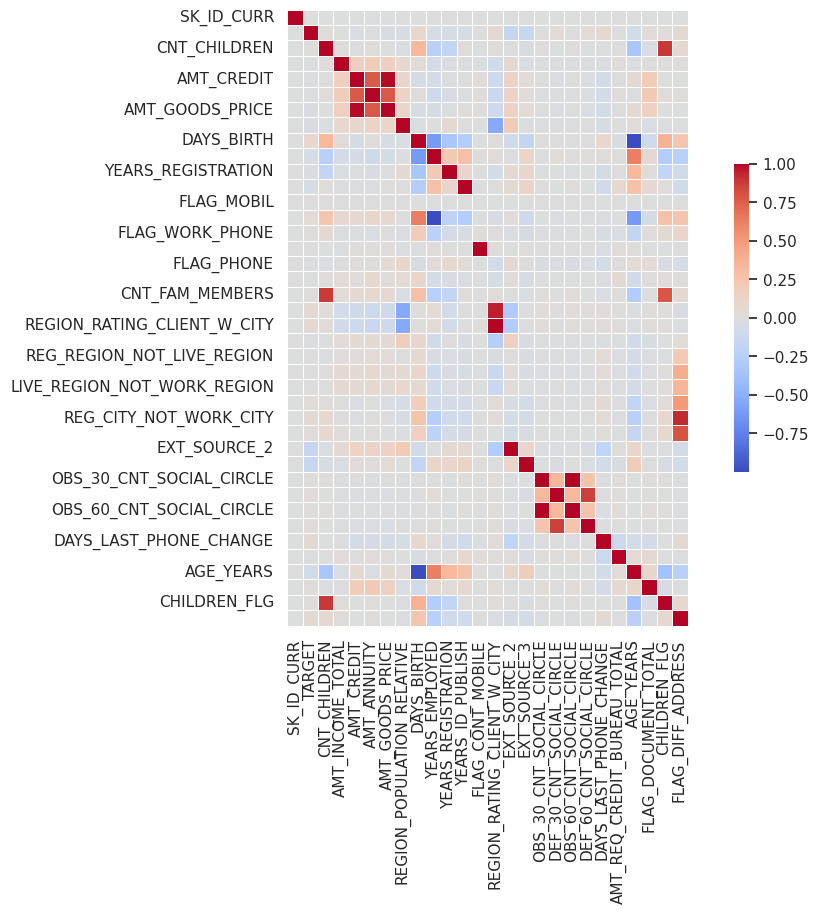

In [ ]:
corr_df

# Set up the matplotlib figure
plt.figure(figsize=(12, 8))

sns.heatmap(corr_df, fmt=".2f", cmap='coolwarm',
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

plt.show()


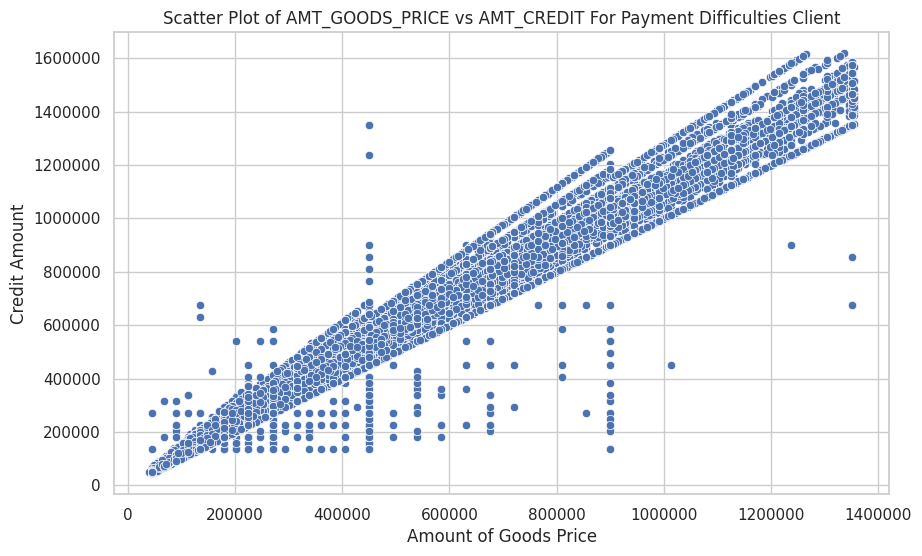

In [ ]:
# Lets calculate IQR for AMT_GOODS_PRICE
Q1_goods_price = paymentDifficutlitiesClient['AMT_GOODS_PRICE'].quantile(0.25)
Q3_goods_price = paymentDifficutlitiesClient['AMT_GOODS_PRICE'].quantile(0.75)
IQR_goods_price = Q3_goods_price - Q1_goods_price

# Lets calculate IQR for AMT_CREDIT
Q1_credit = paymentDifficutlitiesClient['AMT_CREDIT'].quantile(0.25)
Q3_credit = paymentDifficutlitiesClient['AMT_CREDIT'].quantile(0.75)
IQR_credit = Q3_credit - Q1_credit

# Define bounds for outliers
lower_bound_goods_price = Q1_goods_price - 1.5 * IQR_goods_price
upper_bound_goods_price = Q3_goods_price + 1.5 * IQR_goods_price
lower_bound_credit = Q1_credit - 1.5 * IQR_credit
upper_bound_credit = Q3_credit + 1.5 * IQR_credit

# Filtering out outliers
filtered_data = paymentDifficutlitiesClient[
    (paymentDifficutlitiesClient['AMT_GOODS_PRICE'] >= lower_bound_goods_price) &
    (paymentDifficutlitiesClient['AMT_GOODS_PRICE'] <= upper_bound_goods_price) &
    (paymentDifficutlitiesClient['AMT_CREDIT'] >= lower_bound_credit) &
    (paymentDifficutlitiesClient['AMT_CREDIT'] <= upper_bound_credit)
]

# Plotting the scatter plot with filtered data
plt.figure(figsize=(10, 6))
sns.scatterplot(x='AMT_GOODS_PRICE', y='AMT_CREDIT', data=filtered_data)

plt.title('Scatter Plot of AMT_GOODS_PRICE vs AMT_CREDIT For Payment Difficulties Client')
plt.xlabel('Amount of Goods Price')
plt.ylabel('Credit Amount')
plt.ticklabel_format(style='plain', axis='x')
plt.ticklabel_format(style='plain', axis='y')
plt.show()


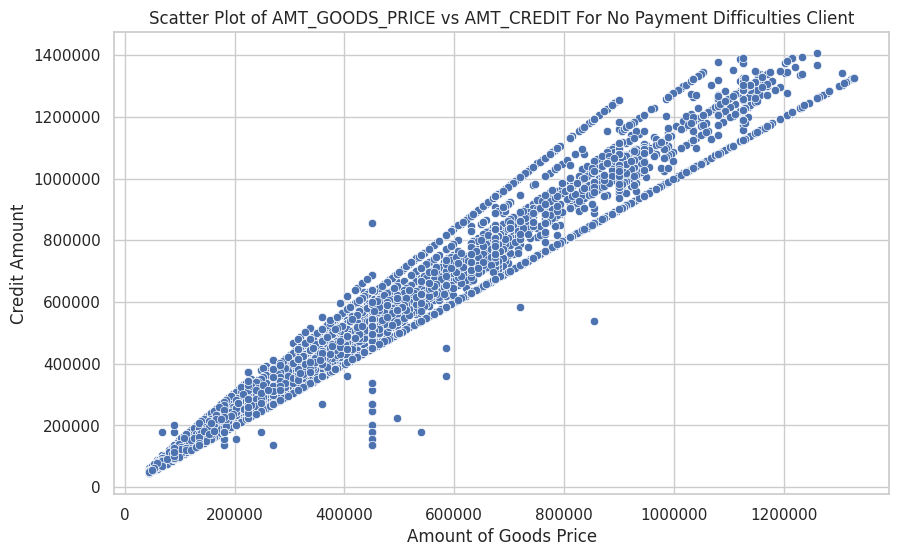

In [ ]:
# Lets calculate IQR for AMT_GOODS_PRICE
Q1_goods_price = noPayDiffClient['AMT_GOODS_PRICE'].quantile(0.25)
Q3_goods_price = noPayDiffClient['AMT_GOODS_PRICE'].quantile(0.75)
IQR_goods_price = Q3_goods_price - Q1_goods_price

# Lets calculate IQR for AMT_CREDIT
Q1_credit = noPayDiffClient['AMT_CREDIT'].quantile(0.25)
Q3_credit = noPayDiffClient['AMT_CREDIT'].quantile(0.75)
IQR_credit = Q3_credit - Q1_credit

# Define bounds for outliers
lower_bound_goods_price = Q1_goods_price - 1.5 * IQR_goods_price
upper_bound_goods_price = Q3_goods_price + 1.5 * IQR_goods_price
lower_bound_credit = Q1_credit - 1.5 * IQR_credit
upper_bound_credit = Q3_credit + 1.5 * IQR_credit

# Filtering out outliers
filtered_data = noPayDiffClient[
    (noPayDiffClient['AMT_GOODS_PRICE'] >= lower_bound_goods_price) &
    (noPayDiffClient['AMT_GOODS_PRICE'] <= upper_bound_goods_price) &
    (noPayDiffClient['AMT_CREDIT'] >= lower_bound_credit) &
    (noPayDiffClient['AMT_CREDIT'] <= upper_bound_credit)
]

# Plotting the scatter plot with filtered data
plt.figure(figsize=(10, 6))
sns.scatterplot(x='AMT_GOODS_PRICE', y='AMT_CREDIT', data=filtered_data)

plt.title('Scatter Plot of AMT_GOODS_PRICE vs AMT_CREDIT For No Payment Difficulties Client')
plt.xlabel('Amount of Goods Price')
plt.ylabel('Credit Amount')
plt.ticklabel_format(style='plain', axis='x')
plt.ticklabel_format(style='plain', axis='y')
plt.show()

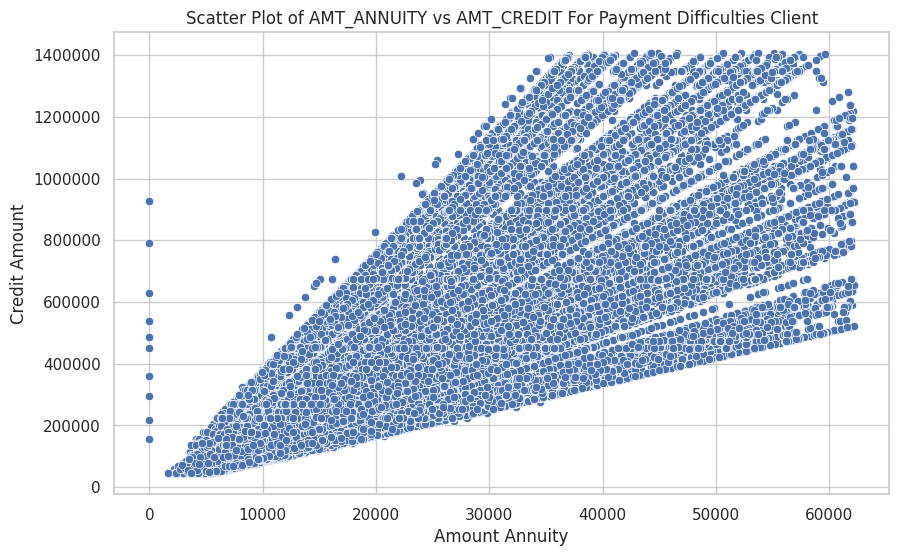

In [ ]:
# Lets calculate IQR for AMT_ANNUITY
Q1_amt_annuity = paymentDifficutlitiesClient['AMT_ANNUITY'].quantile(0.25)
Q3_amt_annuity = paymentDifficutlitiesClient['AMT_ANNUITY'].quantile(0.75)
IQR_amt_annuity = Q3_amt_annuity - Q1_amt_annuity


# Define bounds for outliers
lower_bound_amt_annuity = Q1_amt_annuity - 1.5 * IQR_amt_annuity
upper_bound_amt_annuity = Q3_amt_annuity + 1.5 * IQR_amt_annuity


# Filtering out outliers
filtered_data = paymentDifficutlitiesClient[
    (paymentDifficutlitiesClient['AMT_ANNUITY'] >= lower_bound_amt_annuity) &
    (paymentDifficutlitiesClient['AMT_ANNUITY'] <= upper_bound_amt_annuity) &
    (paymentDifficutlitiesClient['AMT_CREDIT'] >= lower_bound_credit) &
    (paymentDifficutlitiesClient['AMT_CREDIT'] <= upper_bound_credit)
]

# Plotting the scatter plot with filtered data
plt.figure(figsize=(10, 6))
sns.scatterplot(x='AMT_ANNUITY', y='AMT_CREDIT', data=filtered_data)

plt.title('Scatter Plot of AMT_ANNUITY vs AMT_CREDIT For Payment Difficulties Client')
plt.xlabel('Amount Annuity')
plt.ylabel('Credit Amount')
plt.ticklabel_format(style='plain', axis='x')
plt.ticklabel_format(style='plain', axis='y')
plt.show()

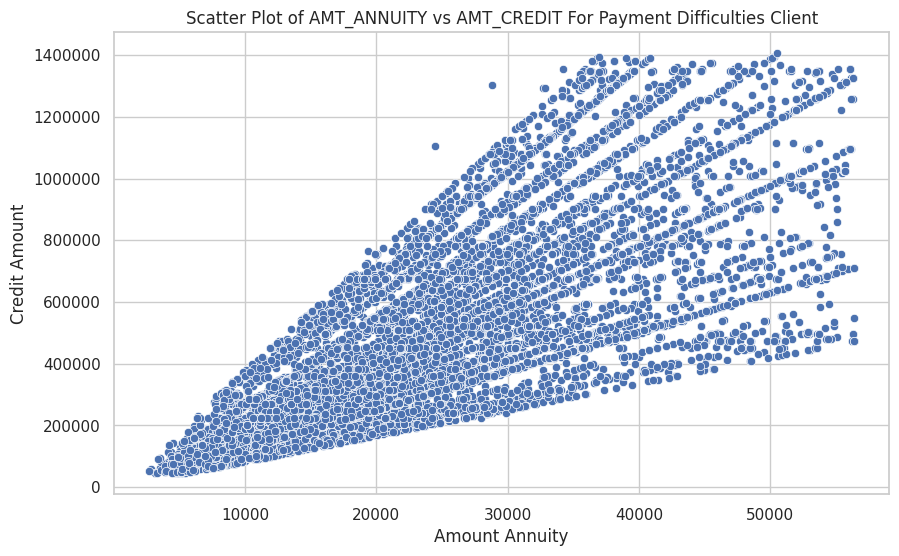

In [ ]:
# Lets calculate IQR for AMT_ANNUITY
Q1_amt_annuity = noPayDiffClient['AMT_ANNUITY'].quantile(0.25)
Q3_amt_annuity = noPayDiffClient['AMT_ANNUITY'].quantile(0.75)
IQR_amt_annuity = Q3_amt_annuity - Q1_amt_annuity


# Define bounds for outliers
lower_bound_amt_annuity = Q1_amt_annuity - 1.5 * IQR_amt_annuity
upper_bound_amt_annuity = Q3_amt_annuity + 1.5 * IQR_amt_annuity


# Filtering out outliers
filtered_data = noPayDiffClient[
    (noPayDiffClient['AMT_ANNUITY'] >= lower_bound_amt_annuity) &
    (noPayDiffClient['AMT_ANNUITY'] <= upper_bound_amt_annuity) &
    (noPayDiffClient['AMT_CREDIT'] >= lower_bound_credit) &
    (noPayDiffClient['AMT_CREDIT'] <= upper_bound_credit)
]

# Plotting the scatter plot with filtered data
plt.figure(figsize=(10, 6))
sns.scatterplot(x='AMT_ANNUITY', y='AMT_CREDIT', data=filtered_data)

plt.title('Scatter Plot of AMT_ANNUITY vs AMT_CREDIT For Payment Difficulties Client')
plt.xlabel('Amount Annuity')
plt.ylabel('Credit Amount')
plt.ticklabel_format(style='plain', axis='x')
plt.ticklabel_format(style='plain', axis='y')
plt.show()

**Observations**

AMT_CREDIT and AMT_GOODS_PRICE have a robust positive association. In other words, the Credit Amount grows together with the price of the goods.


 AMT_CREDITand AMT_ANNUITY have strong positive correlation.
As a result Annuity Amount increases, so does Credit Amount.

# Bivariate Analysis

In [ ]:
df.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,YEARS_EMPLOYED,YEARS_REGISTRATION,YEARS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_TOTAL,AGE_YEARS,FLAG_DOCUMENT_TOTAL,CHILDREN_FLG,FLAG_DIFF_ADDRESS
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,2,10.0,6,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.262949,0.139376,2.0,2.0,2.0,2.0,-1134.0,1,26,1,0,0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,4,4.0,1,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.622246,0.535276,1.0,0.0,1.0,0.0,-828.0,0,46,1,0,0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,1,12.0,7,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,0.555912,0.729567,0.0,0.0,0.0,0.0,-815.0,0,53,0,0,0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,-19005,9,27.0,7,1,1,0,1,0,0,Laborers,2.0,2,2,WEDNESDAY,17,0,0,0,0,0,0,Business Entity Type 3,0.650442,0.535276,2.0,0.0,2.0,0.0,-617.0,0,53,1,0,0
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,-19932,9,12.0,10,1,1,0,1,0,0,Core staff,1.0,2,2,THURSDAY,11,0,0,0,0,1,1,Religion,0.322738,0.535276,0.0,0.0,0.0,0.0,-1106.0,0,55,1,0,1


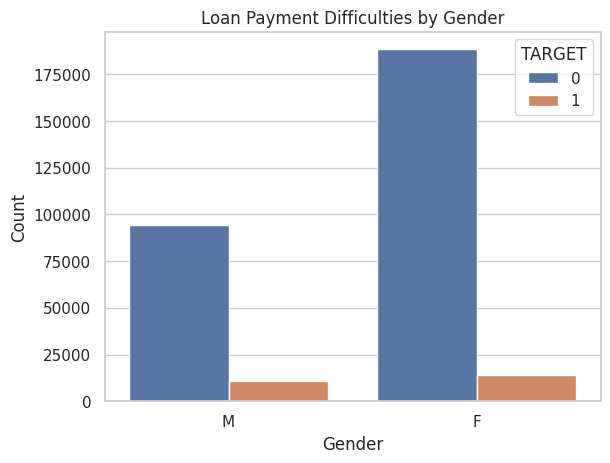

In [ ]:
sns.countplot(x=df['CODE_GENDER'], hue=df['TARGET'])
plt.title('Loan Payment Difficulties by Gender')
plt.xlabel("Gender")
plt.ylabel("Count")
plt.show()


It is evident that Females are more probable to be defaulters.

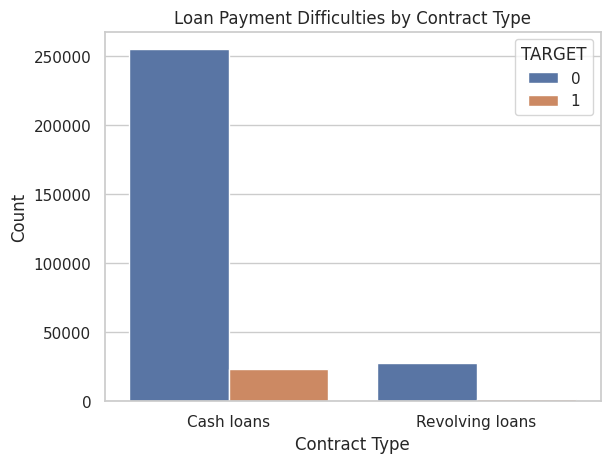

In [ ]:
sns.countplot(x=df['NAME_CONTRACT_TYPE'], hue=df['TARGET'])
plt.title('Loan Payment Difficulties by Contract Type')
plt.xlabel("Contract Type")
plt.ylabel("Count")
plt.show()


We can see that most of the contract type are of Cash Loans  and there is also a small margin where Clients having cash loans tend to be defaulters.
However clients with  revolving loans seems to have nearly no default behaviour

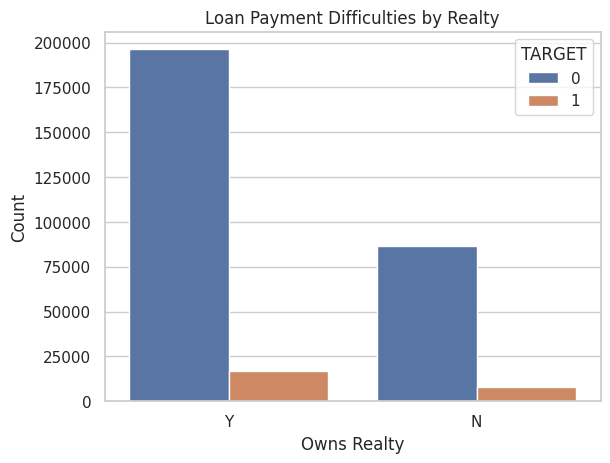

In [ ]:
sns.countplot(x=df['FLAG_OWN_REALTY'], hue=df['TARGET'])
plt.title('Loan Payment Difficulties by Realty')
plt.xlabel("Owns Realty")
plt.ylabel("Count")
plt.show()


Clients who own Realty are more likely to not pay loan compared ot those who dont own one.
Also majority of the clients own realty. So this conclusion may be bais.

In [ ]:
df.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,YEARS_EMPLOYED,YEARS_REGISTRATION,YEARS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_TOTAL,AGE_YEARS,FLAG_DOCUMENT_TOTAL,CHILDREN_FLG,FLAG_DIFF_ADDRESS
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,2,10.0,6,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.262949,0.139376,2.0,2.0,2.0,2.0,-1134.0,1,26,1,0,0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,4,4.0,1,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.622246,0.535276,1.0,0.0,1.0,0.0,-828.0,0,46,1,0,0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,1,12.0,7,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,0.555912,0.729567,0.0,0.0,0.0,0.0,-815.0,0,53,0,0,0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,-19005,9,27.0,7,1,1,0,1,0,0,Laborers,2.0,2,2,WEDNESDAY,17,0,0,0,0,0,0,Business Entity Type 3,0.650442,0.535276,2.0,0.0,2.0,0.0,-617.0,0,53,1,0,0
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,-19932,9,12.0,10,1,1,0,1,0,0,Core staff,1.0,2,2,THURSDAY,11,0,0,0,0,1,1,Religion,0.322738,0.535276,0.0,0.0,0.0,0.0,-1106.0,0,55,1,0,1


All these columns AMT_INCOME_TOTAL,	AMT_CREDIT,	AMT_ANNUITY,	AMT_GOODS_PRICE need to be categorized so that it becomes easier to anlayse data.


In [ ]:
df['AMT_INCOME_TOTAL'].describe()

count    3.075110e+05
mean     1.687979e+05
std      2.371231e+05
min      2.565000e+04
25%      1.125000e+05
50%      1.471500e+05
75%      2.025000e+05
max      1.170000e+08
Name: AMT_INCOME_TOTAL, dtype: float64

In [ ]:
# Lets create the percentiles as follows to conduct our analysis
percentiles = [0, 0.25, 0.5, 0.75, 1.0]

# Defining the category labels
categoryLabels = ['very_low', 'low', 'medium', 'high']

# Using the cut function to create categories based on percentiles
df['INCOME_CATEGORY'] = pd.cut(df['AMT_INCOME_TOTAL'], bins=df['AMT_INCOME_TOTAL'].quantile(percentiles), labels=categoryLabels)

print(df[['AMT_INCOME_TOTAL', 'INCOME_CATEGORY']])


        AMT_INCOME_TOTAL INCOME_CATEGORY
0               202500.0          medium
1               270000.0            high
2                67500.0        very_low
3               135000.0             low
4               121500.0             low
...                  ...             ...
307506          157500.0          medium
307507           72000.0        very_low
307508          153000.0          medium
307509          171000.0          medium
307510          157500.0          medium

[307511 rows x 2 columns]


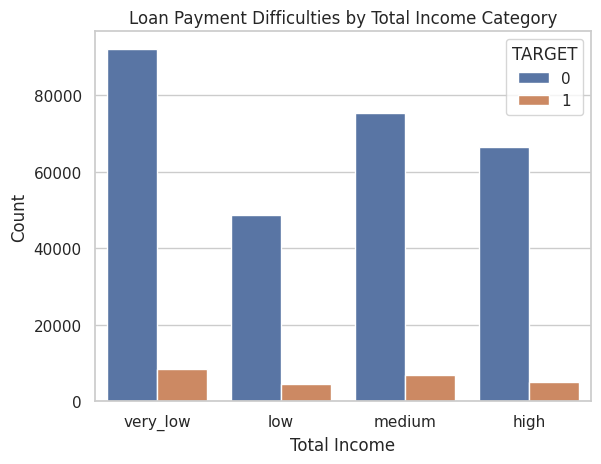

In [ ]:
sns.countplot(x=df['INCOME_CATEGORY'], hue=df['TARGET'])
plt.title('Loan Payment Difficulties by Total Income Category')
plt.xlabel("Total Income")
plt.ylabel("Count")
plt.show()


Clients with very_low income are most likely to be defaulters, followed by medium income range  and then low and high range respectively.

In [ ]:
# Lets create the percentiles as follows to conduct our analysis
percentiles = [0, 0.25, 0.5, 0.75, 1.0]

# Defining the category labels
categoryLabels = ['very_low', 'low', 'medium', 'high']

# Using the cut function to create categories based on percentiles
df['CREDIT_CATEGORY'] = pd.cut(df['AMT_CREDIT'], bins=df['AMT_CREDIT'].quantile(percentiles), labels=categoryLabels)

print(df[['AMT_CREDIT', 'CREDIT_CATEGORY']])

        AMT_CREDIT CREDIT_CATEGORY
0         406597.5             low
1        1293502.5            high
2         135000.0        very_low
3         312682.5             low
4         513000.0             low
...            ...             ...
307506    254700.0        very_low
307507    269550.0        very_low
307508    677664.0          medium
307509    370107.0             low
307510    675000.0          medium

[307511 rows x 2 columns]


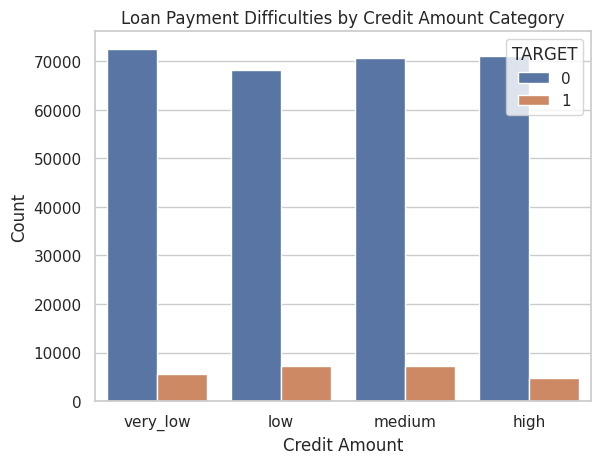

In [ ]:
sns.countplot(x=df['CREDIT_CATEGORY'], hue=df['TARGET'])
plt.title('Loan Payment Difficulties by Credit Amount Category')
plt.xlabel("Credit Amount")
plt.ylabel("Count")
plt.show()

Clients with low credit amount are most likely to be defaulters, followed by medium range and then very_low and high range respectively.

In [ ]:
# Lets create the percentiles as follows to conduct our analysis
percentiles = [0, 0.25, 0.5, 0.75, 1.0]

# Defining the category labels
categoryLabels = ['very_low', 'low', 'medium', 'high']

# Using the cut function to create categories based on percentiles
df['ANNUITY_CATEGORY'] = pd.cut(df['AMT_ANNUITY'], bins=df['AMT_ANNUITY'].quantile(percentiles), labels=categoryLabels)

print(df[['AMT_ANNUITY', 'ANNUITY_CATEGORY']])

        AMT_ANNUITY ANNUITY_CATEGORY
0           24700.5              low
1           35698.5             high
2            6750.0         very_low
3           29686.5           medium
4           21865.5              low
...             ...              ...
307506      27558.0           medium
307507      12001.5         very_low
307508      29979.0           medium
307509      20205.0              low
307510      49117.5             high

[307511 rows x 2 columns]


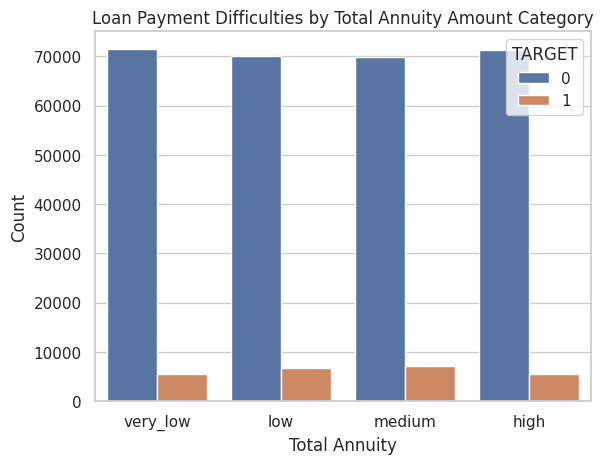

In [ ]:
sns.countplot(x=df['ANNUITY_CATEGORY'], hue=df['TARGET'])
plt.title('Loan Payment Difficulties by Total Annuity Amount Category')
plt.xlabel("Total Annuity")
plt.ylabel("Count")
plt.show()

In [ ]:
# Lets create the percentiles as follows to conduct our analysis
percentiles = [0, 0.25, 0.5, 0.75, 1.0]

# Defining the category labels
categoryLabels = ['very_low', 'low', 'medium', 'high']

# Using the cut function to create categories based on percentiles
df['GOODS_PRICE_CATEGORY'] = pd.cut(df['AMT_GOODS_PRICE'], bins=df['AMT_GOODS_PRICE'].quantile(percentiles), labels=categoryLabels)

print(df[['AMT_GOODS_PRICE', 'GOODS_PRICE_CATEGORY']])

        AMT_GOODS_PRICE GOODS_PRICE_CATEGORY
0              351000.0                  low
1             1129500.0                 high
2              135000.0             very_low
3              297000.0                  low
4              513000.0               medium
...                 ...                  ...
307506         225000.0             very_low
307507         225000.0             very_low
307508         585000.0               medium
307509         319500.0                  low
307510         675000.0               medium

[307511 rows x 2 columns]


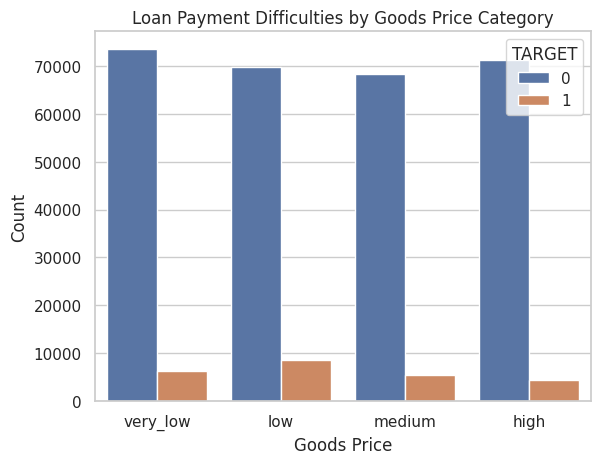

In [ ]:
sns.countplot(x=df['GOODS_PRICE_CATEGORY'], hue=df['TARGET'])
plt.title('Loan Payment Difficulties by Goods Price Category')
plt.xlabel("Goods Price")
plt.ylabel("Count")
plt.show()

Clients purchasing low price goods are most likely to be defaulters, followed by very_low income range  and then medium and high range respectively.

Lets do the same for all date columns and categorize them using cut function of pandas, bin

In [ ]:
df.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,YEARS_EMPLOYED,YEARS_REGISTRATION,YEARS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_TOTAL,AGE_YEARS,FLAG_DOCUMENT_TOTAL,CHILDREN_FLG,FLAG_DIFF_ADDRESS,INCOME_CATEGORY,CREDIT_CATEGORY,ANNUITY_CATEGORY,GOODS_PRICE_CATEGORY
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,2,10.0,6,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.262949,0.139376,2.0,2.0,2.0,2.0,-1134.0,1,26,1,0,0,medium,low,low,low
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,4,4.0,1,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.622246,0.535276,1.0,0.0,1.0,0.0,-828.0,0,46,1,0,0,high,high,high,high
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,1,12.0,7,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,0.555912,0.729567,0.0,0.0,0.0,0.0,-815.0,0,53,0,0,0,very_low,very_low,very_low,very_low
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,-19005,9,27.0,7,1,1,0,1,0,0,Laborers,2.0,2,2,WEDNESDAY,17,0,0,0,0,0,0,Business Entity Type 3,0.650442,0.535276,2.0,0.0,2.0,0.0,-617.0,0,53,1,0,0,low,low,medium,low
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,-19932,9,12.0,10,1,1,0,1,0,0,Core staff,1.0,2,2,THURSDAY,11,0,0,0,0,1,1,Religion,0.322738,0.535276,0.0,0.0,0.0,0.0,-1106.0,0,55,1,0,1,low,low,low,medium


In [ ]:
# Lets create the percentiles as follows to conduct our analysis
percentiles = [0, 0.25, 0.5, 0.75, 1.0]

# Defining the category labels
categoryLabels = ['very_old', 'old', 'medium', 'new']

# Using the cut function to create categories based on percentiles
df['YEARS_EMPLOYED_CATEGORY'] = pd.cut(df['YEARS_EMPLOYED'], bins=df['YEARS_EMPLOYED'].quantile(percentiles), labels=categoryLabels)

print(df[['YEARS_EMPLOYED', 'YEARS_EMPLOYED_CATEGORY']])

        YEARS_EMPLOYED YEARS_EMPLOYED_CATEGORY
0                    2                very_old
1                    4                     old
2                    1                very_old
3                    9                  medium
4                    9                  medium
...                ...                     ...
307506               1                very_old
307507            1000                     new
307508              22                     new
307509              14                  medium
307510               4                     old

[307511 rows x 2 columns]


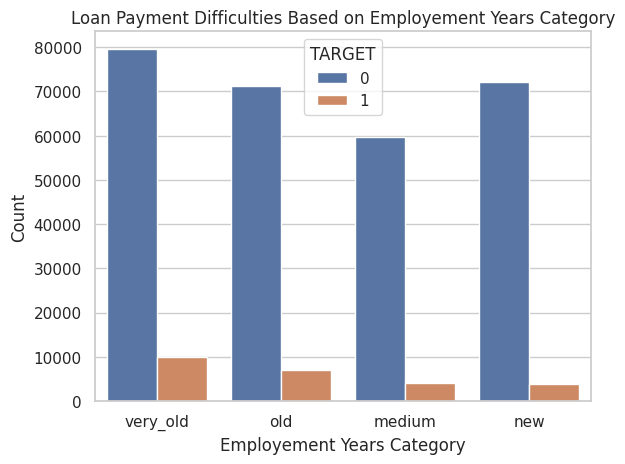

In [ ]:
sns.countplot(x=df['YEARS_EMPLOYED_CATEGORY'], hue=df['TARGET'])
plt.title('Loan Payment Difficulties Based on Employement Years Category')
plt.xlabel("Employement Years Category")
plt.ylabel("Count")
plt.show()

Clients who have longer employment history  are most likely to be defaulters and the default rate decrease as new they are in terms of employment.

In [ ]:
# Lets create the percentiles as follows to conduct our analysis
percentiles = [0, 0.25, 0.5, 0.75, 1.0]

# Defining the category labels
categoryLabels = ['very_old', 'old', 'medium', 'new']

# Using the cut function to create categories based on percentiles
df['YEARS_REGISTRATION_CATEGORY'] = pd.cut(df['YEARS_REGISTRATION'], bins=df['YEARS_REGISTRATION'].quantile(percentiles), labels=categoryLabels)

print(df[['YEARS_REGISTRATION', 'YEARS_REGISTRATION_CATEGORY']])

        YEARS_REGISTRATION YEARS_REGISTRATION_CATEGORY
0                     10.0                         old
1                      4.0                    very_old
2                     12.0                         old
3                     27.0                         new
4                     12.0                         old
...                    ...                         ...
307506                24.0                         new
307507                13.0                         old
307508                19.0                      medium
307509                 8.0                         old
307510                15.0                      medium

[307511 rows x 2 columns]


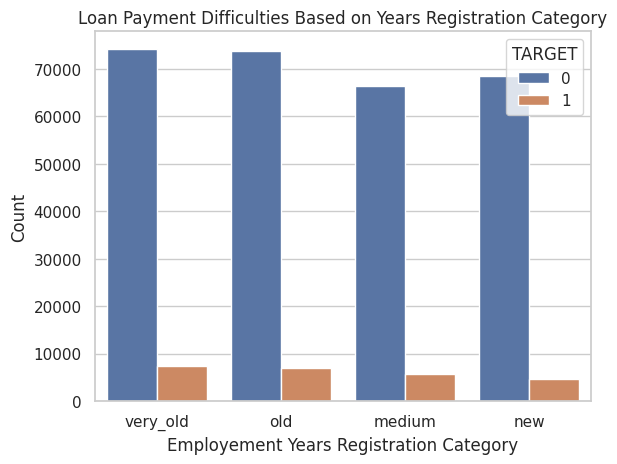

In [ ]:
sns.countplot(x=df['YEARS_REGISTRATION_CATEGORY'], hue=df['TARGET'])
plt.title('Loan Payment Difficulties Based on Years Registration Category')
plt.xlabel("Employement Years Registration Category")
plt.ylabel("Count")
plt.show()

In [ ]:
# Lets create the percentiles as follows to conduct our analysis
percentiles = [0, 0.25, 0.5, 0.75, 1.0]

# Defining the category labels
categoryLabels = ['very_old', 'old', 'medium', 'new']

# Using the cut function to create categories based on percentiles
df['YEARS_ID_PUBLISH_CATEGORY'] = pd.cut(df['YEARS_ID_PUBLISH'], bins=df['YEARS_ID_PUBLISH'].quantile(percentiles), labels=categoryLabels)

print(df[['YEARS_ID_PUBLISH', 'YEARS_ID_PUBLISH_CATEGORY']])

        YEARS_ID_PUBLISH YEARS_ID_PUBLISH_CATEGORY
0                      6                       old
1                      1                  very_old
2                      7                       old
3                      7                       old
4                     10                    medium
...                  ...                       ...
307506                 6                       old
307507                12                    medium
307508                15                       new
307509                 3                  very_old
307510                 2                  very_old

[307511 rows x 2 columns]


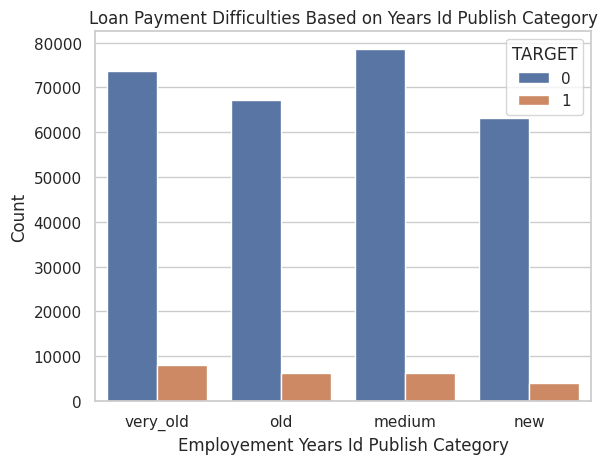

In [ ]:
sns.countplot(x=df['YEARS_ID_PUBLISH_CATEGORY'], hue=df['TARGET'])
plt.title('Loan Payment Difficulties Based on Years Id Publish Category')
plt.xlabel("Employement Years Id Publish Category")
plt.ylabel("Count")
plt.show()

In [ ]:
# Lets create the percentiles as follows to conduct our analysis
percentiles = [0, 0.25, 0.5, 0.75, 1.0]

# Defining the category labels
categoryLabels = ['very young', 'youth', 'middles', 'old']

# Using the cut function to create categories based on percentiles
df['AGE_YEARS_CATEGORY'] = pd.cut(df['AGE_YEARS'], bins=df['AGE_YEARS'].quantile(percentiles), labels=categoryLabels)

print(df[['AGE_YEARS', 'AGE_YEARS_CATEGORY']])

        AGE_YEARS AGE_YEARS_CATEGORY
0              26         very young
1              46            middles
2              53            middles
3              53            middles
4              55                old
...           ...                ...
307506         26         very young
307507         57                old
307508         42              youth
307509         33         very young
307510         47            middles

[307511 rows x 2 columns]


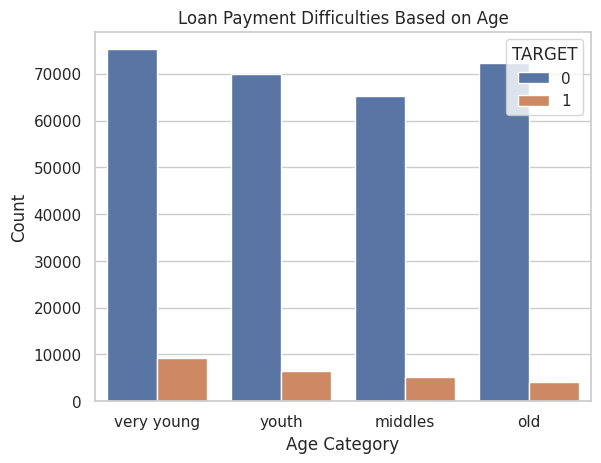

In [ ]:
sns.countplot(x=df['AGE_YEARS_CATEGORY'], hue=df['TARGET'])
plt.title('Loan Payment Difficulties Based on Age')
plt.xlabel("Age Category")
plt.ylabel("Count")
plt.show()

Clients who are younger are most likely to be defaulters and the default rate decrease with increase in their age.

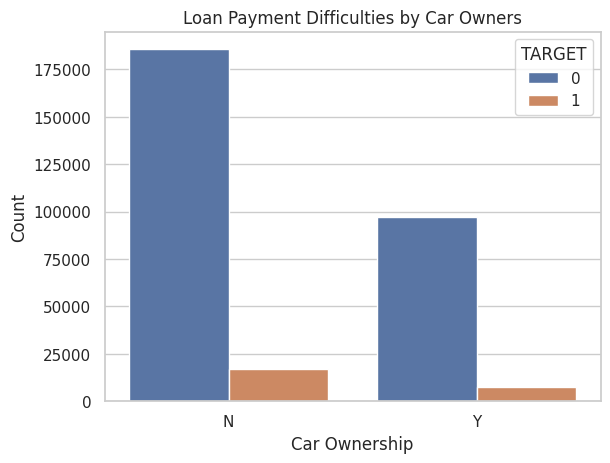

In [ ]:
sns.countplot(x=df['FLAG_OWN_CAR'], hue=df['TARGET'])
plt.title('Loan Payment Difficulties by Car Owners')
plt.xlabel("Car Ownership")
plt.ylabel("Count")
plt.show()


Clients who own car are less likely to be defaulters .

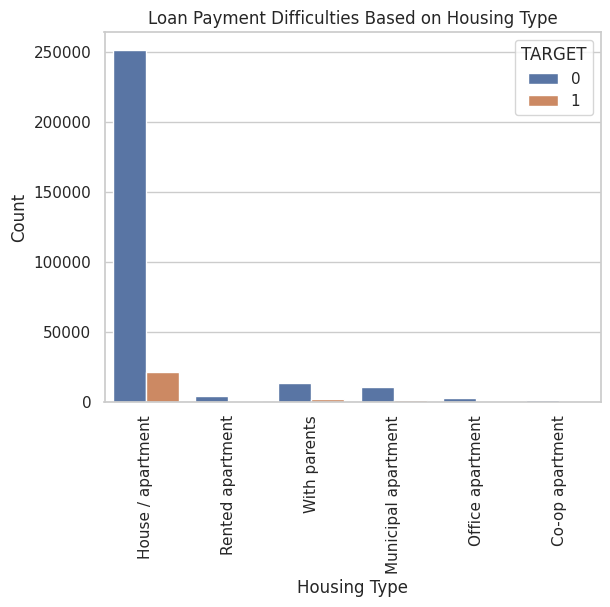

In [ ]:
sns.countplot(x=df['NAME_HOUSING_TYPE'], hue=df['TARGET'])
plt.title('Loan Payment Difficulties Based on Housing Type')
plt.xlabel("Housing Type")
plt.ylabel("Count")
plt.xticks(rotation=90)
plt.show()

Clients who live in apartment are more likely to be defaulters, followed by clients living with their parents.

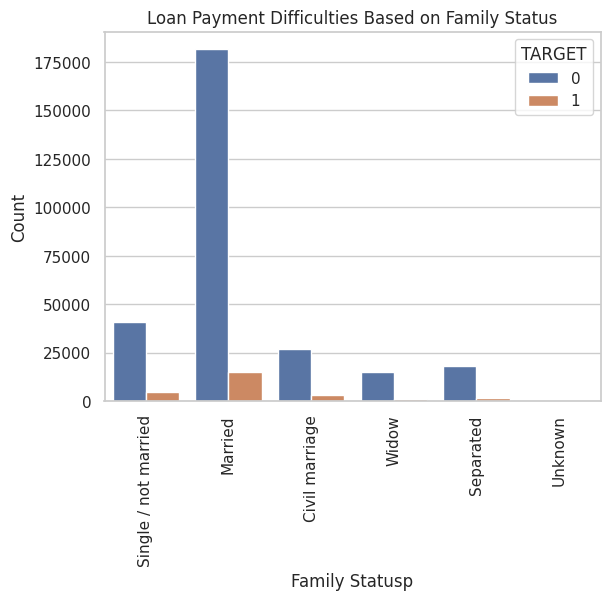

In [ ]:
sns.countplot(x=df['NAME_FAMILY_STATUS'], hue=df['TARGET'])
plt.title('Loan Payment Difficulties Based on Family Status')
plt.xlabel("Family Statusp")
plt.ylabel("Count")
plt.xticks(rotation=90)
plt.show()

Also clients who are married are more likely to be defaulters, followed by clients who are single and who had civil marriages .

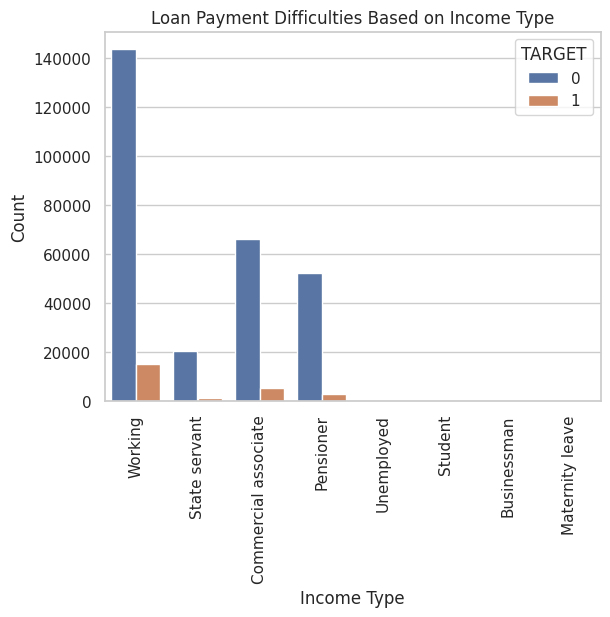

In [ ]:
sns.countplot(x=df['NAME_INCOME_TYPE'], hue=df['TARGET'])
plt.title('Loan Payment Difficulties Based on Income Type')
plt.xlabel("Income Type")
plt.ylabel("Count")
plt.xticks(rotation=90)
plt.show()

Clients from Working Income type are most likely to be defaulters followed by those who are commercial associate, pensioner ans state servant.

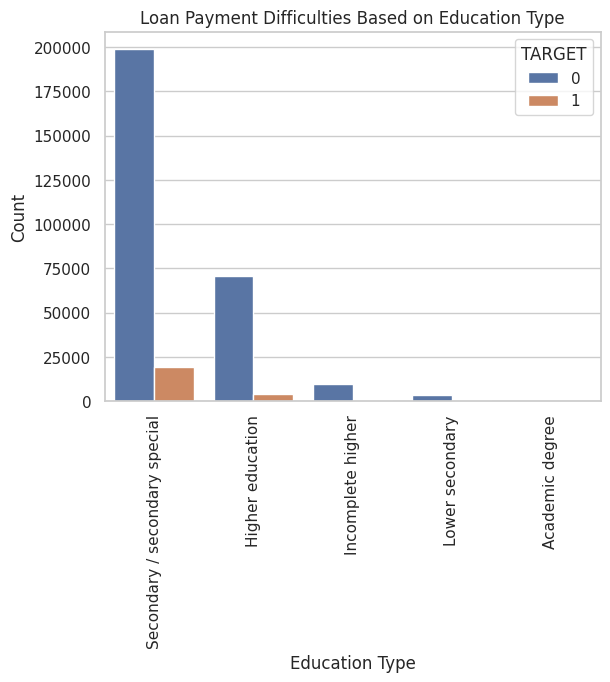

In [ ]:
sns.countplot(x=df['NAME_EDUCATION_TYPE'], hue=df['TARGET'])
plt.title('Loan Payment Difficulties Based on Education Type')
plt.xlabel("Education Type")
plt.ylabel("Count")
plt.xticks(rotation=90)
plt.show()

It is also evident that people who had their education upto Secondary school are more likely to be defaulters, followed by who finished their higher education.

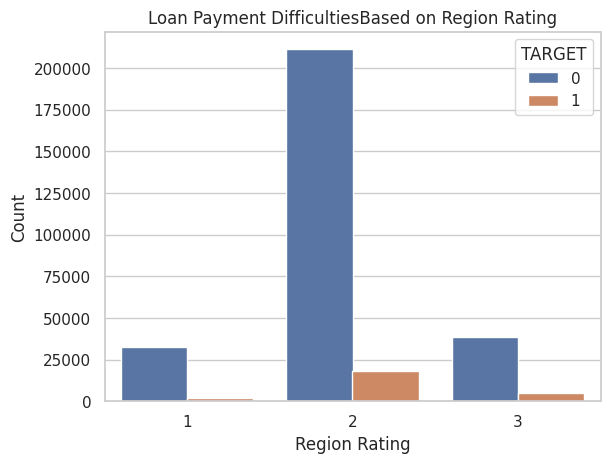

In [ ]:
sns.countplot(x=df['REGION_RATING_CLIENT_W_CITY'], hue=df['TARGET'])
plt.title('Loan Payment DifficultiesBased on Region Rating')
plt.xlabel("Region Rating")
plt.ylabel("Count")
plt.show()

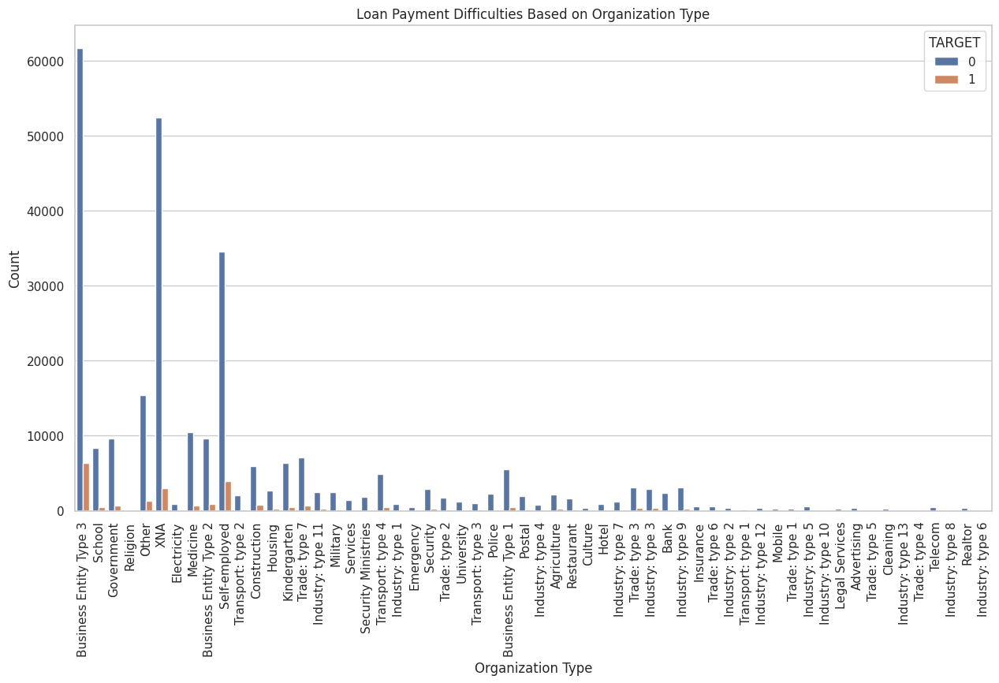

In [ ]:
plt.figure(figsize=(15,8))
sns.countplot(x=df['ORGANIZATION_TYPE'], hue=df['TARGET'])
plt.title('Loan Payment Difficulties Based on Organization Type')
plt.xlabel("Organization Type")
plt.ylabel("Count")
plt.xticks(rotation=90)
plt.show()

We can observe thatclients coming from BUsiness Entity Type 3, Self-employed,XNA and Other organization type tend to be defaulters.

# **Observations & Conclusions**


* It is evident that Females are more probable to be defaulters.

* We can see that most of the contract type are of Cash Loans  and there is also a small margin where Clients having cash loans tend to be defaulters.
However clients with  revolving loans seems to have nearly no default behaviour

* Clients who own Realty are more likely to not pay loan compared ot those who dont own one.
Also majority of the clients own realty. So this conclusion may be bais.

* Clients with very_low income are most likely to be defaulters, followed by medium income range  and then low and high range respectively.

* Clients purchasing low price goods are most likely to be defaulters, followed by very_low income range  and then medium and high range respectively.

* Clients who have longer employment history are most likely to be defaulters and the default rate decrease as new they are in terms of employment.

* Clients who are younger are most likely to be defaulters and the default rate decrease with increase in their age.

* Clients who own car are less likely to be defaulters

* Clients who live in apartment are more likely to be defaulters, followed by clients living with their parents.

* Also clients who are married are more likely to be defaulters, followed by clients who are single and who had civil marriages .

* Clients from Working Income type are most likely to be defaulters followed by those who are commercial associate, pensioner and state servant.

* It is also evident that people who had their education up to Secondary school are more likely to be defaulters, followed by who finished their higher education.

* We can observe that clients coming from Business Entity Type 3, Self-employed,XNA and Other organization type tend to be defaulters.



# NOW WORKING WITH PREVIOUS APPLICATION

In [ ]:
previous_application_data = pd.read_csv("/content/drive/MyDrive/archive/previous_application.csv")


In [ ]:
dfP= pd.DataFrame(previous_application_data);

In [ ]:
dfP.head()
# 1670214 rows × 37 columns

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,Y,1,0.0,0.182832,0.867336,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,Y,1,NaN,NaN,NaN,XNA,Approved,-512,Cash through the bank,XAP,NaN,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,Y,1,NaN,NaN,NaN,Repairs,Refused,-781,Cash through the bank,HC,NaN,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
dfP.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1670214 entries, 0 to 1670213
Data columns (total 37 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   SK_ID_PREV                   1670214 non-null  int64  
 1   SK_ID_CURR                   1670214 non-null  int64  
 2   NAME_CONTRACT_TYPE           1670214 non-null  object 
 3   AMT_ANNUITY                  1297979 non-null  float64
 4   AMT_APPLICATION              1670214 non-null  float64
 5   AMT_CREDIT                   1670213 non-null  float64
 6   AMT_DOWN_PAYMENT             774370 non-null   float64
 7   AMT_GOODS_PRICE              1284699 non-null  float64
 8   WEEKDAY_APPR_PROCESS_START   1670214 non-null  object 
 9   HOUR_APPR_PROCESS_START      1670214 non-null  int64  
 10  FLAG_LAST_APPL_PER_CONTRACT  1670214 non-null  object 
 11  NFLAG_LAST_APPL_IN_DAY       1670214 non-null  int64  
 12  RATE_DOWN_PAYMENT            774370 non-nu

In [ ]:
dfP.isnull().sum()

SK_ID_PREV                           0
SK_ID_CURR                           0
NAME_CONTRACT_TYPE                   0
AMT_ANNUITY                     372235
AMT_APPLICATION                      0
AMT_CREDIT                           1
AMT_DOWN_PAYMENT                895844
AMT_GOODS_PRICE                 385515
WEEKDAY_APPR_PROCESS_START           0
HOUR_APPR_PROCESS_START              0
FLAG_LAST_APPL_PER_CONTRACT          0
NFLAG_LAST_APPL_IN_DAY               0
RATE_DOWN_PAYMENT               895844
RATE_INTEREST_PRIMARY          1664263
RATE_INTEREST_PRIVILEGED       1664263
NAME_CASH_LOAN_PURPOSE               0
NAME_CONTRACT_STATUS                 0
DAYS_DECISION                        0
NAME_PAYMENT_TYPE                    0
CODE_REJECT_REASON                   0
NAME_TYPE_SUITE                 820405
NAME_CLIENT_TYPE                     0
NAME_GOODS_CATEGORY                  0
NAME_PORTFOLIO                       0
NAME_PRODUCT_TYPE                    0
CHANNEL_TYPE             

# **Data Cleaning**

In [ ]:
# Lets calculate the null percent of these columns and sort them accordingly.

null_percentP =round((dfP.isnull().sum()/dfP.shape[0])*100, 2 )
null_percentP
pd.options.display.float_format = "{:.2f}".format



In [ ]:
null_dfP = pd.DataFrame({'column_name' : dfP.columns,'null_percent': null_percentP})
null_dfP.reset_index(drop = True, inplace = True)
null_dfP.sort_values(by="null_percent", ascending=False)

,column_name,null_percent
14,RATE_INTEREST_PRIVILEGED,99.64
13,RATE_INTEREST_PRIMARY,99.64
12,RATE_DOWN_PAYMENT,53.64
6,AMT_DOWN_PAYMENT,53.64
20,NAME_TYPE_SUITE,49.12
36,NFLAG_INSURED_ON_APPROVAL,40.30
31,DAYS_FIRST_DRAWING,40.30
32,DAYS_FIRST_DUE,40.30
33,DAYS_LAST_DUE_1ST_VERSION,40.30
34,DAYS_LAST_DUE,40.30


Lets handle these missing or null values and then begin with analysis data.
We can drop columns that have null percentage greater than 50% because they wont help in analyzing the data.
However the data wiith null percent <50% can be imputed with either mean, median, mode or 0 using fillna() method


In [ ]:
dfP = dfP.drop(["RATE_INTEREST_PRIVILEGED","RATE_DOWN_PAYMENT" , "RATE_INTEREST_PRIMARY", "AMT_DOWN_PAYMENT" ], axis=1)


In [ ]:
null_dfP[null_dfP.null_percent<50].sort_values(by='null_percent', ascending=False)

,column_name,null_percent
20,NAME_TYPE_SUITE,49.12
31,DAYS_FIRST_DRAWING,40.30
35,DAYS_TERMINATION,40.30
34,DAYS_LAST_DUE,40.30
33,DAYS_LAST_DUE_1ST_VERSION,40.30
32,DAYS_FIRST_DUE,40.30
36,NFLAG_INSURED_ON_APPROVAL,40.30
7,AMT_GOODS_PRICE,23.08
3,AMT_ANNUITY,22.29
28,CNT_PAYMENT,22.29


In [ ]:
dfP["NAME_TYPE_SUITE"].isnull().sum()

820405

In [ ]:
dfP["NAME_TYPE_SUITE"].value_counts()

Unaccompanied      508970
Family             213263
Spouse, partner     67069
Children            31566
Other_B             17624
Other_A              9077
Group of people      2240
Name: NAME_TYPE_SUITE, dtype: int64

In [ ]:
mode = dfP["NAME_TYPE_SUITE"].mode()[0]  # [0] is used to get the first mode
print('Most common value:', mode)

Most common value: Unaccompanied


In [ ]:
# lets fill the missing values with Unaccompanied as it is the mode.
dfP["NAME_TYPE_SUITE"]=dfP["NAME_TYPE_SUITE"].fillna(dfP["NAME_TYPE_SUITE"].mode()[0])

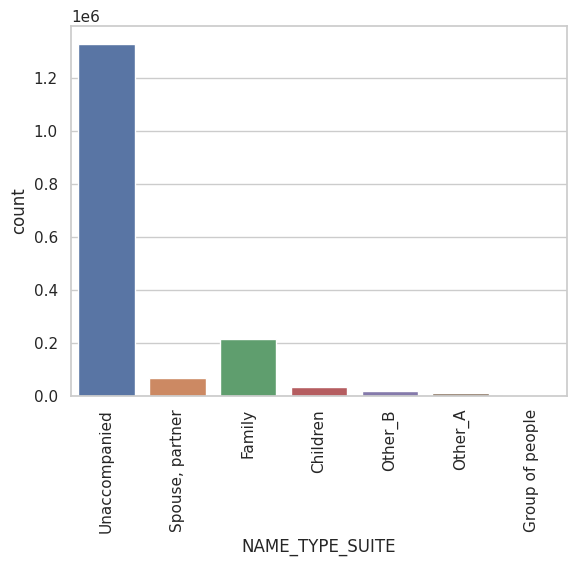

In [ ]:
sns.countplot(x="NAME_TYPE_SUITE", data=dfP)

plt.xticks(rotation=90)
plt.show()

In [ ]:
dfP["DAYS_FIRST_DRAWING"].isnull().sum()

673065

In [ ]:
dfP["DAYS_FIRST_DRAWING"].describe()

count   997149.00
mean    342209.86
std      88916.12
min      -2922.00
25%     365243.00
50%     365243.00
75%     365243.00
max     365243.00
Name: DAYS_FIRST_DRAWING, dtype: float64

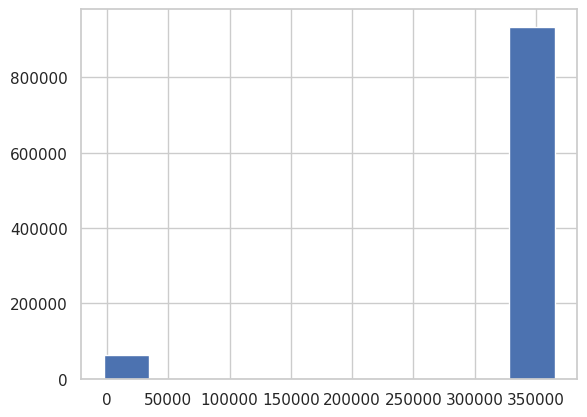

In [ ]:
plt.hist(dfP["DAYS_FIRST_DRAWING"])
plt.show()

In [ ]:
dfP["DAYS_FIRST_DRAWING"].median()


365243.0

In [ ]:
# It is quite evident that data is skewed so it would be better to replace missing values with median
dfP["DAYS_FIRST_DRAWING"]=dfP["DAYS_FIRST_DRAWING"].fillna(dfP["DAYS_FIRST_DRAWING"].median())

In [ ]:
dfP["DAYS_TERMINATION"].isnull().sum()

673065

In [ ]:
dfP["DAYS_TERMINATION"].describe()

count   997149.00
mean     81992.34
std     153303.52
min      -2874.00
25%      -1270.00
50%       -499.00
75%        -44.00
max     365243.00
Name: DAYS_TERMINATION, dtype: float64

In [ ]:
dfP["DAYS_TERMINATION"].median()

-499.0

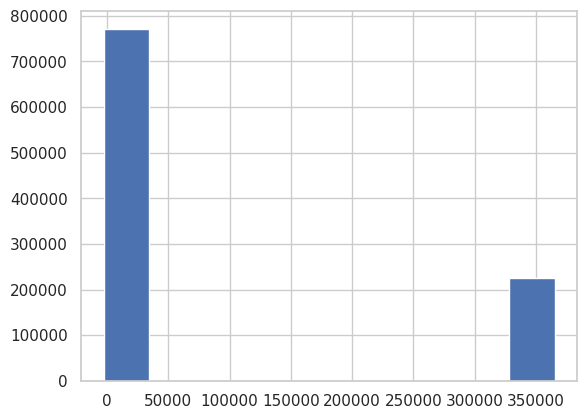

In [ ]:
plt.hist(dfP["DAYS_TERMINATION"])
plt.show()

In [ ]:
# imputing with median as we find a common pattern observed as above columns because of skewness
dfP["DAYS_TERMINATION"]=dfP["DAYS_TERMINATION"].fillna(dfP["DAYS_TERMINATION"].median())

In [ ]:
dfP["DAYS_LAST_DUE"].isnull().sum()

673065

In [ ]:
dfP["DAYS_LAST_DUE"].describe()

count   997149.00
mean     76582.40
std     149647.42
min      -2889.00
25%      -1314.00
50%       -537.00
75%        -74.00
max     365243.00
Name: DAYS_LAST_DUE, dtype: float64

In [ ]:
dfP["DAYS_LAST_DUE"].median()

-537.0

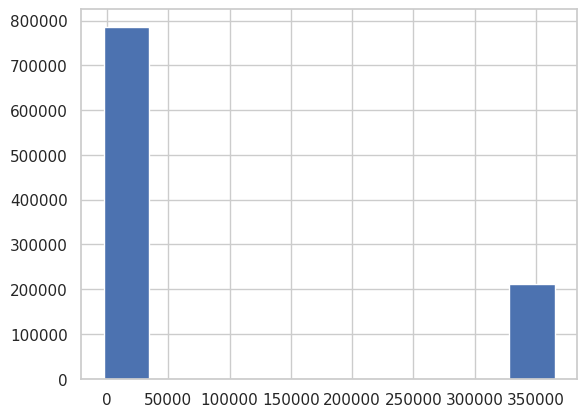

In [ ]:
plt.hist(dfP["DAYS_LAST_DUE"])
plt.show()

In [ ]:
# imputing with median as we find a common pattern observed as above columns because of skewness
dfP["DAYS_LAST_DUE"]=dfP["DAYS_LAST_DUE"].fillna(dfP["DAYS_LAST_DUE"].median())

In [ ]:
dfP["DAYS_LAST_DUE_1ST_VERSION"].isnull().sum()

673065

In [ ]:
dfP["DAYS_LAST_DUE_1ST_VERSION"].describe()

count   997149.00
mean     33767.77
std     106857.03
min      -2801.00
25%      -1242.00
50%       -361.00
75%        129.00
max     365243.00
Name: DAYS_LAST_DUE_1ST_VERSION, dtype: float64

In [ ]:
dfP["DAYS_LAST_DUE_1ST_VERSION"].median()

-361.0

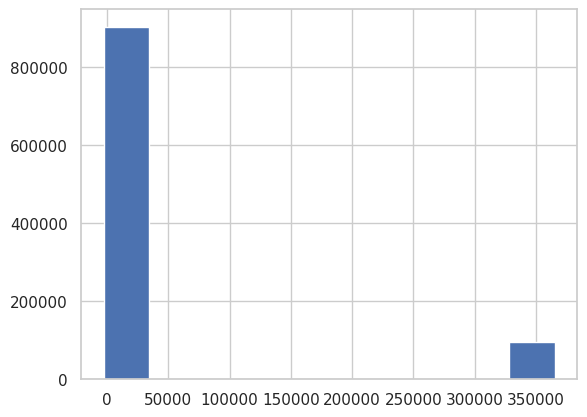

In [ ]:
plt.hist(dfP["DAYS_LAST_DUE_1ST_VERSION"])
plt.show()

In [ ]:
# imputing with median as we find a common pattern observed as above columns because of skewness
dfP["DAYS_LAST_DUE_1ST_VERSION"]=dfP["DAYS_LAST_DUE_1ST_VERSION"].fillna(dfP["DAYS_LAST_DUE_1ST_VERSION"].median())

In [ ]:
dfP["DAYS_FIRST_DUE"].isnull().sum()

673065

In [ ]:
dfP["DAYS_FIRST_DUE"].describe()

count   997149.00
mean     13826.27
std      72444.87
min      -2892.00
25%      -1628.00
50%       -831.00
75%       -411.00
max     365243.00
Name: DAYS_FIRST_DUE, dtype: float64

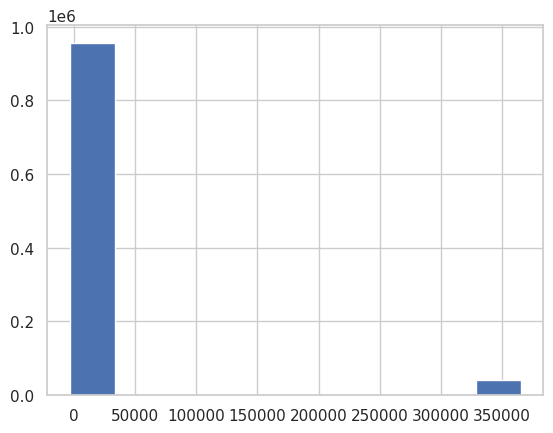

In [ ]:
plt.hist(dfP["DAYS_FIRST_DUE"])
plt.show()

In [ ]:
dfP["DAYS_FIRST_DUE"]=dfP["DAYS_FIRST_DUE"].fillna(dfP["DAYS_FIRST_DUE"].median())

In [ ]:
dfP["NFLAG_INSURED_ON_APPROVAL"].isnull().sum()

673065

In [ ]:
dfP["NFLAG_INSURED_ON_APPROVAL"].describe()

count   997149.00
mean         0.33
std          0.47
min          0.00
25%          0.00
50%          0.00
75%          1.00
max          1.00
Name: NFLAG_INSURED_ON_APPROVAL, dtype: float64

In [ ]:
dfP["NFLAG_INSURED_ON_APPROVAL"].median()

0.0

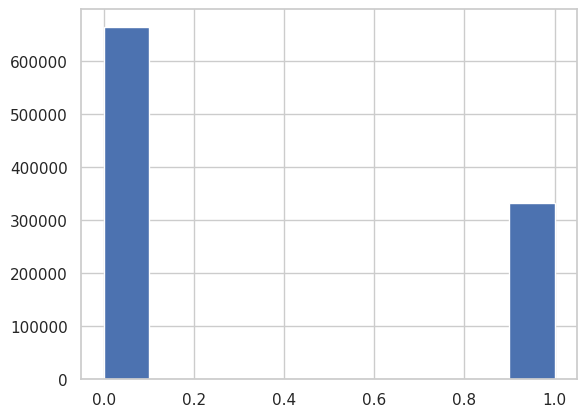

In [ ]:
plt.hist(dfP["NFLAG_INSURED_ON_APPROVAL"])
plt.show()

In [ ]:
# Imputing with median
dfP["NFLAG_INSURED_ON_APPROVAL"]=dfP["NFLAG_INSURED_ON_APPROVAL"].fillna(dfP["NFLAG_INSURED_ON_APPROVAL"].median())

In [ ]:
dfP["AMT_GOODS_PRICE"].isnull().sum()

385515

In [ ]:
dfP["AMT_GOODS_PRICE"].describe()

count   1284699.00
mean     227847.28
std      315396.56
min           0.00
25%       50841.00
50%      112320.00
75%      234000.00
max     6905160.00
Name: AMT_GOODS_PRICE, dtype: float64

In [ ]:
dfP["AMT_GOODS_PRICE"].median()

112320.0

<Axes: xlabel='AMT_GOODS_PRICE'>

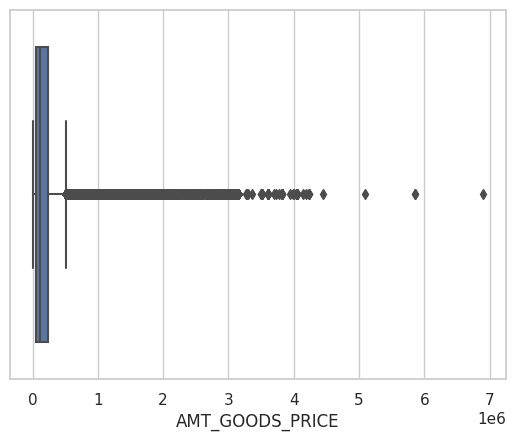

In [ ]:
sns.boxplot(x='AMT_GOODS_PRICE', data=dfP)


<Axes: ylabel='Density'>

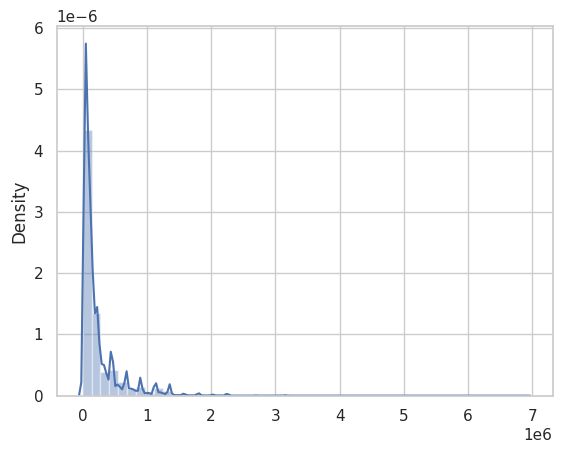

In [ ]:
sns.distplot(x=dfP['AMT_GOODS_PRICE'])

In [ ]:
dfP['AMT_GOODS_PRICE'].isnull().sum()

385515

In [ ]:
dfP['AMT_GOODS_PRICE']=dfP['AMT_GOODS_PRICE'].fillna(dfP['AMT_GOODS_PRICE'].median())

In [ ]:
dfP['AMT_ANNUITY'].isnull().sum()

372235

In [ ]:
pd.options.display.float_format = "{:.2f}".format
dfP['AMT_ANNUITY'].describe()

count   1297979.00
mean      15955.12
std       14782.14
min           0.00
25%        6321.78
50%       11250.00
75%       20658.42
max      418058.15
Name: AMT_ANNUITY, dtype: float64

In [ ]:
dfP['AMT_ANNUITY'].median()

11250.0

<Axes: xlabel='AMT_ANNUITY', ylabel='Count'>

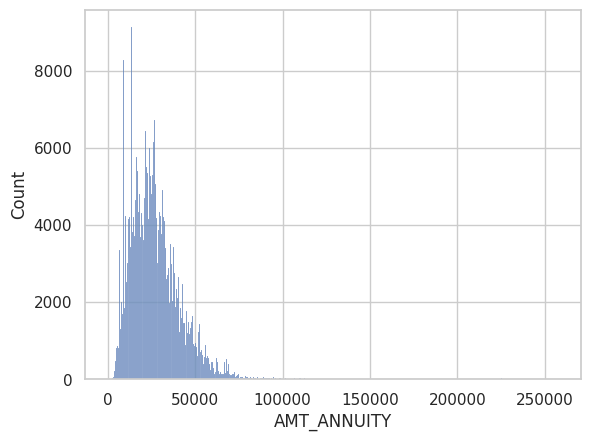

In [ ]:
# Lets plot a histogram and boxplot to get better understanding of the column

sns.histplot(x='AMT_ANNUITY', data=df)

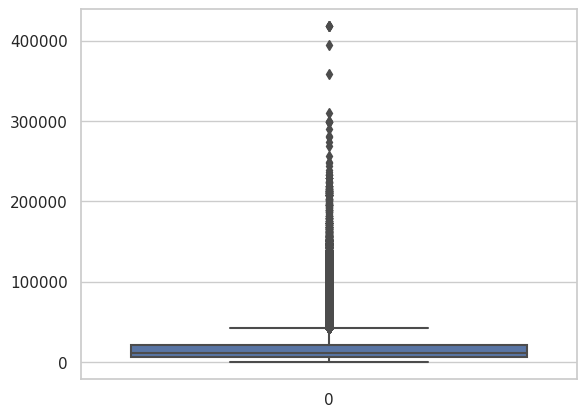

In [ ]:
sns.boxplot(dfP.AMT_ANNUITY)
plt.show()

In [ ]:
# Imputing null values with median
dfP["AMT_ANNUITY"]=dfP["AMT_ANNUITY"].fillna(dfP["AMT_ANNUITY"].median())

In [ ]:
dfP['CNT_PAYMENT'].describe()

count   1297984.00
mean         16.05
std          14.57
min           0.00
25%           6.00
50%          12.00
75%          24.00
max          84.00
Name: CNT_PAYMENT, dtype: float64

In [ ]:
dfP['CNT_PAYMENT'].median()

12.0

In [ ]:
dfP["CNT_PAYMENT"].isnull().sum()

372230

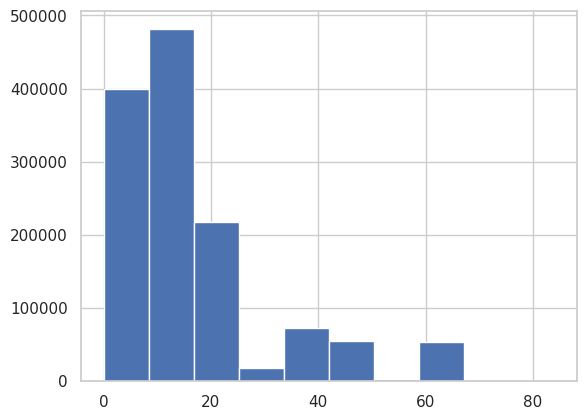

In [ ]:
plt.hist(dfP["CNT_PAYMENT"])
plt.show()

In [ ]:
# The median is less influenced by extreme values and is a robust measure of central tendency, making it suitable for distributions with skewness.
# The right tail of the distribution is longer or fatter than the left tail. So it is case of positive or right skewness

# Imputing missing values with median
dfP["CNT_PAYMENT"]=dfP["CNT_PAYMENT"].fillna(dfP["CNT_PAYMENT"].median())



In [ ]:
dfP.isnull().sum()

SK_ID_PREV                       0
SK_ID_CURR                       0
NAME_CONTRACT_TYPE               0
AMT_ANNUITY                      0
AMT_APPLICATION                  0
AMT_CREDIT                       1
AMT_GOODS_PRICE                  0
WEEKDAY_APPR_PROCESS_START       0
HOUR_APPR_PROCESS_START          0
FLAG_LAST_APPL_PER_CONTRACT      0
NFLAG_LAST_APPL_IN_DAY           0
NAME_CASH_LOAN_PURPOSE           0
NAME_CONTRACT_STATUS             0
DAYS_DECISION                    0
NAME_PAYMENT_TYPE                0
CODE_REJECT_REASON               0
NAME_TYPE_SUITE                  0
NAME_CLIENT_TYPE                 0
NAME_GOODS_CATEGORY              0
NAME_PORTFOLIO                   0
NAME_PRODUCT_TYPE                0
CHANNEL_TYPE                     0
SELLERPLACE_AREA                 0
NAME_SELLER_INDUSTRY             0
CNT_PAYMENT                      0
NAME_YIELD_GROUP                 0
PRODUCT_COMBINATION            346
DAYS_FIRST_DRAWING               0
DAYS_FIRST_DUE      

In [ ]:
dfP["PRODUCT_COMBINATION"].isnull().sum()

346

In [ ]:
dfP["PRODUCT_COMBINATION"].describe()

count     1669868
unique         17
top          Cash
freq       285990
Name: PRODUCT_COMBINATION, dtype: object

In [ ]:
dfP["PRODUCT_COMBINATION"].mode()[0]

'Cash'

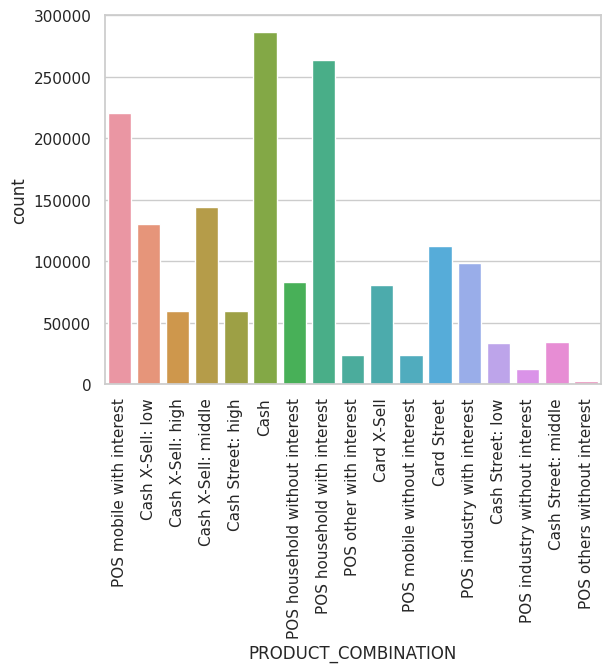

In [ ]:
sns.countplot(data=dfP, x='PRODUCT_COMBINATION')
plt.xticks(rotation=90)
plt.show()

In [ ]:
# Imputing missing values with mode or most frequent product
dfP["PRODUCT_COMBINATION"]=dfP["PRODUCT_COMBINATION"].fillna(dfP["PRODUCT_COMBINATION"].mode()[0])

In [ ]:
dfP["AMT_CREDIT"].isnull().sum()

1

In [ ]:
dfP[dfP["AMT_CREDIT"].isnull()]

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
1127152,2204450,438387,Revolving loans,0.00,0.00,NaN,112320.00,FRIDAY,10,Y,1,XAP,Approved,-608,XNA,XAP,Unaccompanied,Repeater,XNA,Cards,walk-in,Country-wide,20,Connectivity,0.00,XNA,Card Street,365243.00,-831.00,-361.00,-537.00,-499.00,0.00


In [ ]:
dfP["AMT_CREDIT"].describe()

count   1670213.00
mean     196114.02
std      318574.62
min           0.00
25%       24160.50
50%       80541.00
75%      216418.50
max     6905160.00
Name: AMT_CREDIT, dtype: float64

<Axes: ylabel='Density'>

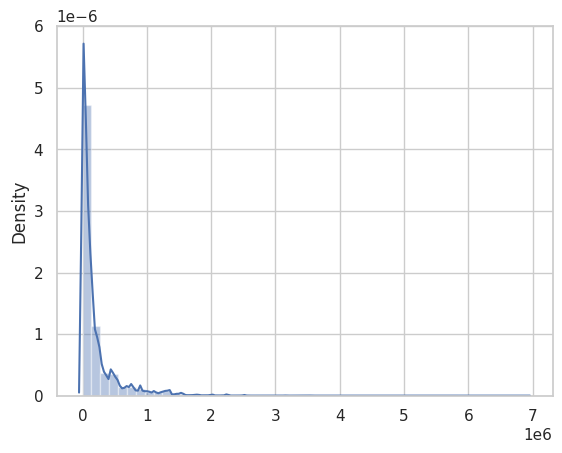

In [ ]:
sns.distplot(x=dfP["AMT_CREDIT"])

In [ ]:
dfP["AMT_CREDIT"]=dfP["AMT_CREDIT"].fillna(dfP["AMT_CREDIT"].median)

## EXPLORATORY DATA ANALYSIS AND LEARNING ABOUT DATA

In [ ]:
dfP["NAME_CONTRACT_TYPE"].value_counts()

Cash loans         747553
Consumer loans     729151
Revolving loans    193164
XNA                   346
Name: NAME_CONTRACT_TYPE, dtype: int64

Lets plot countplot to understand more about distribution.

<Axes: xlabel='NAME_CONTRACT_TYPE', ylabel='count'>

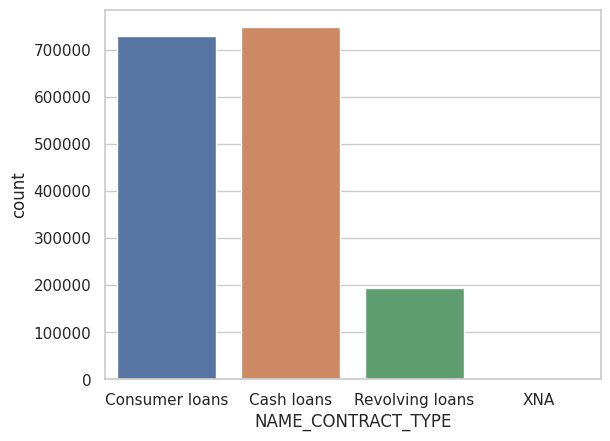

In [ ]:
sns.countplot(x=dfP['NAME_CONTRACT_TYPE'])

Lets plot distplot to understand more about distribution.

In [ ]:
dfP['AMT_ANNUITY'].describe()

count   1670214.00
mean      14906.51
std       13177.51
min           0.00
25%        7547.10
50%       11250.00
75%       16824.03
max      418058.15
Name: AMT_ANNUITY, dtype: float64

<Axes: xlabel='AMT_ANNUITY', ylabel='Density'>

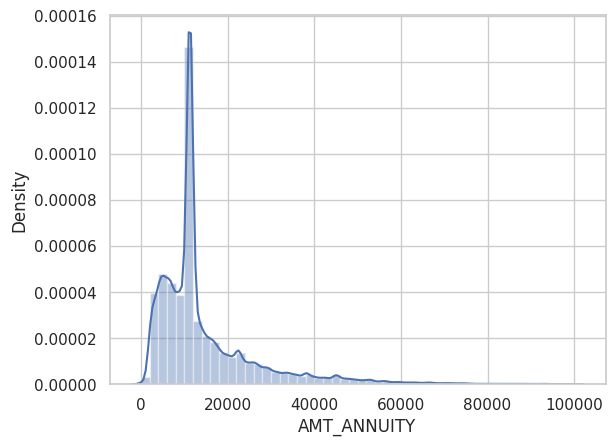

In [ ]:
sns.distplot(dfP[dfP['AMT_ANNUITY']<100000].AMT_ANNUITY)

In [ ]:
dfP['AMT_APPLICATION'].describe()

count   1670214.00
mean     175233.86
std      292779.76
min           0.00
25%       18720.00
50%       71046.00
75%      180360.00
max     6905160.00
Name: AMT_APPLICATION, dtype: float64

Lets plot distplot to understand more about distribution.

<Axes: xlabel='AMT_APPLICATION', ylabel='Density'>

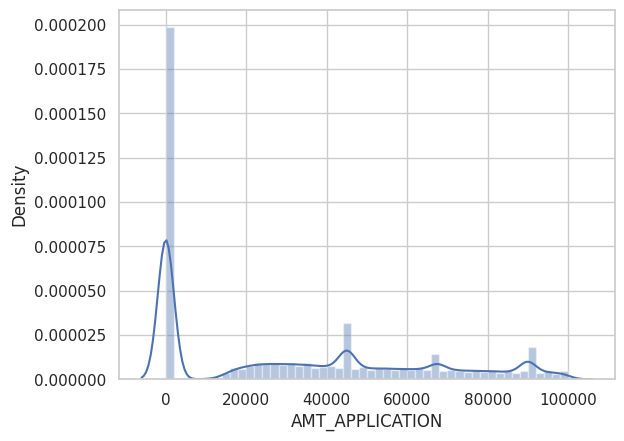

In [ ]:
sns.distplot(dfP[dfP['AMT_APPLICATION']<100000].AMT_APPLICATION)

Lets plot distplot to understand more about distribution.

In [ ]:
dfP['AMT_GOODS_PRICE'].describe()

count   1670214.00
mean     201181.54
std      280862.86
min           0.00
25%       67500.00
50%      112320.00
75%      180405.00
max     6905160.00
Name: AMT_GOODS_PRICE, dtype: float64

<Axes: ylabel='Density'>

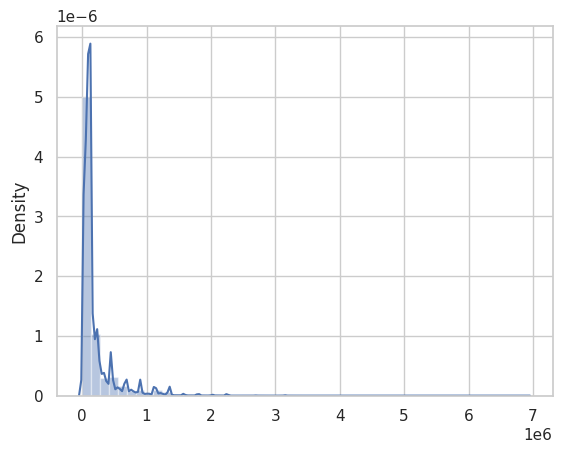

In [ ]:
sns.distplot(x=dfP['AMT_GOODS_PRICE'])

In [ ]:
dfP['WEEKDAY_APPR_PROCESS_START'].value_counts()

TUESDAY      255118
WEDNESDAY    255010
MONDAY       253557
FRIDAY       252048
THURSDAY     249099
SATURDAY     240631
SUNDAY       164751
Name: WEEKDAY_APPR_PROCESS_START, dtype: int64

Lets plot countplot to understand more about distribution.

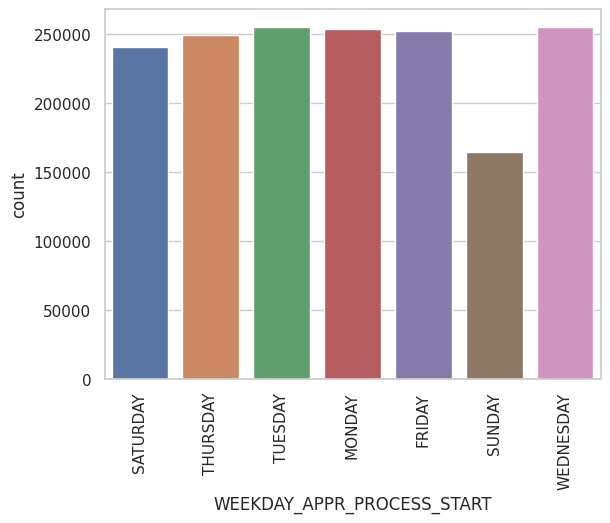

In [ ]:
sns.countplot(x=dfP['WEEKDAY_APPR_PROCESS_START'])
plt.xticks(rotation=90)

plt.show()

In [ ]:
dfP['HOUR_APPR_PROCESS_START'].value_counts().sort_values(ascending=False)

11    192728
12    185980
10    181690
13    172256
14    157711
15    142965
9     127002
16    121361
17     95064
8      73085
18     64156
7      45646
19     34089
6      25759
5      15392
20     14535
4       9319
3       5035
21      4082
2       1116
22       720
1        212
23       202
0        109
Name: HOUR_APPR_PROCESS_START, dtype: int64

Lets plot countplot to understand more about distribution.

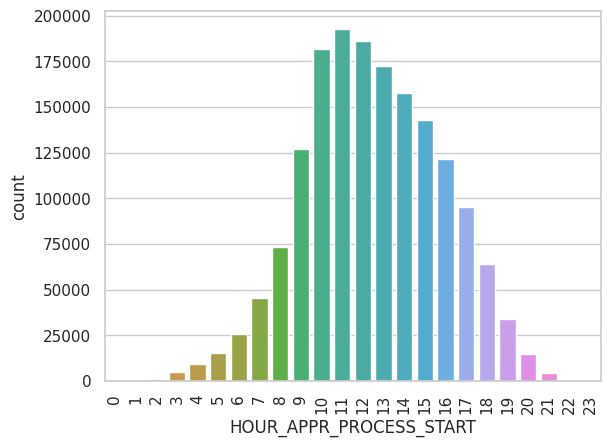

In [ ]:
sns.countplot(x=dfP['HOUR_APPR_PROCESS_START'])
plt.xticks(rotation=90)

plt.show()

In [ ]:
dfP['NAME_CASH_LOAN_PURPOSE'].value_counts()

XAP                                 922661
XNA                                 677918
Repairs                              23765
Other                                15608
Urgent needs                          8412
Buying a used car                     2888
Building a house or an annex          2693
Everyday expenses                     2416
Medicine                              2174
Payments on other loans               1931
Education                             1573
Journey                               1239
Purchase of electronic equipment      1061
Buying a new car                      1012
Wedding / gift / holiday               962
Buying a home                          865
Car repairs                            797
Furniture                              749
Buying a holiday home / land           533
Business development                   426
Gasification / water supply            300
Buying a garage                        136
Hobby                                   55
Money for a

Lets plot countplot to understand more about distribution.

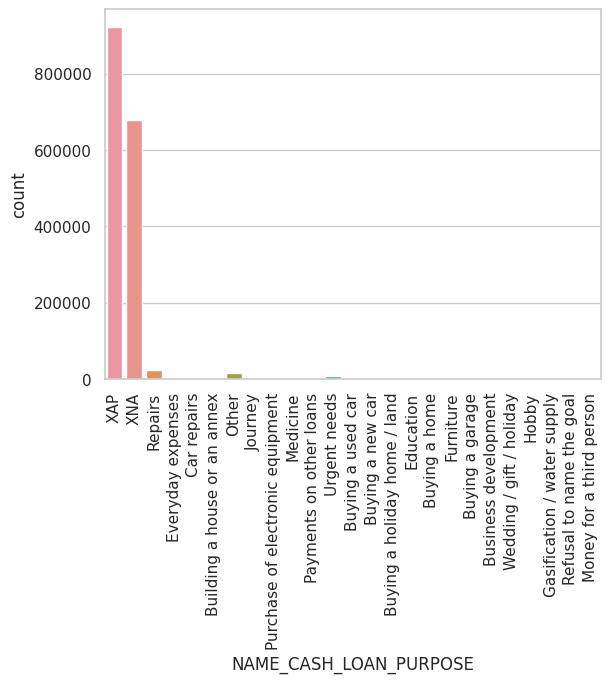

In [ ]:
sns.countplot(x=dfP['NAME_CASH_LOAN_PURPOSE'])
plt.xticks(rotation=90)

plt.show()

In [ ]:
dfP['NAME_CONTRACT_STATUS'].value_counts()

Approved        1036781
Canceled         316319
Refused          290678
Unused offer      26436
Name: NAME_CONTRACT_STATUS, dtype: int64

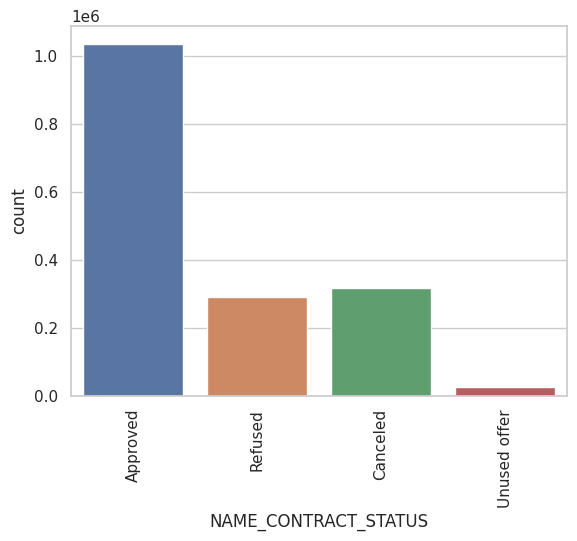

In [ ]:
sns.countplot(x=dfP['NAME_CONTRACT_STATUS'])
plt.xticks(rotation=90)

plt.show()

In [ ]:
dfP['NAME_PAYMENT_TYPE'].value_counts()

Cash through the bank                        1033552
XNA                                           627384
Non-cash from your account                      8193
Cashless from the account of the employer       1085
Name: NAME_PAYMENT_TYPE, dtype: int64

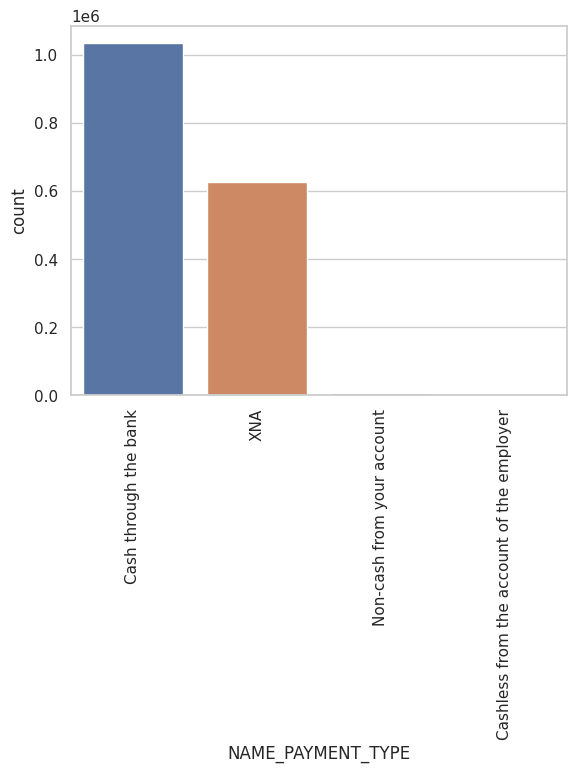

In [ ]:
sns.countplot(x=dfP['NAME_PAYMENT_TYPE'])
plt.xticks(rotation=90)

plt.show()

Not implemenrted yet

In [ ]:
dfP.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.43,17145.00,17145.00,17145.00,SATURDAY,15,Y,1,XAP,Approved,-73,Cash through the bank,XAP,Unaccompanied,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.00,middle,POS mobile with interest,365243.00,-42.00,300.00,-42.00,-37.00,0.00
1,2802425,108129,Cash loans,25188.62,607500.00,679671.00,607500.00,THURSDAY,11,Y,1,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.00,low_action,Cash X-Sell: low,365243.00,-134.00,916.00,365243.00,365243.00,1.00
2,2523466,122040,Cash loans,15060.74,112500.00,136444.50,112500.00,TUESDAY,11,Y,1,XNA,Approved,-301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.00,high,Cash X-Sell: high,365243.00,-271.00,59.00,365243.00,365243.00,1.00
3,2819243,176158,Cash loans,47041.33,450000.00,470790.00,450000.00,MONDAY,7,Y,1,XNA,Approved,-512,Cash through the bank,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.00,middle,Cash X-Sell: middle,365243.00,-482.00,-152.00,-182.00,-177.00,1.00
4,1784265,202054,Cash loans,31924.40,337500.00,404055.00,337500.00,THURSDAY,9,Y,1,Repairs,Refused,-781,Cash through the bank,HC,Unaccompanied,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.00,high,Cash Street: high,365243.00,-831.00,-361.00,-537.00,-499.00,0.00


In [ ]:
dfP['DAYS_DECISION']=(abs(dfP['DAYS_DECISION'])//365)
dfP.rename(columns={'DAYS_DECISION':'YEARS_DECISION'})

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,YEARS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.43,17145.00,17145.00,17145.00,SATURDAY,15,Y,1,XAP,Approved,0,Cash through the bank,XAP,Unaccompanied,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.00,middle,POS mobile with interest,365243.00,-42.00,300.00,-42.00,-37.00,0.00
1,2802425,108129,Cash loans,25188.62,607500.00,679671.00,607500.00,THURSDAY,11,Y,1,XNA,Approved,0,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.00,low_action,Cash X-Sell: low,365243.00,-134.00,916.00,365243.00,365243.00,1.00
2,2523466,122040,Cash loans,15060.74,112500.00,136444.50,112500.00,TUESDAY,11,Y,1,XNA,Approved,0,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.00,high,Cash X-Sell: high,365243.00,-271.00,59.00,365243.00,365243.00,1.00
3,2819243,176158,Cash loans,47041.33,450000.00,470790.00,450000.00,MONDAY,7,Y,1,XNA,Approved,1,Cash through the bank,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.00,middle,Cash X-Sell: middle,365243.00,-482.00,-152.00,-182.00,-177.00,1.00
4,1784265,202054,Cash loans,31924.40,337500.00,404055.00,337500.00,THURSDAY,9,Y,1,Repairs,Refused,2,Cash through the bank,HC,Unaccompanied,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.00,high,Cash Street: high,365243.00,-831.00,-361.00,-537.00,-499.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1670209,2300464,352015,Consumer loans,14704.29,267295.50,311400.00,267295.50,WEDNESDAY,12,Y,1,XAP,Approved,1,Cash through the bank,XAP,Unaccompanied,Refreshed,Furniture,POS,XNA,Stone,43,Furniture,30.00,low_normal,POS industry with interest,365243.00,-508.00,362.00,-358.00,-351.00,0.00
1670210,2357031,334635,Consumer loans,6622.02,87750.00,64291.50,87750.00,TUESDAY,15,Y,1,XAP,Approved,4,Cash through the bank,XAP,Unaccompanied,New,Furniture,POS,XNA,Stone,43,Furniture,12.00,middle,POS industry with interest,365243.00,-1604.00,-1274.00,-1304.00,-1297.00,0.00
1670211,2659632,249544,Consumer loans,11520.85,105237.00,102523.50,105237.00,MONDAY,12,Y,1,XAP,Approved,4,Cash through the bank,XAP,"Spouse, partner",Repeater,Consumer Electronics,POS,XNA,Country-wide,1370,Consumer electronics,10.00,low_normal,POS household with interest,365243.00,-1457.00,-1187.00,-1187.00,-1181.00,0.00
1670212,2785582,400317,Cash loans,18821.52,180000.00,191880.00,180000.00,WEDNESDAY,9,Y,1,XNA,Approved,3,Cash through the bank,XAP,Family,Repeater,XNA,Cash,x-sell,AP+ (Cash loan),-1,XNA,12.00,low_normal,Cash X-Sell: low,365243.00,-1155.00,-825.00,-825.00,-817.00,1.00


In [ ]:

dfP['DAYS_FIRST_DUE']=(abs(dfP['DAYS_FIRST_DUE'])//365)
dfP.rename(columns={'DAYS_FIRST_DUE':'YEARS_FIRST_DUE'})

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,YEARS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.43,17145.00,17145.00,17145.00,SATURDAY,15,Y,1,XAP,Approved,0,Cash through the bank,XAP,Unaccompanied,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.00,middle,POS mobile with interest,365243.00,0.00,300.00,-42.00,-37.00,0.00
1,2802425,108129,Cash loans,25188.62,607500.00,679671.00,607500.00,THURSDAY,11,Y,1,XNA,Approved,0,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.00,low_action,Cash X-Sell: low,365243.00,0.00,916.00,365243.00,365243.00,1.00
2,2523466,122040,Cash loans,15060.74,112500.00,136444.50,112500.00,TUESDAY,11,Y,1,XNA,Approved,0,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.00,high,Cash X-Sell: high,365243.00,0.00,59.00,365243.00,365243.00,1.00
3,2819243,176158,Cash loans,47041.33,450000.00,470790.00,450000.00,MONDAY,7,Y,1,XNA,Approved,1,Cash through the bank,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.00,middle,Cash X-Sell: middle,365243.00,1.00,-152.00,-182.00,-177.00,1.00
4,1784265,202054,Cash loans,31924.40,337500.00,404055.00,337500.00,THURSDAY,9,Y,1,Repairs,Refused,2,Cash through the bank,HC,Unaccompanied,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.00,high,Cash Street: high,365243.00,2.00,-361.00,-537.00,-499.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1670209,2300464,352015,Consumer loans,14704.29,267295.50,311400.00,267295.50,WEDNESDAY,12,Y,1,XAP,Approved,1,Cash through the bank,XAP,Unaccompanied,Refreshed,Furniture,POS,XNA,Stone,43,Furniture,30.00,low_normal,POS industry with interest,365243.00,1.00,362.00,-358.00,-351.00,0.00
1670210,2357031,334635,Consumer loans,6622.02,87750.00,64291.50,87750.00,TUESDAY,15,Y,1,XAP,Approved,4,Cash through the bank,XAP,Unaccompanied,New,Furniture,POS,XNA,Stone,43,Furniture,12.00,middle,POS industry with interest,365243.00,4.00,-1274.00,-1304.00,-1297.00,0.00
1670211,2659632,249544,Consumer loans,11520.85,105237.00,102523.50,105237.00,MONDAY,12,Y,1,XAP,Approved,4,Cash through the bank,XAP,"Spouse, partner",Repeater,Consumer Electronics,POS,XNA,Country-wide,1370,Consumer electronics,10.00,low_normal,POS household with interest,365243.00,3.00,-1187.00,-1187.00,-1181.00,0.00
1670212,2785582,400317,Cash loans,18821.52,180000.00,191880.00,180000.00,WEDNESDAY,9,Y,1,XNA,Approved,3,Cash through the bank,XAP,Family,Repeater,XNA,Cash,x-sell,AP+ (Cash loan),-1,XNA,12.00,low_normal,Cash X-Sell: low,365243.00,3.00,-825.00,-825.00,-817.00,1.00


In [ ]:

dfP['DAYS_LAST_DUE_1ST_VERSION']=(abs(dfP['DAYS_LAST_DUE_1ST_VERSION'])//365)
dfP.rename(columns={'DAYS_LAST_DUE_1ST_VERSION':'YEARS_LAST_DUE_1ST_VERSION'})

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,YEARS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.43,17145.00,17145.00,17145.00,SATURDAY,15,Y,1,XAP,Approved,0,Cash through the bank,XAP,Unaccompanied,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.00,middle,POS mobile with interest,365243.00,0.00,0.00,-42.00,-37.00,0.00
1,2802425,108129,Cash loans,25188.62,607500.00,679671.00,607500.00,THURSDAY,11,Y,1,XNA,Approved,0,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.00,low_action,Cash X-Sell: low,365243.00,0.00,2.00,365243.00,365243.00,1.00
2,2523466,122040,Cash loans,15060.74,112500.00,136444.50,112500.00,TUESDAY,11,Y,1,XNA,Approved,0,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.00,high,Cash X-Sell: high,365243.00,0.00,0.00,365243.00,365243.00,1.00
3,2819243,176158,Cash loans,47041.33,450000.00,470790.00,450000.00,MONDAY,7,Y,1,XNA,Approved,1,Cash through the bank,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.00,middle,Cash X-Sell: middle,365243.00,1.00,0.00,-182.00,-177.00,1.00
4,1784265,202054,Cash loans,31924.40,337500.00,404055.00,337500.00,THURSDAY,9,Y,1,Repairs,Refused,2,Cash through the bank,HC,Unaccompanied,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.00,high,Cash Street: high,365243.00,2.00,0.00,-537.00,-499.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1670209,2300464,352015,Consumer loans,14704.29,267295.50,311400.00,267295.50,WEDNESDAY,12,Y,1,XAP,Approved,1,Cash through the bank,XAP,Unaccompanied,Refreshed,Furniture,POS,XNA,Stone,43,Furniture,30.00,low_normal,POS industry with interest,365243.00,1.00,0.00,-358.00,-351.00,0.00
1670210,2357031,334635,Consumer loans,6622.02,87750.00,64291.50,87750.00,TUESDAY,15,Y,1,XAP,Approved,4,Cash through the bank,XAP,Unaccompanied,New,Furniture,POS,XNA,Stone,43,Furniture,12.00,middle,POS industry with interest,365243.00,4.00,3.00,-1304.00,-1297.00,0.00
1670211,2659632,249544,Consumer loans,11520.85,105237.00,102523.50,105237.00,MONDAY,12,Y,1,XAP,Approved,4,Cash through the bank,XAP,"Spouse, partner",Repeater,Consumer Electronics,POS,XNA,Country-wide,1370,Consumer electronics,10.00,low_normal,POS household with interest,365243.00,3.00,3.00,-1187.00,-1181.00,0.00
1670212,2785582,400317,Cash loans,18821.52,180000.00,191880.00,180000.00,WEDNESDAY,9,Y,1,XNA,Approved,3,Cash through the bank,XAP,Family,Repeater,XNA,Cash,x-sell,AP+ (Cash loan),-1,XNA,12.00,low_normal,Cash X-Sell: low,365243.00,3.00,2.00,-825.00,-817.00,1.00


In [ ]:

dfP['DAYS_LAST_DUE']=(abs(dfP['DAYS_LAST_DUE'])//365)
dfP.rename(columns={'DAYS_LAST_DUE':'YEARS_LAST_DUE'})

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,YEARS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.43,17145.00,17145.00,17145.00,SATURDAY,15,Y,1,XAP,Approved,0,Cash through the bank,XAP,Unaccompanied,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.00,middle,POS mobile with interest,365243.00,0.00,0.00,0.00,-37.00,0.00
1,2802425,108129,Cash loans,25188.62,607500.00,679671.00,607500.00,THURSDAY,11,Y,1,XNA,Approved,0,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.00,low_action,Cash X-Sell: low,365243.00,0.00,2.00,1000.00,365243.00,1.00
2,2523466,122040,Cash loans,15060.74,112500.00,136444.50,112500.00,TUESDAY,11,Y,1,XNA,Approved,0,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.00,high,Cash X-Sell: high,365243.00,0.00,0.00,1000.00,365243.00,1.00
3,2819243,176158,Cash loans,47041.33,450000.00,470790.00,450000.00,MONDAY,7,Y,1,XNA,Approved,1,Cash through the bank,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.00,middle,Cash X-Sell: middle,365243.00,1.00,0.00,0.00,-177.00,1.00
4,1784265,202054,Cash loans,31924.40,337500.00,404055.00,337500.00,THURSDAY,9,Y,1,Repairs,Refused,2,Cash through the bank,HC,Unaccompanied,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.00,high,Cash Street: high,365243.00,2.00,0.00,1.00,-499.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1670209,2300464,352015,Consumer loans,14704.29,267295.50,311400.00,267295.50,WEDNESDAY,12,Y,1,XAP,Approved,1,Cash through the bank,XAP,Unaccompanied,Refreshed,Furniture,POS,XNA,Stone,43,Furniture,30.00,low_normal,POS industry with interest,365243.00,1.00,0.00,0.00,-351.00,0.00
1670210,2357031,334635,Consumer loans,6622.02,87750.00,64291.50,87750.00,TUESDAY,15,Y,1,XAP,Approved,4,Cash through the bank,XAP,Unaccompanied,New,Furniture,POS,XNA,Stone,43,Furniture,12.00,middle,POS industry with interest,365243.00,4.00,3.00,3.00,-1297.00,0.00
1670211,2659632,249544,Consumer loans,11520.85,105237.00,102523.50,105237.00,MONDAY,12,Y,1,XAP,Approved,4,Cash through the bank,XAP,"Spouse, partner",Repeater,Consumer Electronics,POS,XNA,Country-wide,1370,Consumer electronics,10.00,low_normal,POS household with interest,365243.00,3.00,3.00,3.00,-1181.00,0.00
1670212,2785582,400317,Cash loans,18821.52,180000.00,191880.00,180000.00,WEDNESDAY,9,Y,1,XNA,Approved,3,Cash through the bank,XAP,Family,Repeater,XNA,Cash,x-sell,AP+ (Cash loan),-1,XNA,12.00,low_normal,Cash X-Sell: low,365243.00,3.00,2.00,2.00,-817.00,1.00


In [ ]:

dfP['DAYS_TERMINATION']=(abs(dfP['DAYS_TERMINATION'])//365)
dfP.rename(columns={'DAYS_TERMINATION':'YEARS_TERMINATION'})

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,YEARS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.43,17145.00,17145.00,17145.00,SATURDAY,15,Y,1,XAP,Approved,0,Cash through the bank,XAP,Unaccompanied,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.00,middle,POS mobile with interest,365243.00,0.00,0.00,0.00,0.00,0.00
1,2802425,108129,Cash loans,25188.62,607500.00,679671.00,607500.00,THURSDAY,11,Y,1,XNA,Approved,0,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.00,low_action,Cash X-Sell: low,365243.00,0.00,2.00,1000.00,1000.00,1.00
2,2523466,122040,Cash loans,15060.74,112500.00,136444.50,112500.00,TUESDAY,11,Y,1,XNA,Approved,0,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.00,high,Cash X-Sell: high,365243.00,0.00,0.00,1000.00,1000.00,1.00
3,2819243,176158,Cash loans,47041.33,450000.00,470790.00,450000.00,MONDAY,7,Y,1,XNA,Approved,1,Cash through the bank,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.00,middle,Cash X-Sell: middle,365243.00,1.00,0.00,0.00,0.00,1.00
4,1784265,202054,Cash loans,31924.40,337500.00,404055.00,337500.00,THURSDAY,9,Y,1,Repairs,Refused,2,Cash through the bank,HC,Unaccompanied,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.00,high,Cash Street: high,365243.00,2.00,0.00,1.00,1.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1670209,2300464,352015,Consumer loans,14704.29,267295.50,311400.00,267295.50,WEDNESDAY,12,Y,1,XAP,Approved,1,Cash through the bank,XAP,Unaccompanied,Refreshed,Furniture,POS,XNA,Stone,43,Furniture,30.00,low_normal,POS industry with interest,365243.00,1.00,0.00,0.00,0.00,0.00
1670210,2357031,334635,Consumer loans,6622.02,87750.00,64291.50,87750.00,TUESDAY,15,Y,1,XAP,Approved,4,Cash through the bank,XAP,Unaccompanied,New,Furniture,POS,XNA,Stone,43,Furniture,12.00,middle,POS industry with interest,365243.00,4.00,3.00,3.00,3.00,0.00
1670211,2659632,249544,Consumer loans,11520.85,105237.00,102523.50,105237.00,MONDAY,12,Y,1,XAP,Approved,4,Cash through the bank,XAP,"Spouse, partner",Repeater,Consumer Electronics,POS,XNA,Country-wide,1370,Consumer electronics,10.00,low_normal,POS household with interest,365243.00,3.00,3.00,3.00,3.00,0.00
1670212,2785582,400317,Cash loans,18821.52,180000.00,191880.00,180000.00,WEDNESDAY,9,Y,1,XNA,Approved,3,Cash through the bank,XAP,Family,Repeater,XNA,Cash,x-sell,AP+ (Cash loan),-1,XNA,12.00,low_normal,Cash X-Sell: low,365243.00,3.00,2.00,2.00,2.00,1.00


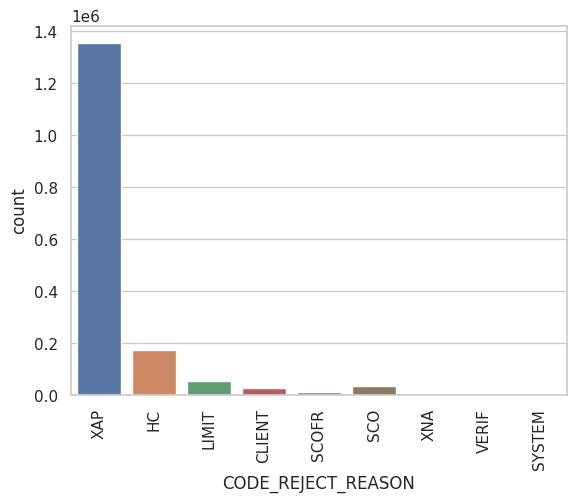

In [ ]:

sns.countplot(x="CODE_REJECT_REASON", data=dfP)
plt.xticks(rotation=90)
plt.show()

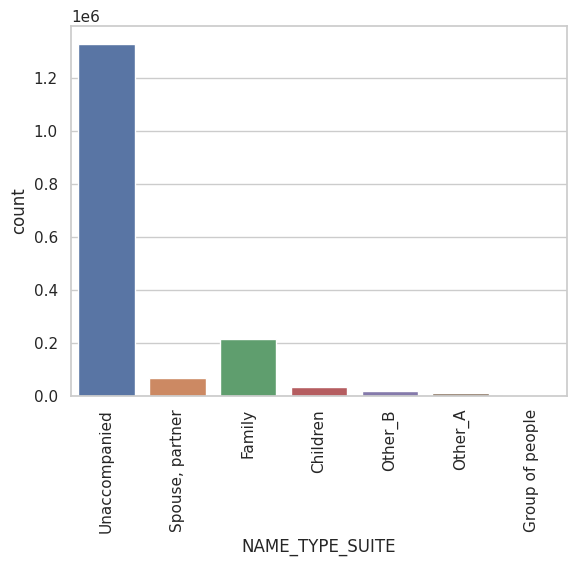

In [ ]:

sns.countplot(x="NAME_TYPE_SUITE", data=dfP)
plt.xticks(rotation=90)
plt.show()

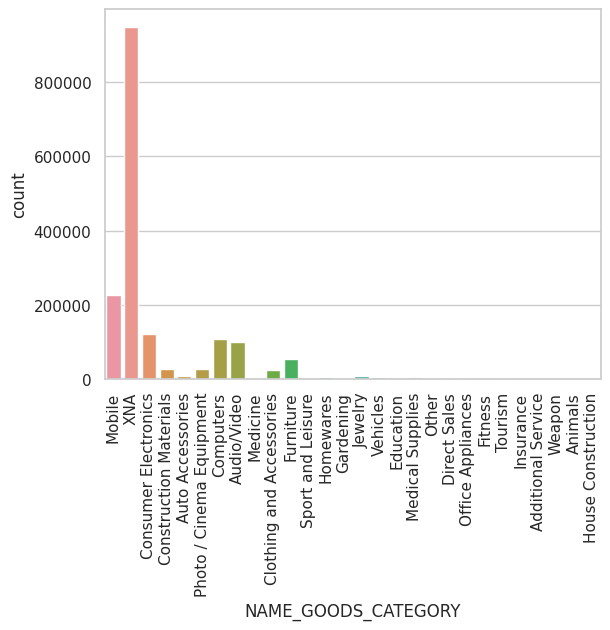

In [ ]:

sns.countplot(x="NAME_GOODS_CATEGORY", data=dfP)
plt.xticks(rotation=90)
plt.show()

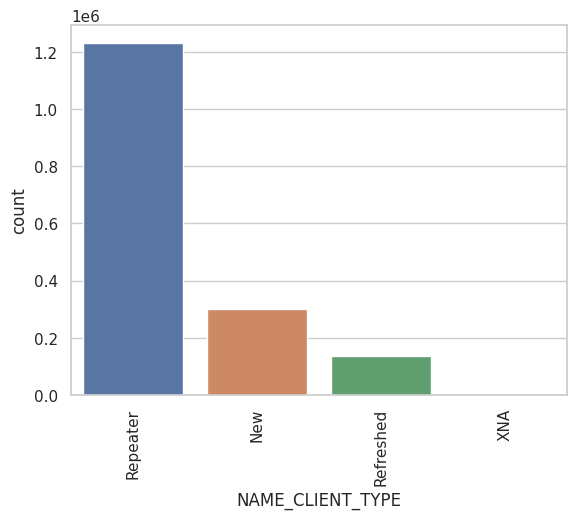

In [ ]:

sns.countplot(x="NAME_CLIENT_TYPE", data=dfP)
plt.xticks(rotation=90)
plt.show()

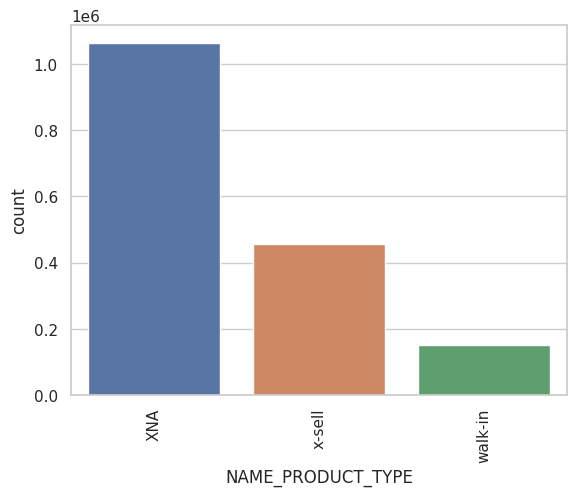

In [ ]:

sns.countplot(x="NAME_PRODUCT_TYPE", data=dfP)
plt.xticks(rotation=90)
plt.show()

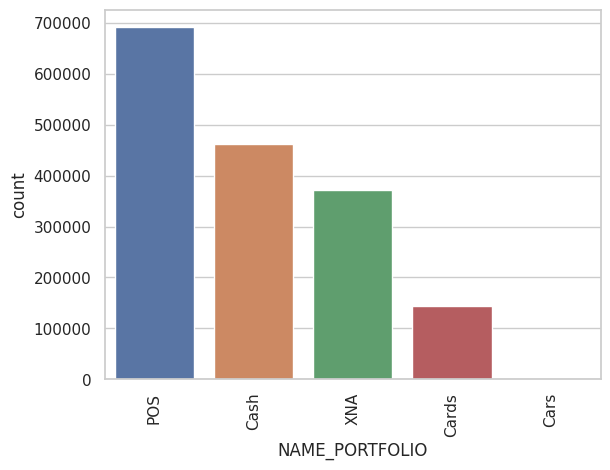

In [ ]:

sns.countplot(x="NAME_PORTFOLIO", data=dfP)
plt.xticks(rotation=90)
plt.show()

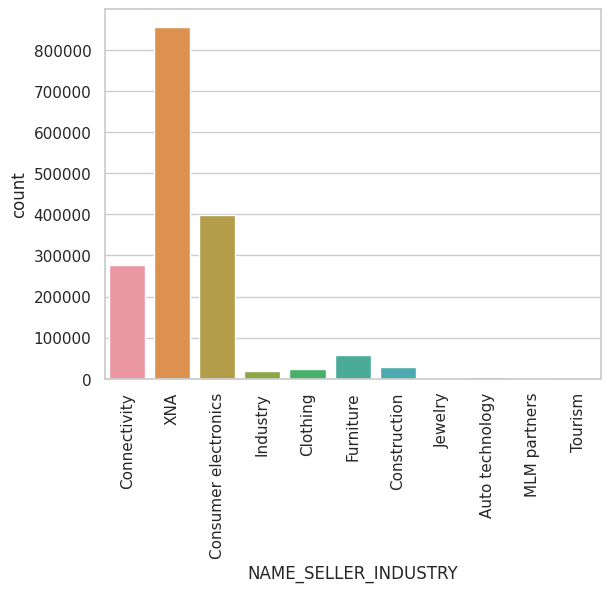

In [ ]:

sns.countplot(x="NAME_SELLER_INDUSTRY", data=dfP)
plt.xticks(rotation=90)
plt.show()

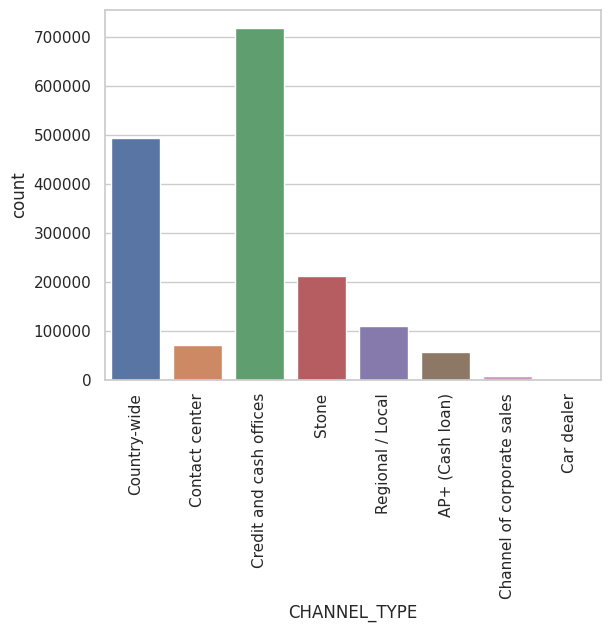

In [ ]:

sns.countplot(x="CHANNEL_TYPE", data=dfP)
plt.xticks(rotation=90)
plt.show()

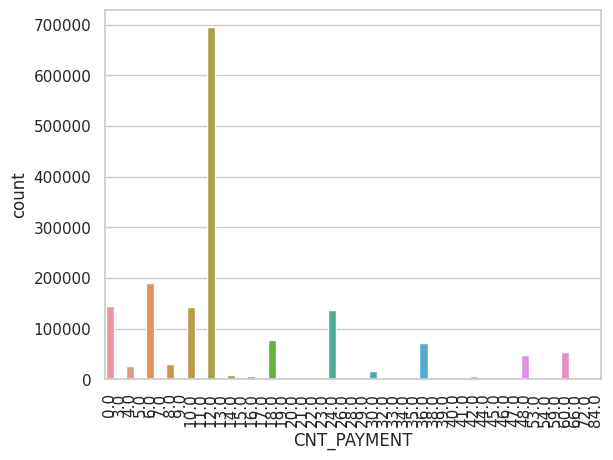

In [ ]:

sns.countplot(x="CNT_PAYMENT", data=dfP)
plt.xticks(rotation=90)
plt.show()

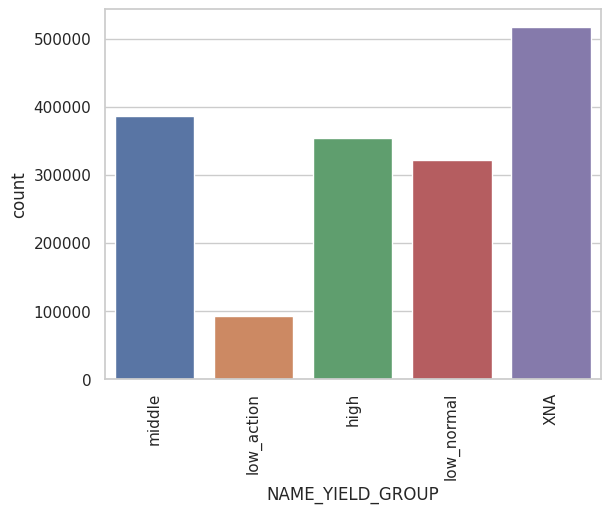

In [ ]:

sns.countplot(x="NAME_YIELD_GROUP", data=dfP)
plt.xticks(rotation=90)
plt.show()

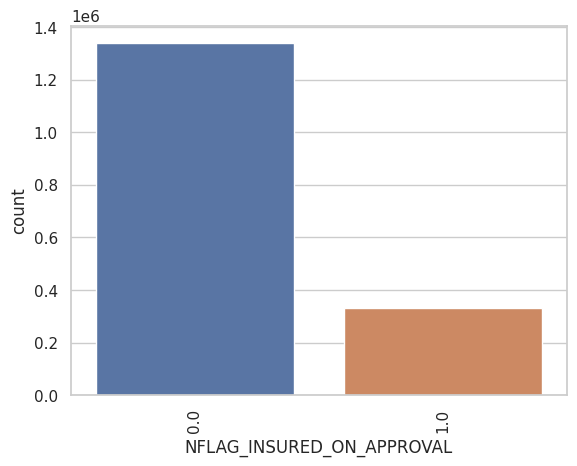

In [ ]:

sns.countplot(x="NFLAG_INSURED_ON_APPROVAL", data=dfP)
plt.xticks(rotation=90)
plt.show()

(array([0, 1, 2, 3, 4, 5, 6, 7]),
 [Text(0, 0, 'Country-wide'),
  Text(1, 0, 'Contact center'),
  Text(2, 0, 'Credit and cash offices'),
  Text(3, 0, 'Stone'),
  Text(4, 0, 'Regional / Local'),
  Text(5, 0, 'AP+ (Cash loan)'),
  Text(6, 0, 'Channel of corporate sales'),
  Text(7, 0, 'Car dealer')])

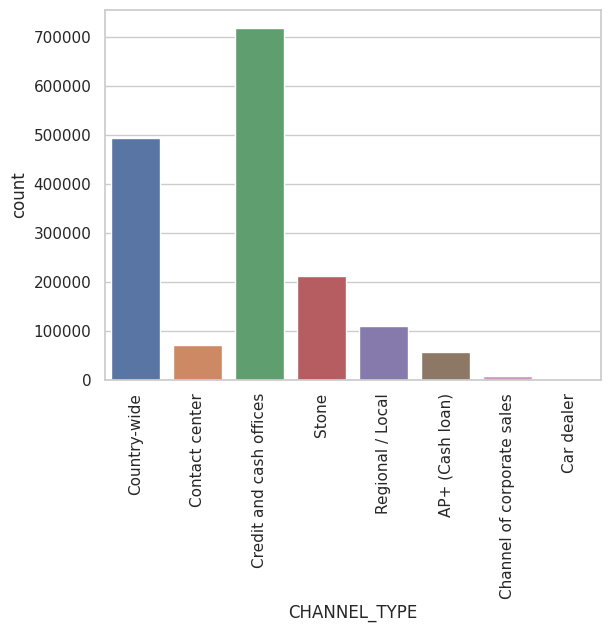

In [ ]:

sns.countplot(x="CHANNEL_TYPE", data=dfP)
plt.xticks(rotation=90)

# Merge Datasets

Lets merge application csv df and previous applicationcsv dfP to do further analysis.

In [ ]:
df_merge = df.merge(dfP, left_on='SK_ID_CURR', right_on='SK_ID_CURR', how='inner')

In [ ]:
df_merge.head(5)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE_x,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_x,AMT_ANNUITY_x,AMT_GOODS_PRICE_x,NAME_TYPE_SUITE_x,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,YEARS_EMPLOYED,YEARS_REGISTRATION,YEARS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START_x,HOUR_APPR_PROCESS_START_x,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_TOTAL,AGE_YEARS,FLAG_DOCUMENT_TOTAL,CHILDREN_FLG,FLAG_DIFF_ADDRESS,INCOME_CATEGORY,CREDIT_CATEGORY,ANNUITY_CATEGORY,GOODS_PRICE_CATEGORY,YEARS_EMPLOYED_CATEGORY,YEARS_REGISTRATION_CATEGORY,YEARS_ID_PUBLISH_CATEGORY,AGE_YEARS_CATEGORY,SK_ID_PREV,NAME_CONTRACT_TYPE_y,AMT_ANNUITY_y,AMT_APPLICATION,AMT_CREDIT_y,AMT_GOODS_PRICE_y,WEEKDAY_APPR_PROCESS_START_y,HOUR_APPR_PROCESS_START_y,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE_y,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,100002,1,Cash loans,M,N,Y,0,202500.00,406597.50,24700.50,351000.00,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.02,-9461,2,10.00,6,1,1,0,1,1,0,Laborers,1.00,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.26,0.14,2.00,2.00,2.00,2.00,-1134.00,1,26,1,0,0,medium,low,low,low,very_old,old,old,very young,1038818,Consumer loans,9251.77,179055.00,179055.00,179055.00,SATURDAY,9,Y,1,XAP,Approved,1,XNA,XAP,Unaccompanied,New,Vehicles,POS,XNA,Stone,500,Auto technology,24.00,low_normal,POS other with interest,365243.00,1.00,0.00,0.00,0.00,0.00
1,100003,0,Cash loans,F,N,N,0,270000.00,1293502.50,35698.50,1129500.00,Family,State servant,Higher education,Married,House / apartment,0.00,-16765,4,4.00,1,1,1,0,1,1,0,Core staff,2.00,1,1,MONDAY,11,0,0,0,0,0,0,School,0.62,0.54,1.00,0.00,1.00,0.00,-828.00,0,46,1,0,0,high,high,high,high,old,very_old,very_old,middles,1810518,Cash loans,98356.99,900000.00,1035882.00,900000.00,FRIDAY,12,Y,1,XNA,Approved,2,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.00,low_normal,Cash X-Sell: low,365243.00,1.00,1.00,1.00,1.00,1.00
2,100003,0,Cash loans,F,N,N,0,270000.00,1293502.50,35698.50,1129500.00,Family,State servant,Higher education,Married,House / apartment,0.00,-16765,4,4.00,1,1,1,0,1,1,0,Core staff,2.00,1,1,MONDAY,11,0,0,0,0,0,0,School,0.62,0.54,1.00,0.00,1.00,0.00,-828.00,0,46,1,0,0,high,high,high,high,old,very_old,very_old,middles,2636178,Consumer loans,64567.67,337500.00,348637.50,337500.00,SUNDAY,17,Y,1,XAP,Approved,2,Cash through the bank,XAP,Family,Refreshed,Furniture,POS,XNA,Stone,1400,Furniture,6.00,middle,POS industry with interest,365243.00,2.00,1.00,1.00,1.00,0.00
3,100003,0,Cash loans,F,N,N,0,270000.00,1293502.50,35698.50,1129500.00,Family,State servant,Higher education,Married,House / apartment,0.00,-16765,4,4.00,1,1,1,0,1,1,0,Core staff,2.00,1,1,MONDAY,11,0,0,0,0,0,0,School,0.62,0.54,1.00,0.00,1.00,0.00,-828.00,0,46,1,0,0,high,high,high,high,old,very_old,very_old,middles,2396755,Consumer loans,6737.31,68809.50,68053.50,68809.50,SATURDAY,15,Y,1,XAP,Approved,6,Cash through the bank,XAP,Family,Refreshed,Consumer Electronics,POS,XNA,Country-wide,200,Consumer electronics,12.00,middle,POS household with interest,365243.00,

In [ ]:
df_merge.shape

(1413701, 92)

In [ ]:
df_merge.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_x,AMT_ANNUITY_x,AMT_GOODS_PRICE_x,REGION_POPULATION_RELATIVE,DAYS_BIRTH,YEARS_EMPLOYED,YEARS_REGISTRATION,YEARS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START_x,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_TOTAL,AGE_YEARS,FLAG_DOCUMENT_TOTAL,CHILDREN_FLG,FLAG_DIFF_ADDRESS,SK_ID_PREV,AMT_ANNUITY_y,AMT_APPLICATION,AMT_GOODS_PRICE_y,HOUR_APPR_PROCESS_START_y,NFLAG_LAST_APPL_IN_DAY,DAYS_DECISION,SELLERPLACE_AREA,CNT_PAYMENT,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
count,1413701.00,1413701.00,1413701.00,1413701.00,1413701.00,1413701.00,1413701.00,1413701.00,1413701.00,1413701.00,1413701.00,1413701.00,1413701.00,1413701.00,1413701.00,1413701.00,1413701.00,1413701.00,1413701.00,1413701.00,1413701.00,1413701.00,1413701.00,1413701.00,1413701.00,1413701.00,1413701.00,1413701.00,1413701.00,1413701.00,1413701.00,1413701.00,1413701.00,1413701.00,1413701.00,1413701.00,1413701.00,1413701.00,1413701.00,1413701.00,1413701.00,1413701.00,1413701.00,1413701.00,1413701.00,1413701.00,1413701.00,1413701.00,1413701.00,1413701.00,1413701.00,1413701.00,1413701.00,1413701.00,1413701.00
mean,278481.29,0.09,0.40,173316.04,587553.67,27015.24,527652.18,0.02,-16321.05,199.35,14.21,8.82,1.00,0.81,0.18,1.00,0.28,0.07,2.15,2.06,2.04,11.98,0.01,0.04,0.04,0.07,0.22,0.17,0.51,0.50,1.54,0.15,1.52,0.11,-1084.70,0.81,45.21,0.92,0.29,0.25,1922744.33,14840.32,175243.59,200655.24,12.48,1.00,1.92,314.99,15.17,351380.67,26.28,57.00,129.35,138.65,0.20
std,102811.79,0.28,0.72,198573.37,384917.33,13952.43,353102.84,0.01,4344.56,392.24,9.73,4.13,0.00,0.40,0.39,0.03,0.45,0.26,0.90,0.50,0.49,3.23,0.11,0.21,0.19,0.26,0.42,0.38,0.19,0.18,2.53,0.47,2.51,0.38,799.94,0.39,11.90,0.27,0.45,0.43,532715.34,13163.70,293622.19,282018.94,3.33,0.06,2.15,7695.08,13.00,69896.96,152.78,229.58,333.41,343.52,0.40
min,100002.00,0.00,0.00,25650.00,45000.00,0.00,40500.00,0.00,-25201.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,1.00,1.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,-4292.00,0.00,21.00,0.00,0.00,0.00,1000001.00,0.00,0.00,0.00,0.00,0.00,0.00,-1.00,0.00,-2922.00,0.00,0.00,0.00,0.00,0.00
25%,189364.00,0.00,0.00,112500.00,270000.00,16816.50,238500.00,0.01,-19980.00,3.00,6.00,5.00,1.00,1.00,0.00,1.00,0.00,0.00,2.00,2.00,2.00,10.00,0.00,0.00,0.00,0.00,0.00,0.00,0.39,0.38,0.00,0.00,0.00,0.00,-1683.00,1.00,35.00,1.00,0.00,0.00,1461346.00,7406.06,19750.50,66375.00,10.00,1.00,0.00,-1.00,10.00,365243.00,2.00,0.00,1.00,1.00,0.00
50%,278992.00,0.00,0.00,157500.00,508495.50,24925.50,450000.00,0.02,-16044.00,7.00,13.00,10.00,1.00,1.00,0.00,1.00,0.00,0.00,2.00,2.00,2.00,12.00,0.00,0.00,0.00,0.00,0.00,0.00,0.56,0.54,0.00,0.00,0.00,0.00,-1011.00,1.00,44.00,1.00,0.00,0.00,1922698.00,11250.00,70870.50,112320.00,12.00,1.00,1.00,4.00,12.00,365243.00,2.00,0.00,1.00,1.00,0.00
75%,367556.00,0.00,1.00,207000.00,807984.00,34542.00,679500.00,0.03,-12739.00,18.00,21.00,12.00,1.00,1.00,0.00,1.00,1.00,0.00,3.00,2.00,2.00,14.00,0.00,0.00,0.00,0.00,0.00,0.00,0.66,0.62,2.00,0.00,2.00,0.00,-396.00,1.00,55.00,1.00,1.00,0.00,2384012.00,16747.97,180000.00,180000.00,15.00,1.00,3.00,85.00,18.00,365243.00,3.00,2.00,4.00,4.00,0.00
max,456255.00,1.00,19.00,117000000.00,4050000.00,225000.00,4050000.00,0.07,-7489.00,1000.00,68.00,20.00,1.00,1.00,1.00,1.00,1.00,1.00,20.00,3.00,3.00,23.00,1.00,1.00,1.00,1.00,1.00,1.00,0.85,0.90,348.00,34.00,344.00,24.00,0.00,1.00,70.00,1.00,1.00,1.00,2845381.00,418058.15,5850000.00,5850000.00,23.00,1.00,8.00,4000000.00,84.00,365243

In [ ]:
df_merge.isnull().sum()

SK_ID_CURR                   0
TARGET                       0
NAME_CONTRACT_TYPE_x         0
CODE_GENDER                  0
FLAG_OWN_CAR                 0
                            ..
DAYS_FIRST_DUE               0
DAYS_LAST_DUE_1ST_VERSION    0
DAYS_LAST_DUE                0
DAYS_TERMINATION             0
NFLAG_INSURED_ON_APPROVAL    0
Length: 92, dtype: int64

In [ ]:
df_merge['NAME_CONTRACT_STATUS'].value_counts().sort_values(ascending = False)

Approved        886099
Canceled        259441
Refused         245390
Unused offer     22771
Name: NAME_CONTRACT_STATUS, dtype: int64

In [ ]:
df_merge.head(5)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE_x,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_x,AMT_ANNUITY_x,AMT_GOODS_PRICE_x,NAME_TYPE_SUITE_x,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,YEARS_EMPLOYED,YEARS_REGISTRATION,YEARS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START_x,HOUR_APPR_PROCESS_START_x,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_TOTAL,AGE_YEARS,FLAG_DOCUMENT_TOTAL,CHILDREN_FLG,FLAG_DIFF_ADDRESS,INCOME_CATEGORY,CREDIT_CATEGORY,ANNUITY_CATEGORY,GOODS_PRICE_CATEGORY,YEARS_EMPLOYED_CATEGORY,YEARS_REGISTRATION_CATEGORY,YEARS_ID_PUBLISH_CATEGORY,AGE_YEARS_CATEGORY,SK_ID_PREV,NAME_CONTRACT_TYPE_y,AMT_ANNUITY_y,AMT_APPLICATION,AMT_CREDIT_y,AMT_GOODS_PRICE_y,WEEKDAY_APPR_PROCESS_START_y,HOUR_APPR_PROCESS_START_y,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE_y,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,100002,1,Cash loans,M,N,Y,0,202500.00,406597.50,24700.50,351000.00,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.02,-9461,2,10.00,6,1,1,0,1,1,0,Laborers,1.00,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.26,0.14,2.00,2.00,2.00,2.00,-1134.00,1,26,1,0,0,medium,low,low,low,very_old,old,old,very young,1038818,Consumer loans,9251.77,179055.00,179055.00,179055.00,SATURDAY,9,Y,1,XAP,Approved,1,XNA,XAP,Unaccompanied,New,Vehicles,POS,XNA,Stone,500,Auto technology,24.00,low_normal,POS other with interest,365243.00,1.00,0.00,0.00,0.00,0.00
1,100003,0,Cash loans,F,N,N,0,270000.00,1293502.50,35698.50,1129500.00,Family,State servant,Higher education,Married,House / apartment,0.00,-16765,4,4.00,1,1,1,0,1,1,0,Core staff,2.00,1,1,MONDAY,11,0,0,0,0,0,0,School,0.62,0.54,1.00,0.00,1.00,0.00,-828.00,0,46,1,0,0,high,high,high,high,old,very_old,very_old,middles,1810518,Cash loans,98356.99,900000.00,1035882.00,900000.00,FRIDAY,12,Y,1,XNA,Approved,2,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.00,low_normal,Cash X-Sell: low,365243.00,1.00,1.00,1.00,1.00,1.00
2,100003,0,Cash loans,F,N,N,0,270000.00,1293502.50,35698.50,1129500.00,Family,State servant,Higher education,Married,House / apartment,0.00,-16765,4,4.00,1,1,1,0,1,1,0,Core staff,2.00,1,1,MONDAY,11,0,0,0,0,0,0,School,0.62,0.54,1.00,0.00,1.00,0.00,-828.00,0,46,1,0,0,high,high,high,high,old,very_old,very_old,middles,2636178,Consumer loans,64567.67,337500.00,348637.50,337500.00,SUNDAY,17,Y,1,XAP,Approved,2,Cash through the bank,XAP,Family,Refreshed,Furniture,POS,XNA,Stone,1400,Furniture,6.00,middle,POS industry with interest,365243.00,2.00,1.00,1.00,1.00,0.00
3,100003,0,Cash loans,F,N,N,0,270000.00,1293502.50,35698.50,1129500.00,Family,State servant,Higher education,Married,House / apartment,0.00,-16765,4,4.00,1,1,1,0,1,1,0,Core staff,2.00,1,1,MONDAY,11,0,0,0,0,0,0,School,0.62,0.54,1.00,0.00,1.00,0.00,-828.00,0,46,1,0,0,high,high,high,high,old,very_old,very_old,middles,2396755,Consumer loans,6737.31,68809.50,68053.50,68809.50,SATURDAY,15,Y,1,XAP,Approved,6,Cash through the bank,XAP,Family,Refreshed,Consumer Electronics,POS,XNA,Country-wide,200,Consumer electronics,12.00,middle,POS household with interest,365243.00,

In [ ]:
df_merge['NAME_CONTRACT_TYPE_x'].value_counts().sort_values(ascending = False)

Cash loans         1307115
Revolving loans     106586
Name: NAME_CONTRACT_TYPE_x, dtype: int64

# Univariate Analysis

In [ ]:
df_merge['CODE_REJECT_REASON'].value_counts()

XAP       1145533
HC         145984
LIMIT       47773
SCO         32636
CLIENT      22771
SCOFR       10875
XNA          4378
VERIF        3079
SYSTEM        672
Name: CODE_REJECT_REASON, dtype: int64

<Axes: xlabel='CODE_REJECT_REASON', ylabel='count'>

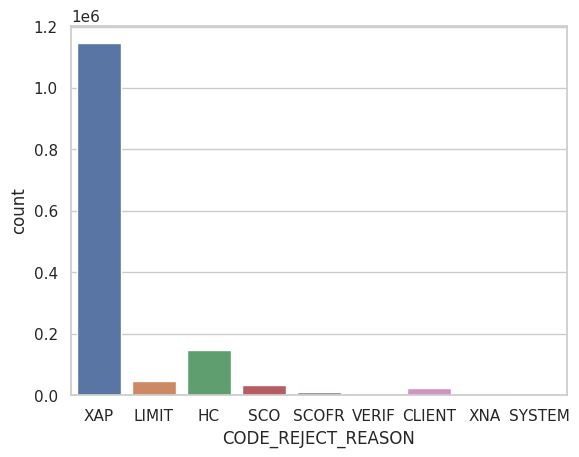

In [ ]:
sns.countplot(x=df_merge['CODE_REJECT_REASON'])

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24]),
 [Text(0, 0, 'XAP'),
  Text(1, 0, 'XNA'),
  Text(2, 0, 'Other'),
  Text(3, 0, 'Payments on other loans'),
  Text(4, 0, 'Buying a used car'),
  Text(5, 0, 'Repairs'),
  Text(6, 0, 'Education'),
  Text(7, 0, 'Buying a new car'),
  Text(8, 0, 'Everyday expenses'),
  Text(9, 0, 'Medicine'),
  Text(10, 0, 'Car repairs'),
  Text(11, 0, 'Urgent needs'),
  Text(12, 0, 'Buying a holiday home / land'),
  Text(13, 0, 'Building a house or an annex'),
  Text(14, 0, 'Furniture'),
  Text(15, 0, 'Journey'),
  Text(16, 0, 'Purchase of electronic equipment'),
  Text(17, 0, 'Wedding / gift / holiday'),
  Text(18, 0, 'Buying a home'),
  Text(19, 0, 'Business development'),
  Text(20, 0, 'Gasification / water supply'),
  Text(21, 0, 'Buying a garage'),
  Text(22, 0, 'Hobby'),
  Text(23, 0, 'Money for a third person'),
  Text(24, 0, 'Refusal to name the goal')])

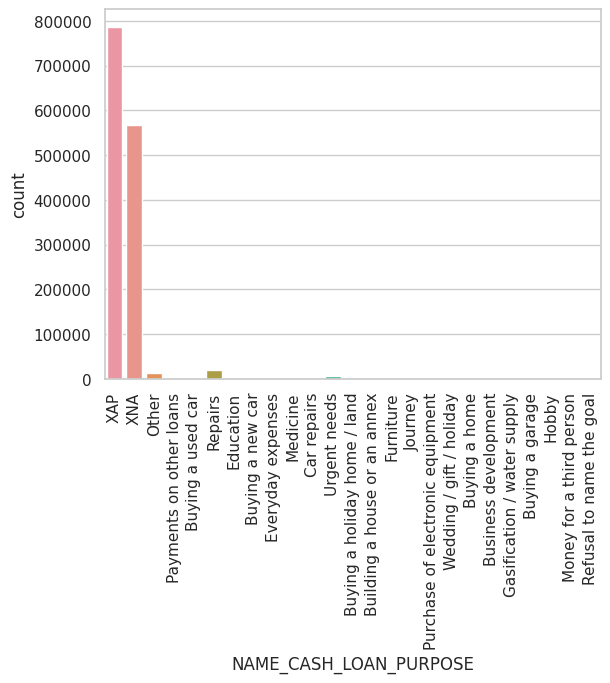

In [ ]:
df_merge['NAME_CASH_LOAN_PURPOSE'].value_counts()
sns.countplot(x=df_merge['NAME_CASH_LOAN_PURPOSE'])
plt.xticks(rotation=90)

<Axes: xlabel='NAME_CONTRACT_STATUS', ylabel='count'>

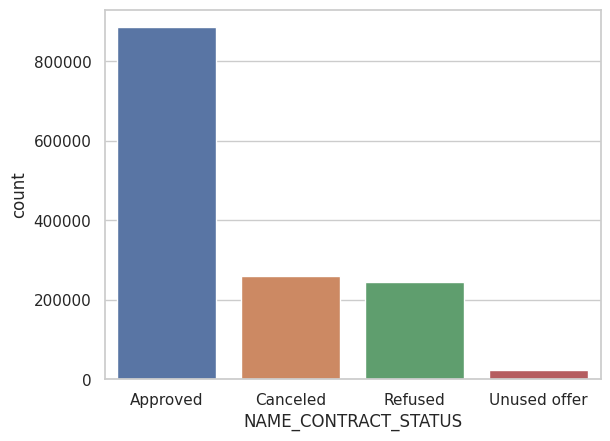

In [ ]:
df_merge['NAME_CONTRACT_STATUS'].value_counts()
sns.countplot(x=df_merge['NAME_CONTRACT_STATUS'])

In [ ]:
df_merge['DAYS_DECISION'].value_counts()

0    499277
1    309943
2    179347
3    112253
4     86674
6     85330
7     70402
5     70060
8       415
Name: DAYS_DECISION, dtype: int64

(array([4.99277e+05, 3.09943e+05, 1.79347e+05, 1.12253e+05, 0.00000e+00,
        8.66740e+04, 7.00600e+04, 8.53300e+04, 7.04020e+04, 4.15000e+02]),
 array([0. , 0.8, 1.6, 2.4, 3.2, 4. , 4.8, 5.6, 6.4, 7.2, 8. ]),
 <BarContainer object of 10 artists>)

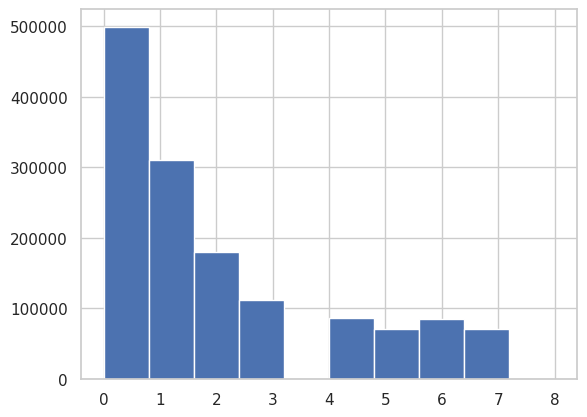

In [ ]:
df_merge['DAYS_DECISION'].value_counts()
plt.hist(x=df_merge['DAYS_DECISION'])

In [ ]:
cols=["CODE_GENDER" ,"FLAG_OWN_CAR","FLAG_OWN_REALTY", "CNT_CHILDREN", "NAME_FAMILY_STATUS" , "WEEKDAY_APPR_PROCESS_START_x", "NAME_CONTRACT_TYPE_y",

"HOUR_APPR_PROCESS_START_x",  "INCOME_CATEGORY",	"CREDIT_CATEGORY"	,"ANNUITY_CATEGORY"	,"GOODS_PRICE_CATEGORY", "YEARS_EMPLOYED_CATEGORY"	,"YEARS_REGISTRATION_CATEGORY",	"YEARS_ID_PUBLISH_CATEGORY",	"AGE_YEARS_CATEGORY",


 "NAME_PRODUCT_TYPE"  ,"NAME_CLIENT_TYPE" ,"NAME_PORTFOLIO"  ]

In [ ]:
COLS2=["PRODUCT_COMBINATION", "NAME_SELLER_INDUSTRY", "NAME_GOODS_CATEGORY", "CHANNEL_TYPE", "ORGANIZATION_TYPE", "OCCUPATION_TYPE", "NAME_HOUSING_TYPE", "NAME_EDUCATION_TYPE", "NAME_TYPE_SUITE_x",  "NAME_INCOME_TYPE"]

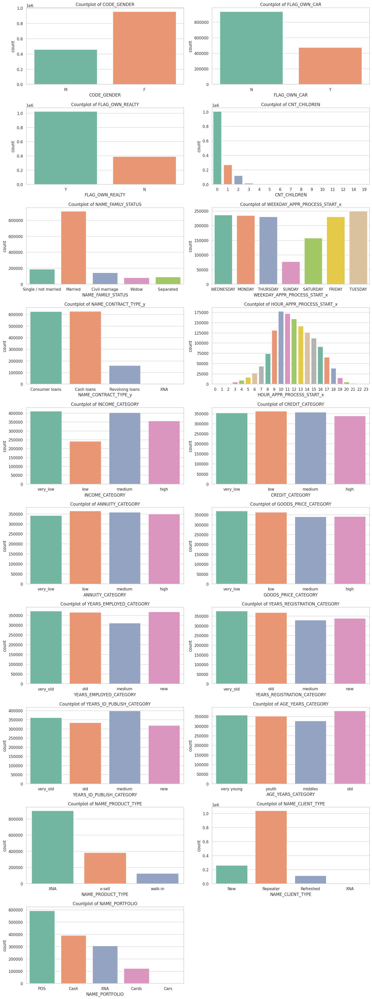

In [ ]:


# Set the aesthetic style of the plots
sns.set(style="whitegrid")

# Define the number of columns and rows for subplots
n_cols = 2
n_rows = int(len(cols) / n_cols) + (len(cols) % n_cols > 0)

# Create a figure with specified dimensions
plt.figure(figsize=(15, 4 * n_rows))

# Loop through each column in cols and create a countplot
for i, col in enumerate(cols):
    plt.subplot(n_rows, n_cols, i+1)
    sns.countplot(x=col, data=df_merge, palette="Set2")
    plt.title(f'Countplot of {col}')


    plt.tight_layout()

# Show the plots
plt.show()


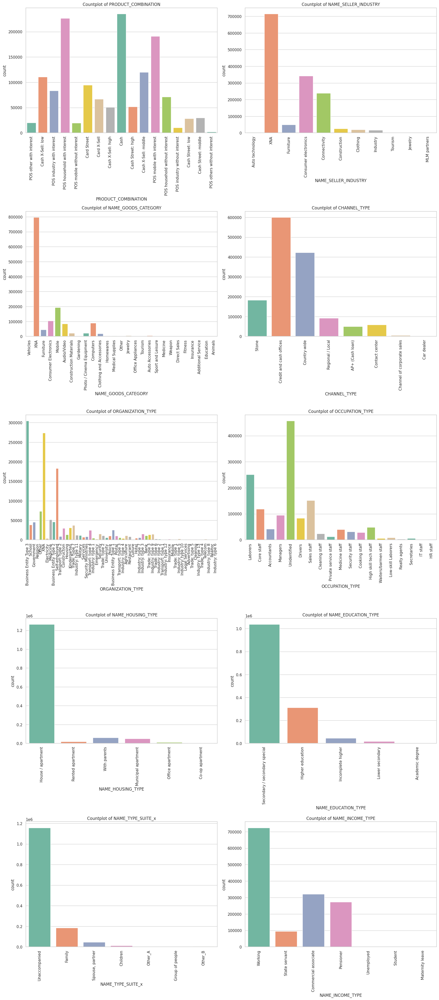

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt


# Set the aesthetic style of the plots
sns.set(style="whitegrid")

# Define the number of columns and rows for subplots
n_cols = 2
n_rows = int(len(cols) / n_cols) + (len(cols) % n_cols > 0)

# Create a figure with specified dimensions
plt.figure(figsize=(18, 8 * n_rows))

# Loop through each column in cols and create a countplot
for i, col in enumerate(COLS2):

    plt.subplot(n_rows, n_cols, i+1)
    sns.countplot(x=col, data=df_merge, palette="Set2")
    plt.title(f'Countplot of {col}')
    plt.xticks(rotation=90)


    plt.tight_layout()

# Show the plots
plt.show()

# Bivariate/Multivariate Analysis

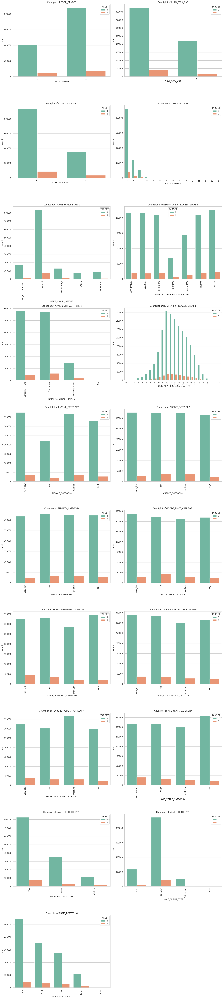

In [ ]:

# Set the aesthetic style of the plots
sns.set(style="whitegrid")

# Define the number of columns and rows for subplots
n_cols = 2
n_rows = int(len(cols) / n_cols) + (len(cols) % n_cols > 0)

# Create a figure with specified dimensions
plt.figure(figsize=(18, 8 * n_rows))

# Loop through each column in cols and create a countplot
for i, col in enumerate(cols):

    plt.subplot(n_rows, n_cols, i+1)
    sns.countplot(x=col, data=df_merge, hue='TARGET', palette="Set2")
    plt.title(f'Countplot of {col}')
    plt.xticks(rotation=90)


    plt.tight_layout()

# Show the plots
plt.show()

Clients who had previous application for POS are more likely to be default, followed by Cash, XNA and Cards.

Clients who are repeater are more likely to be default compared to new clients and then refreshed .

X-Sell products are more likely to be bought by default clients than walk in.

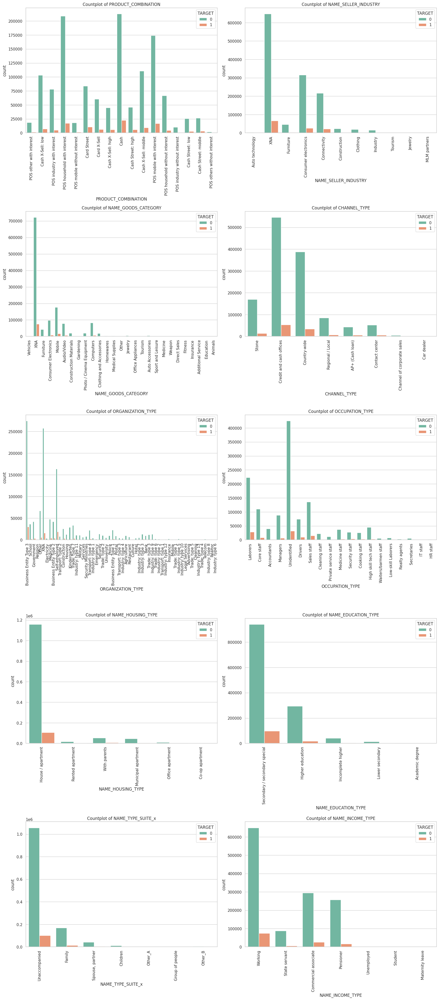

In [ ]:

# Set the aesthetic style of the plots
sns.set(style="whitegrid")

# Define the number of columns and rows for subplots
n_cols = 2
n_rows = int(len(cols) / n_cols) + (len(cols) % n_cols > 0)

# Create a figure with specified dimensions
plt.figure(figsize=(18, 8 * n_rows))

# Loop through each column in cols and create a countplot
for i, col in enumerate(COLS2):

    plt.subplot(n_rows, n_cols, i+1)
    sns.countplot(x=col, data=df_merge, hue='TARGET', palette="Set2")
    plt.title(f'Countplot of {col}')
    plt.xticks(rotation=90)


    plt.tight_layout()

# Show the plots
plt.show()

Clients coming from unidentified occupation type have maxiumum chances of being defaulters, followed by Labourers, Sales staff, Drivers and Core Staff and lastly managers. Clients from other occupation type contribute very less to being default client

In [ ]:
df_merge.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1413701 entries, 0 to 1413700
Data columns (total 92 columns):
 #   Column                        Non-Null Count    Dtype   
---  ------                        --------------    -----   
 0   SK_ID_CURR                    1413701 non-null  int64   
 1   TARGET                        1413701 non-null  int64   
 2   NAME_CONTRACT_TYPE_x          1413701 non-null  object  
 3   CODE_GENDER                   1413701 non-null  object  
 4   FLAG_OWN_CAR                  1413701 non-null  object  
 5   FLAG_OWN_REALTY               1413701 non-null  object  
 6   CNT_CHILDREN                  1413701 non-null  int64   
 7   AMT_INCOME_TOTAL              1413701 non-null  float64 
 8   AMT_CREDIT_x                  1413701 non-null  float64 
 9   AMT_ANNUITY_x                 1413701 non-null  float64 
 10  AMT_GOODS_PRICE_x             1413701 non-null  float64 
 11  NAME_TYPE_SUITE_x             1413701 non-null  object  
 12  NAME_INCOME_TY

**Further Analysis of Status of Application with other Categorical Columns**

In [ ]:
NAME_CASH_LOAN_PURPOSE NAME_CONTRACT_STATUS. DAYS_DECISION NAME_PAYMENT_TYPE AMT_DOWN_PAYMENT

["NAME_TYPE_SUITE"   ,      "NAME_CLIENT_TYPE"        "NAME_GOODS_CATEGORY"     "NAME_PORTFOLIO"          "NAME_PRODUCT_TYPE"       "CHANNEL_TYPE"            SELLERPLACE_AREA        NAME_SELLER_INDUSTRY    CNT_PAYMENT

In [ ]:
statcols=['NAME_CASH_LOAN_PURPOSE', 'DAYS_DECISION', 'NAME_PAYMENT_TYPE', 'NAME_TYPE_SUITE_y' , 'NAME_CLIENT_TYPE','SELLERPLACE_AREA','CHANNEL_TYPE','NAME_PORTFOLIO','NAME_GOODS_CATEGORY', 'NAME_SELLER_INDUSTRY']

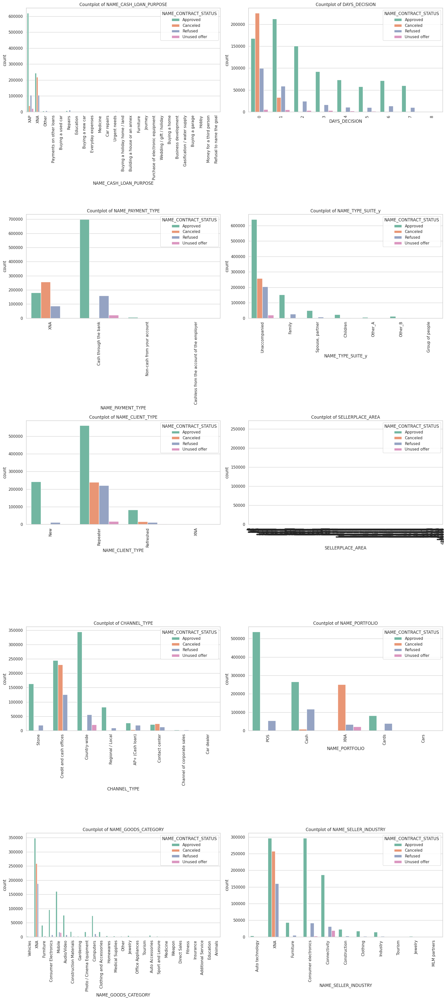

In [ ]:

# Set the aesthetic style of the plots
sns.set(style="whitegrid")

# Define the number of columns and rows for subplots
n_cols = 2
n_rows = int(len(statcols) / n_cols) + (len(statcols) % n_cols > 0)

# Create a figure with specified dimensions
plt.figure(figsize=(18, 8 * n_rows))

# Loop through each column in cols and create a countplot
for i, col in enumerate(statcols):

    plt.subplot(n_rows, n_cols, i+1)
    sns.countplot(x=col, data=df_merge, hue='NAME_CONTRACT_STATUS', palette="Set2")
    plt.title(f'Countplot of {col}')
    plt.xticks(rotation=90)


    plt.tight_layout()

# Show the plots
plt.show()

**Observations**



* Maximum applications are approved in time interval of 1 day followed by 0 day and 2 days.

* Most applications of Cash though bank payment type are approved.

* Client who is unaccompanied when applying geas the highest approval rate and cancellation rate as most of the clients are unaccompanied while application.
Applications of Client who are repeaters  have most acceptance rate

* Applications with channel type as country-wide has the maximum acceptance rate, followed by credit and cash offices.
However Credit and cash offices has also the maximum refusal rate.

* Applications from POS name portfolio has the maximum acceptance rate
While XNA category has highest refusal rate.

* Applications for XNA as goods category has highest approval rate, followed by Mobiles, electronics, audio-video and computer goods.

* Applications from consumer electronics and XNA as seller industry has the maximum acceptance rate followed by connectivity seller industry.




In [ ]:
df_merge.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1413701 entries, 0 to 1413700
Data columns (total 92 columns):
 #   Column                        Non-Null Count    Dtype   
---  ------                        --------------    -----   
 0   SK_ID_CURR                    1413701 non-null  int64   
 1   TARGET                        1413701 non-null  int64   
 2   NAME_CONTRACT_TYPE_x          1413701 non-null  object  
 3   CODE_GENDER                   1413701 non-null  object  
 4   FLAG_OWN_CAR                  1413701 non-null  object  
 5   FLAG_OWN_REALTY               1413701 non-null  object  
 6   CNT_CHILDREN                  1413701 non-null  int64   
 7   AMT_INCOME_TOTAL              1413701 non-null  float64 
 8   AMT_CREDIT_x                  1413701 non-null  float64 
 9   AMT_ANNUITY_x                 1413701 non-null  float64 
 10  AMT_GOODS_PRICE_x             1413701 non-null  float64 
 11  NAME_TYPE_SUITE_x             1413701 non-null  object  
 12  NAME_INCOME_TY

**Lets Analyse the Numerical columns**

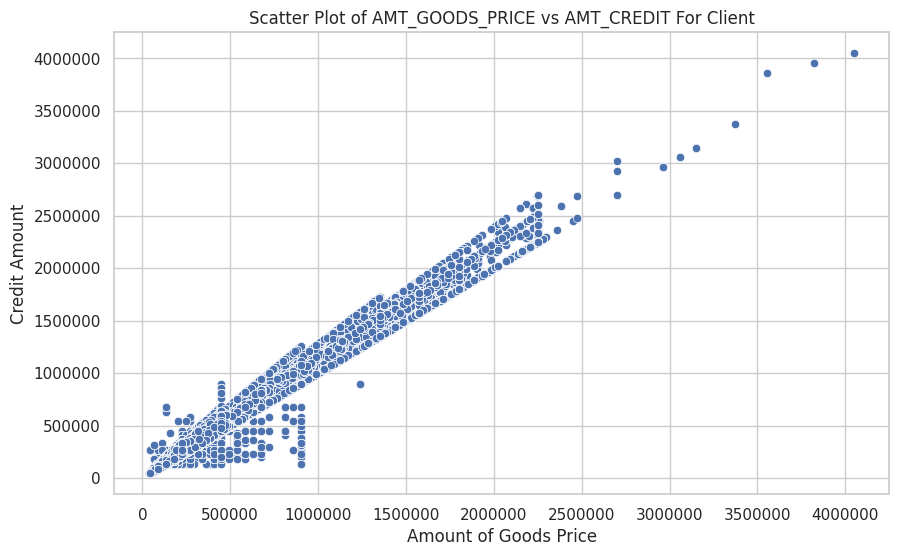

In [ ]:

plt.figure(figsize=(10, 6))
sns.scatterplot(x='AMT_GOODS_PRICE_x', y='AMT_CREDIT_x', data=df_merge)

plt.title('Scatter Plot of AMT_GOODS_PRICE vs AMT_CREDIT For Client')
plt.xlabel('Amount of Goods Price')
plt.ylabel('Credit Amount')
plt.ticklabel_format(style='plain', axis='x')
plt.ticklabel_format(style='plain', axis='y')
plt.show()

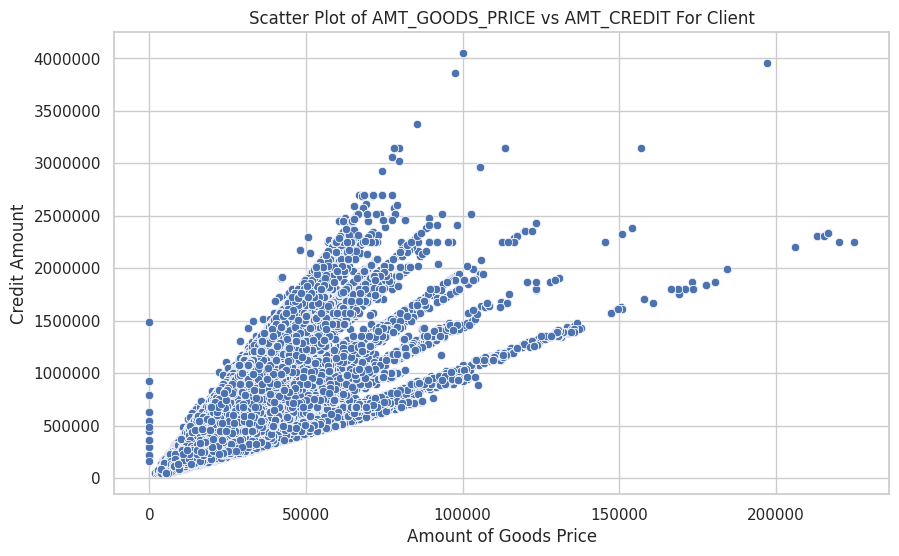

In [ ]:



plt.figure(figsize=(10, 6))
sns.scatterplot(x='AMT_ANNUITY_x', y='AMT_CREDIT_x', data=df_merge)

plt.title('Scatter Plot of AMT_ANNUITY_x vs AMT_CREDIT For Client')
plt.xlabel('Amount Annuity')
plt.ylabel('Credit Amount')
plt.ticklabel_format(style='plain', axis='x')
plt.ticklabel_format(style='plain', axis='y')
plt.show()

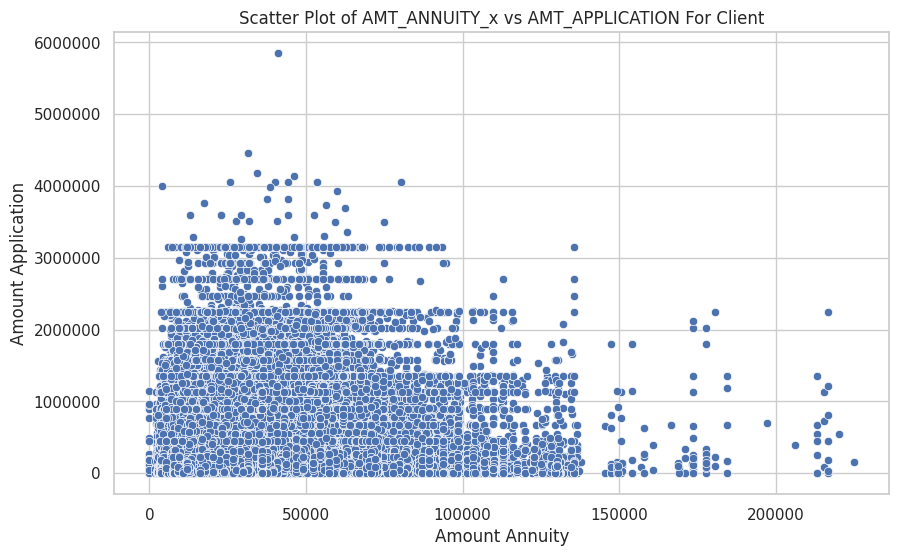

In [ ]:



plt.figure(figsize=(10, 6))
sns.scatterplot(x='AMT_ANNUITY_x', y='AMT_APPLICATION', data=df_merge)

plt.title('Scatter Plot of AMT_ANNUITY_x vs AMT_APPLICATION For Client')
plt.xlabel('Amount Annuity')
plt.ylabel('Amount Application')
plt.ticklabel_format(style='plain', axis='x')
plt.ticklabel_format(style='plain', axis='y')
plt.show()

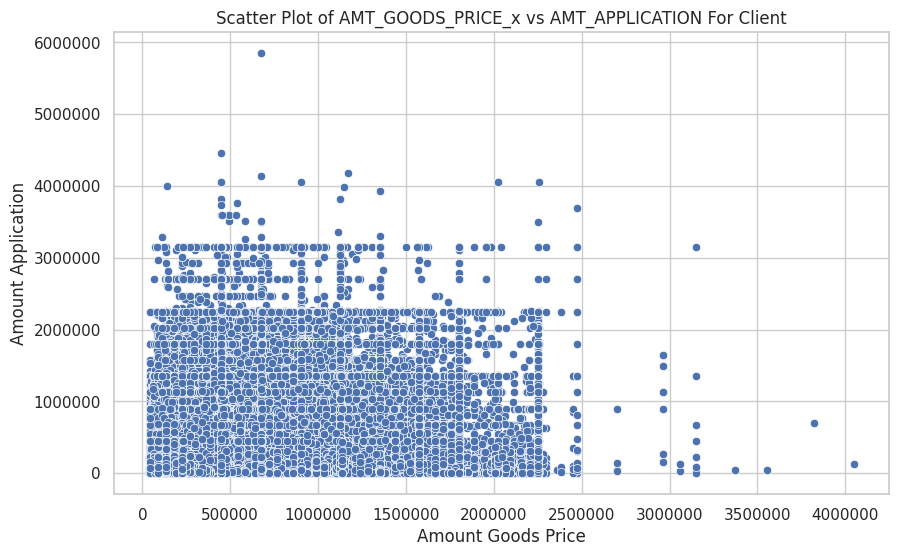

In [ ]:



plt.figure(figsize=(10, 6))
sns.scatterplot(x='AMT_GOODS_PRICE_x', y='AMT_APPLICATION', data=df_merge)

plt.title('Scatter Plot of AMT_GOODS_PRICE_x vs AMT_APPLICATION For Client')
plt.xlabel('Amount Goods Price')
plt.ylabel('Amount Application')
plt.ticklabel_format(style='plain', axis='x')
plt.ticklabel_format(style='plain', axis='y')
plt.show()

# **Correlation Analysis**

In [ ]:
corr_merge_df = df_merge[['AMT_ANNUITY_x', 'AMT_APPLICATION','AMT_CREDIT_x', 'AMT_GOODS_PRICE_x',
                    'AMT_ANNUITY_y', 'AMT_CREDIT_y', 'AMT_GOODS_PRICE_y', 'CNT_PAYMENT']].corr()

In [ ]:
corr_merge_df.head()

,AMT_ANNUITY_x,AMT_APPLICATION,AMT_CREDIT_x,AMT_GOODS_PRICE_x,AMT_ANNUITY_y,AMT_GOODS_PRICE_y,CNT_PAYMENT
AMT_ANNUITY_x,1.00,0.11,0.76,0.76,0.18,0.12,-0.00
AMT_APPLICATION,0.11,1.00,0.12,0.12,0.81,0.99,0.68
AMT_CREDIT_x,0.76,0.12,1.00,0.99,0.14,0.12,0.04
AMT_GOODS_PRICE_x,0.76,0.12,0.99,1.00,0.14,0.12,0.03
AMT_ANNUITY_y,0.18,0.81,0.14,0.14,1.00,0.82,0.41


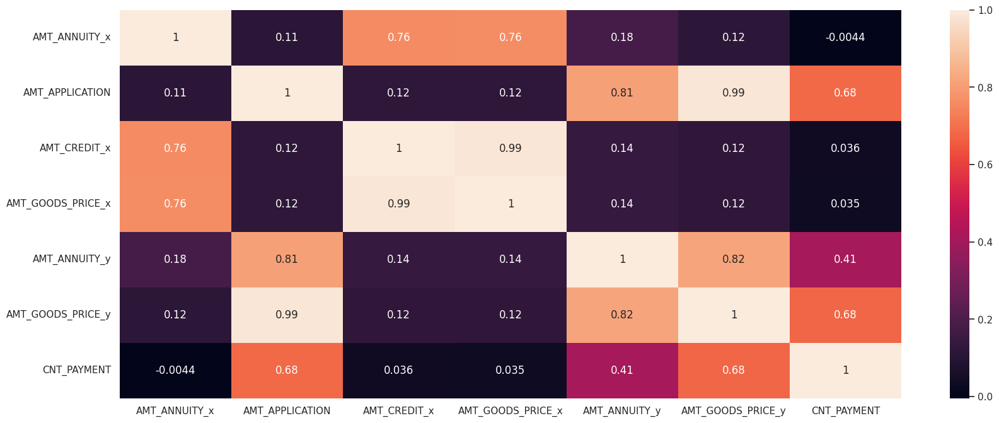

In [ ]:
plt.figure(figsize = (20,8))
sns.heatmap(data = corr_merge_df, annot = True)
plt.show()

#**Observations from Heatmap**



*   AMT_APPLICATION demonstrates a strong correlation with AMT_ANNUITY_y,AMT_GOODS_PRICE_y
*  AMT_GOODS_PRICE_y is strongly correlated with AMT_ANNUITY_y, AMT_CREDIT_y, and AMT_APPLICATION, and shows a considerable correlation with CNT_PAYMENT.


*    AMT_CREDIT_y exhibits a strong correlation with AMT_GOODS_PRICE_y and a considerable correlation with CNT_PAYMENT.

*    AMT_ANNUITY_x is highly correlated with both AMT_GOODS_PRICE_y and AMT_CREDIT_y.
*   
  Additionally, AMT_ANNUITY_x has a strong correlation with AMT_GOODS_PRICE_x and AMT_CREDIT_x.


*   Finally, AMT_CREDIT_x is strongly correlated with AMT_GOODS_PRICE_x.






# **Key Takeaways**

**Gender and Default Risk:**

* Females are more likely to be defaulters.

**Contract Type and Default Behavior:**

* Majority are Cash Loans; clients with cash loans tend to be defaulters to a small extent.
* Clients with revolving loans show almost no default behavior.

**Realty Ownership and Loan Payment:**

* Clients who own realty are more likely to default compared to those who don't.
* A large portion of clients own realty, which might bias this conclusion.

**Income Level and Default Likelihood:**

Very low income clients are most likely to default, followed by medium, low, and high income ranges.
Goods Price and Default Tendency:

* Clients purchasing low-price goods are most likely to default, followed by very low, medium, and high price ranges.

**Employment History and Defaulting:**

* Longer employment history correlates with a higher likelihood of defaulting; newer employees have a lower default rate.

****Age and Default Rates:**

* Younger clients are more likely to default, with the rate decreasing as age increases.

**Car Ownership and Defaulting:**

* Clients who own a car are less likely to default.

**Housing Type and Defaulting:**

* Apartment dwellers are more likely to default, followed by those living with parents.

**Marital Status and Defaulting:**

* Married clients are more likely to default, followed by single clients and those in civil marriages.

**Income Type and Defaulting:**

* Working clients are most likely to default, followed by commercial associates, pensioners, and state servants.

**Education Level and Defaulting:**

* Secondary education holders are more likely to default, followed by those with higher education.

**Organization Type and Defaulting:**

* Clients from Business Entity Type 3, Self-employed, XNA, and other types are more prone to defaulting.

**Occupation Type and Defaulting:**

* Unidentified occupations have the highest default rate, followed by laborers, sales staff, drivers, core staff, and managers. Other occupations contribute * less to default rates.

**Client History and Defaulting:**

* Repeat clients are more likely to default compared to new and refreshed clients.
* X-Sell products are commonly purchased by defaulting clients.

**Family Size and Defaulting:**

* Clients with no children have the highest default rate, decreasing with more children.

**Previous Loan Purpose and Defaulting:**

* Previous applications for POS have a higher default rate, followed by cash, XNA, and cards.

**Document Submission and Defaulting:**

* Clients who don't submit all documents tend to default.

**Application Dates and Defaulting:**

* Tuesdays and Wednesdays see most defaults, with weekends having fewer due to fewer applications.

**Application Time and Defaulting:**

* Most applications are made between 8 am and 4 pm, peaking at 10-11 am, forming a parabola shape in default rates.

**Approval Time and Application Type:**

* Most approvals occur within 1 day.
* Cash through bank payment types are predominantly approved.
* Unaccompanied applicants have the highest approval and cancellation rates.
Repeat applicants have a high acceptance rate.

**Channel Type and Application Outcome:**

* Country-wide channels have the highest acceptance rate, followed by credit and cash offices, which also have the highest refusal rate.

**Portfolio Name and Application Outcome:**

* POS name portfolio has the highest acceptance rate, while XNA has the highest refusal rate.

**Goods Category and Application Outcome:**

* XNA category in goods has the highest approval rate, followed by mobiles, electronics, audio-video, and computers.

**Seller Industry and Application Outcome:**

* Consumer electronics and XNA in seller industry lead in acceptance rates, followed by connectivity.




